In [1]:
import os
import sys
import pandas as pd
import geopandas as gpd
from tqdm import tqdm
import pandas as pd
from tqdm import tqdm
import numpy as np
from scipy.stats import pearsonr, spearmanr
from datetime import datetime
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from importlib import reload
import matplotlib.pyplot as plt

In [2]:
import os
import sys
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt

In [3]:
import calplot

In [4]:
sys.path.append("../../src")
import main

In [5]:
year = 'year'
var = 'BuAre_sum'
radius = 300

In [6]:
temp = pd.read_csv('/Users/lisawink/Documents/paper1/data/processed_data/temp_synoptic_controls_2024.csv')

In [7]:
# read in from fig12_diurnal_plot.ipynb
stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{year,var,radius}.csv') 
stats_dict['Time'] = pd.to_datetime(stats_dict['Time'])

date_to_fraction_of_day = temp.set_index('datetime_UTC')['fraction_of_day'].to_dict()
day_to_fraction_of_night = temp.set_index('datetime_UTC')['fraction_of_night'].to_dict()
stats_dict['fraction_of_day'] = stats_dict['Time'].astype(str).map(date_to_fraction_of_day)
stats_dict['fraction_of_night'] = stats_dict['Time'].astype(str).map(day_to_fraction_of_night)

In [9]:
stats_dict['Date'] = stats_dict['Time'].dt.date

In [10]:
stats_dict['Date'] = stats_dict['Date'].astype(str)

In [11]:
def find_closest_to_perc(df, column_name, percentage=0.5):
    df['Date'] = df['Time'].dt.date
    df['Date'] = df['Date'].astype(str)
    list = []
    for date in df['Date'].unique():
        # Convert the column to a numpy array for faster computation
        values = df[df['Date'] == date][column_name]
        # Find the closest value using numpy
        closest_value = (values - percentage).abs().idxmin()
        list.append(closest_value)
    return df.loc[list]


In [12]:
df = find_closest_to_perc(stats_dict, 'fraction_of_night', percentage=0.1)

In [24]:
def plot_calplot(year, var, radius, hour=None, fraction_of_day=None, fraction_of_night=None):
    #stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{year,var,radius}.csv') 
    stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/altitude_out/2024/{year,var,radius}.csv')
    stats_dict['Time'] = pd.to_datetime(stats_dict['Time'])

    date_to_fraction_of_day = temp.set_index('datetime_UTC')['fraction_of_day'].to_dict()
    day_to_fraction_of_night = temp.set_index('datetime_UTC')['fraction_of_night'].to_dict()
    stats_dict['fraction_of_day'] = stats_dict['Time'].astype(str).map(date_to_fraction_of_day)
    stats_dict['fraction_of_night'] = stats_dict['Time'].astype(str).map(day_to_fraction_of_night)

    # select relevant hours
    if hour is not None:
        stats_dict_13 = stats_dict[stats_dict['Time'].dt.hour == hour]
        keyword = 'hour' + str(hour)
    if fraction_of_day is not None:
        # for each day, find fraction closest to fraction_of_day
        stats_dict_13 = find_closest_to_perc(stats_dict, 'fraction_of_day', percentage=fraction_of_day)
        keyword = 'day' + str(fraction_of_day)
    if fraction_of_night is not None:
        stats_dict_13 = find_closest_to_perc(stats_dict, 'fraction_of_night', percentage=fraction_of_night)
        keyword = 'night' + str(fraction_of_night)
        title = 'fraction of night: ' + str(fraction_of_night)
        
    stats_dict_13 = stats_dict_13.drop(columns=['Unnamed: 0','Parameter.1'])
    stats_dict_13.index = stats_dict_13['Time'].dt.date
    stats_dict_13.index = pd.to_datetime(stats_dict_13.index)

    stats_dict_13['Time'] = stats_dict_13['Time'].dt.date.astype(str)
    # Create a mapping dictionary from temp DataFrame
    date_to_synoptic = temp.set_index('date')['synoptically controlled'].to_dict()

    # Map the synoptic_control values to stats_dict_13 based on the date column
    stats_dict_13['synoptically controlled'] = stats_dict_13['Time'].map(date_to_synoptic)
    stats_dict_13['synoptic_control'] = stats_dict_13['synoptically controlled'].apply(lambda x: 1 if x == 'yes' else '0')
    stats_dict_13['synoptic_control'] = stats_dict_13['synoptic_control'].astype(int)

    stats_dict_13.loc[stats_dict_13['Spearman p-value'] > 0.05, 'Spearman Correlation'] = np.nan

    print(f'Spearman correlation at {hour}')
    calplot.calplot(stats_dict_13['Spearman Correlation'], cmap='pink')
    plt.title(title)
    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_spearman_{var,radius}.png',bbox_inches='tight', dpi=300)
    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_spearman_{var,radius}.svg',bbox_inches='tight', dpi=300)
    plt.show()

    print(f'Spearman p-value at {hour}')
    calplot.calplot(stats_dict_13['Spearman p-value'], cmap='pink',vmin=0,vmax=1)
    plt.title(title)
    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_p_value_{var,radius}.png',bbox_inches='tight')
    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_p_value_{var,radius}.svg',bbox_inches='tight')
    plt.show()

    print('Synoptic control')
    calplot.calplot(stats_dict_13['synoptic_control'], cmap='binary',vmin=0,vmax=1)
    #plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{hour}_p_value_{var,radius}.png',bbox_inches='tight')
    plt.show()

    return stats_dict_13
"""
    print('Temp. Std. Dev.')
    calplot.calplot(stats_dict_13['Temp. Std. Dev.'], cmap='RdBu_r', vmin=0, vmax=2)
    plt.title(title)
    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_temp_std_{var,radius}.png',bbox_inches='tight')
    plt.show()

    print('UHI Magnitude')
    calplot.calplot(stats_dict_13['UHI Magnitude'], cmap='RdBu_r')
    plt.title(title)
    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_uhi_mag_{var,radius}.png',bbox_inches='tight')
    plt.show()
"""
    


"\n    print('Temp. Std. Dev.')\n    calplot.calplot(stats_dict_13['Temp. Std. Dev.'], cmap='RdBu_r', vmin=0, vmax=2)\n    plt.title(title)\n    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_temp_std_{var,radius}.png',bbox_inches='tight')\n    plt.show()\n\n    print('UHI Magnitude')\n    calplot.calplot(stats_dict_13['UHI Magnitude'], cmap='RdBu_r')\n    plt.title(title)\n    plt.savefig(f'/Users/lisawink/Documents/paper1/figures/calplot/{keyword}_uhi_mag_{var,radius}.png',bbox_inches='tight')\n    plt.show()\n"

In [16]:
stats_dict.loc[stats_dict['Spearman p-value'] > 0.05, 'Spearman Correlation'] = np.nan

In [17]:
# Data from 5_regress_altitude.ipynb

Spearman correlation at None


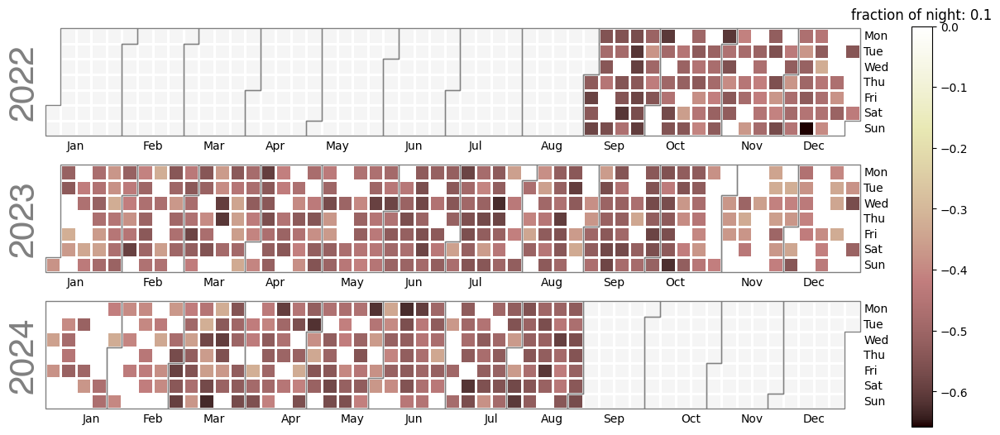

Spearman p-value at None


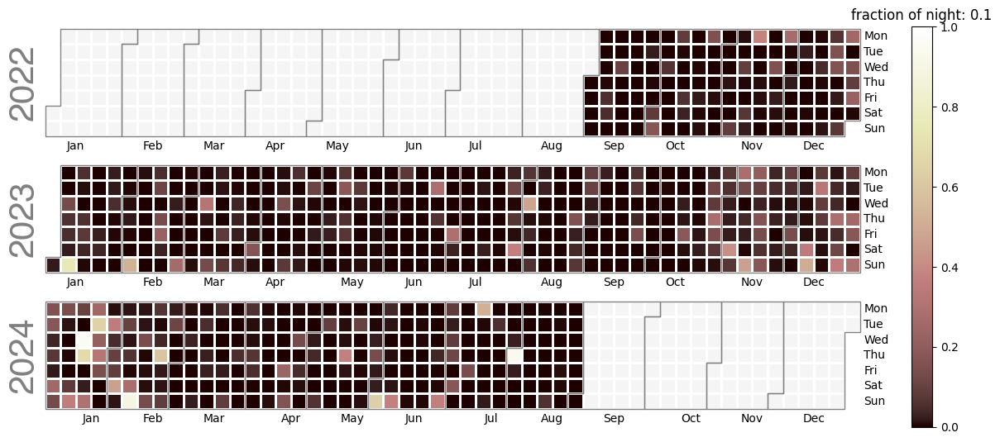

Synoptic control


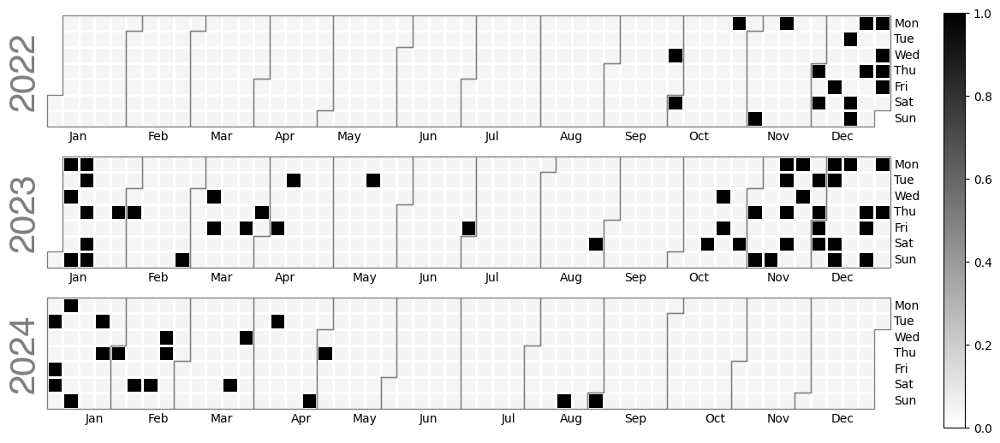

In [28]:
stats_dict = plot_calplot(year, 'BuERI_mode', 300, fraction_of_night=0.1)

BuVol_3D_sum
Spearman correlation at None


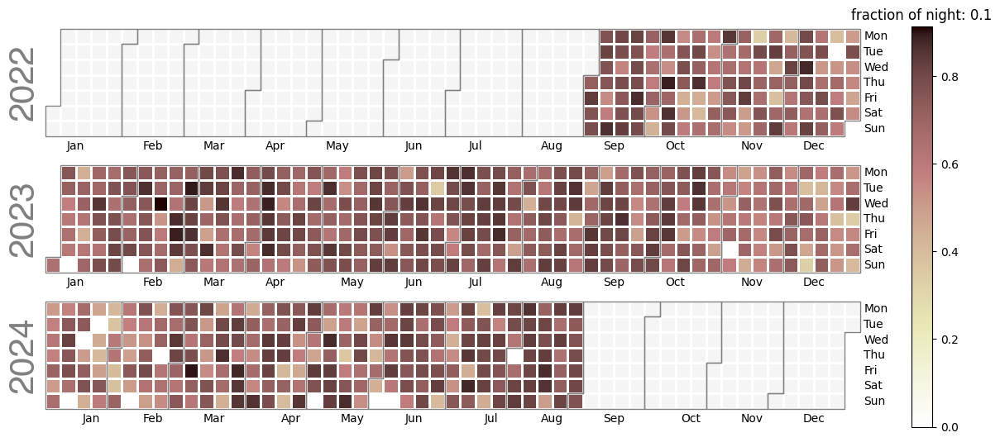

Spearman p-value at None


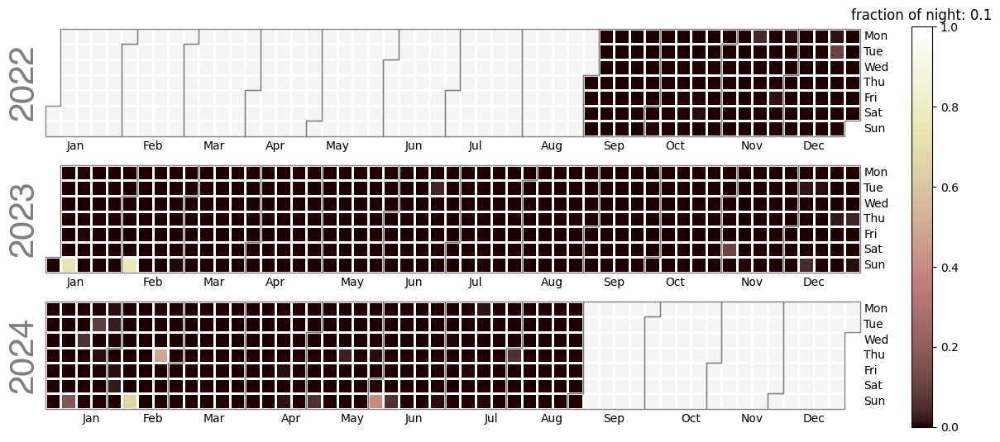

Synoptic control


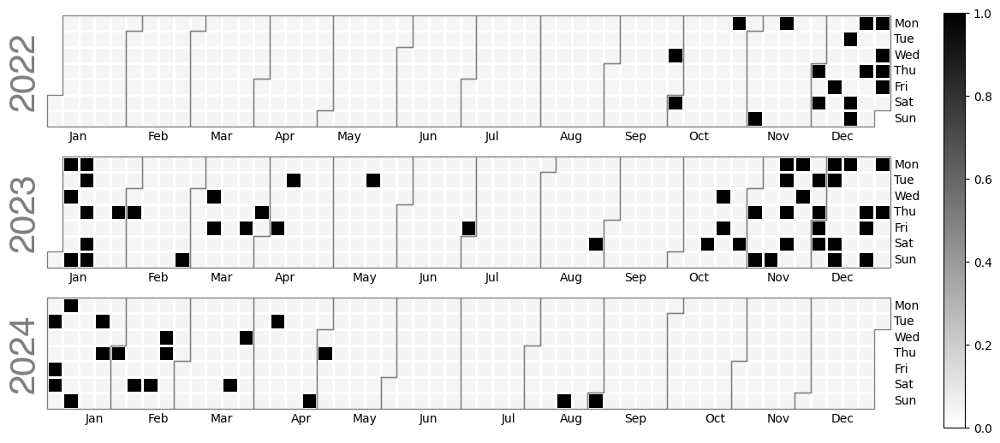

BuEWA_3D_sum
Spearman correlation at None


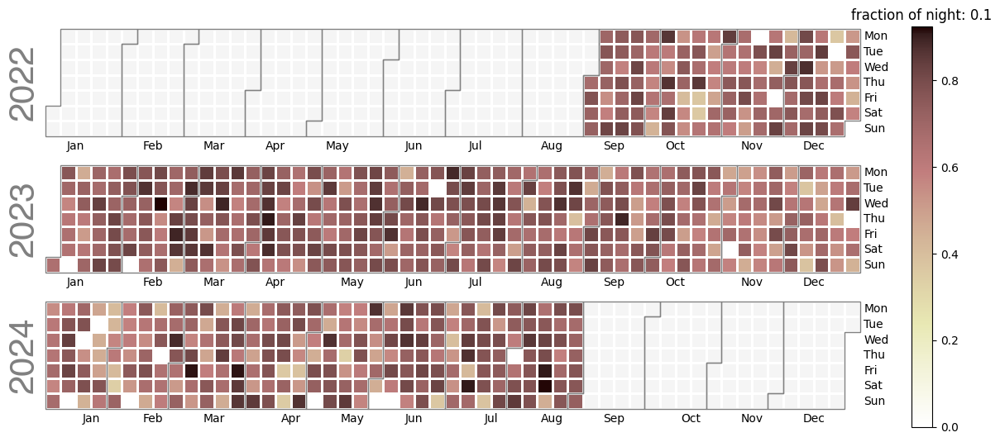

Spearman p-value at None


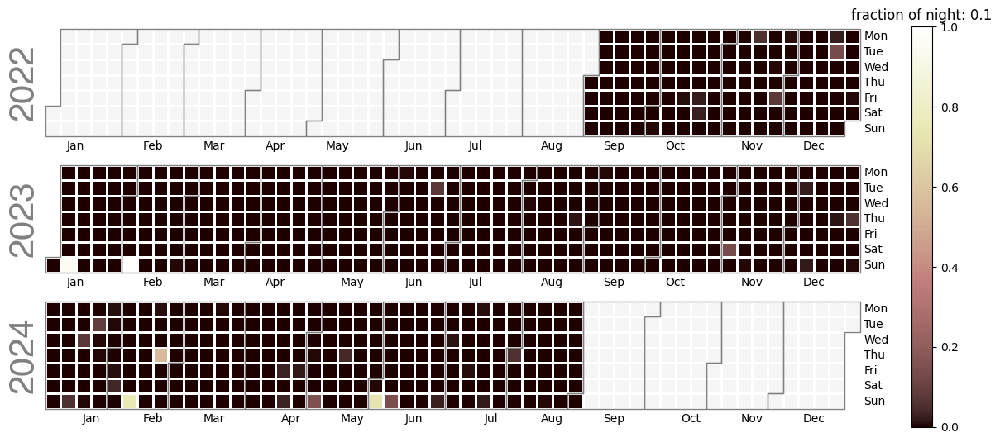

Synoptic control


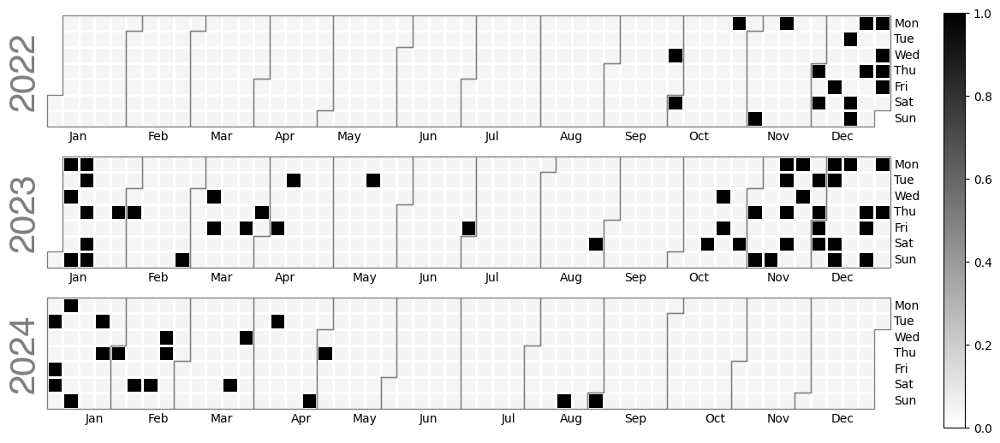

BuIBD
Spearman correlation at None


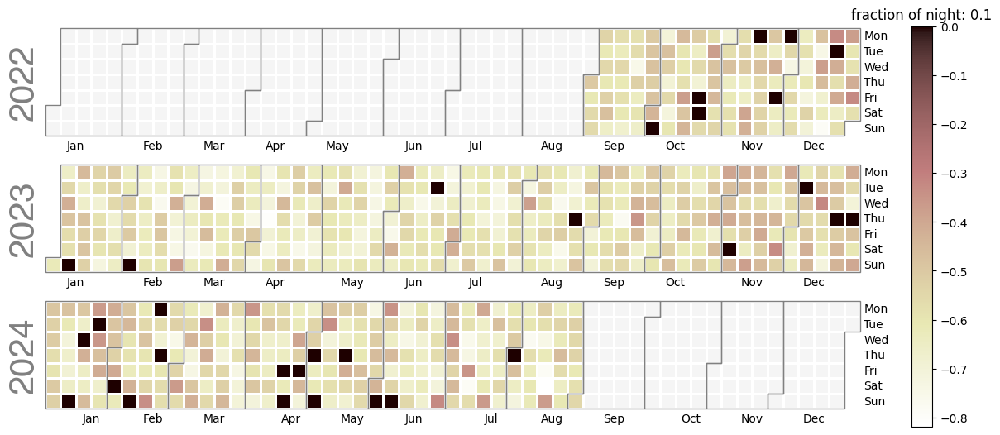

Spearman p-value at None


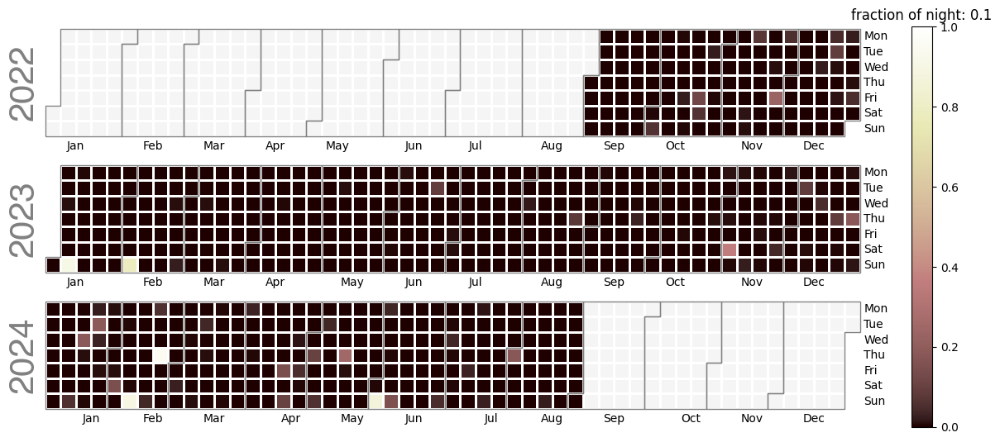

Synoptic control


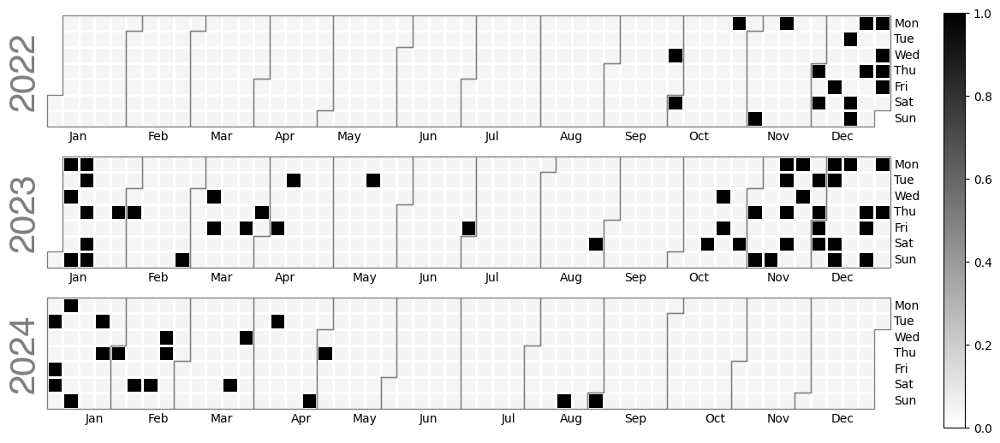

BuAdj
Spearman correlation at None


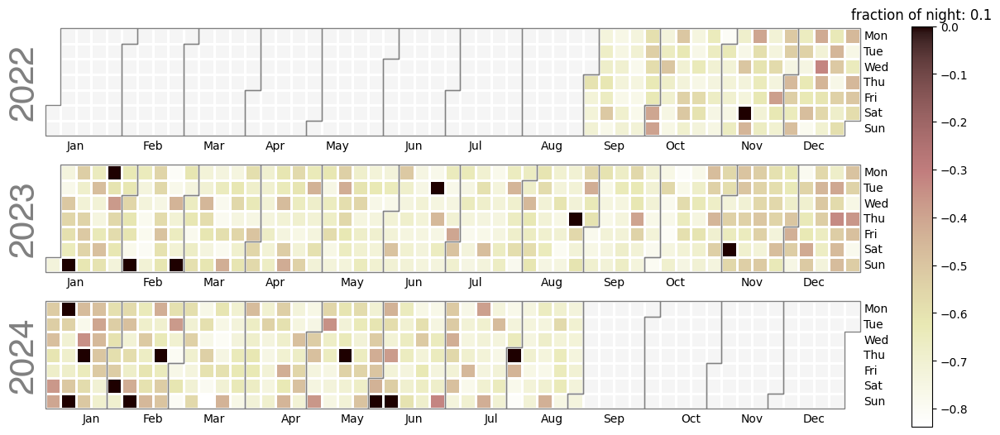

Spearman p-value at None


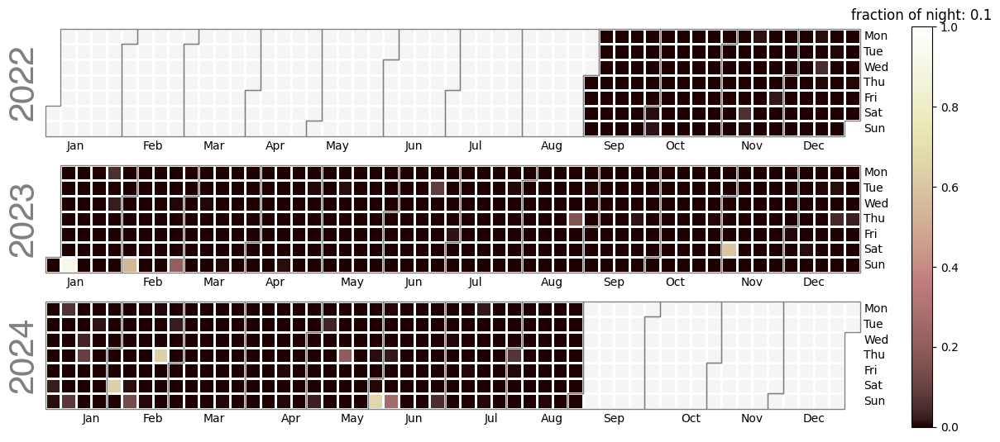

Synoptic control


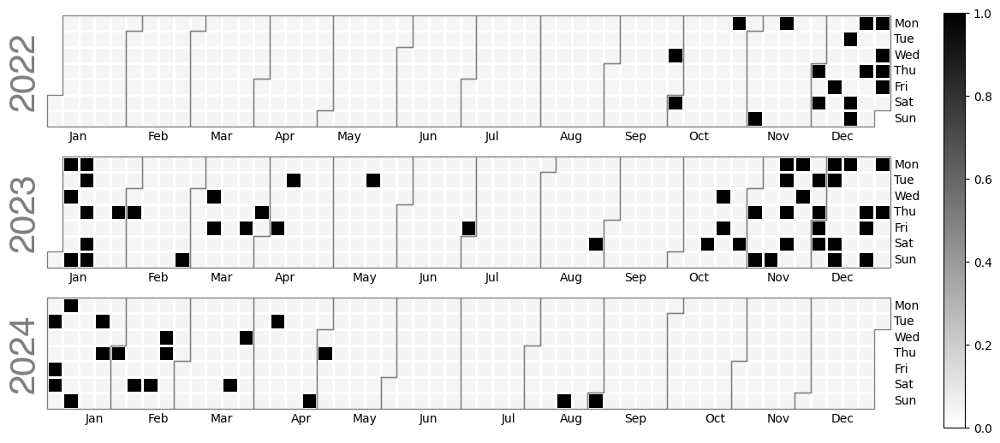

BuSWR_3D_median
Spearman correlation at None


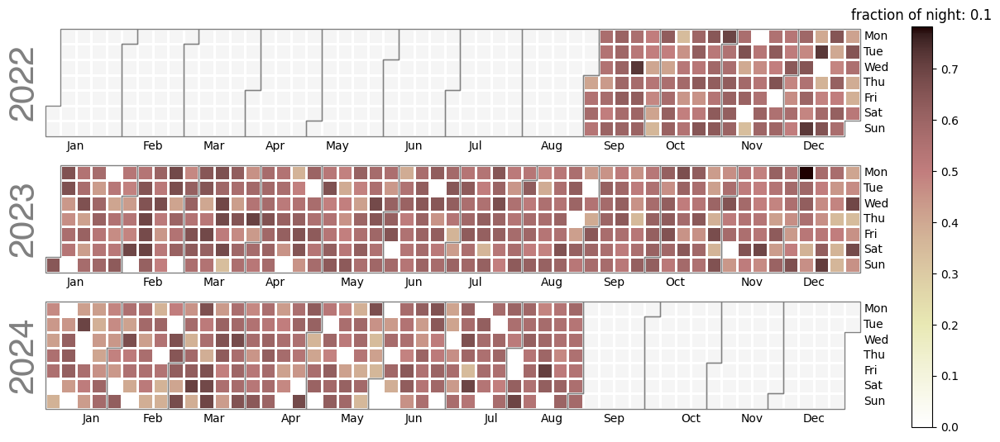

Spearman p-value at None


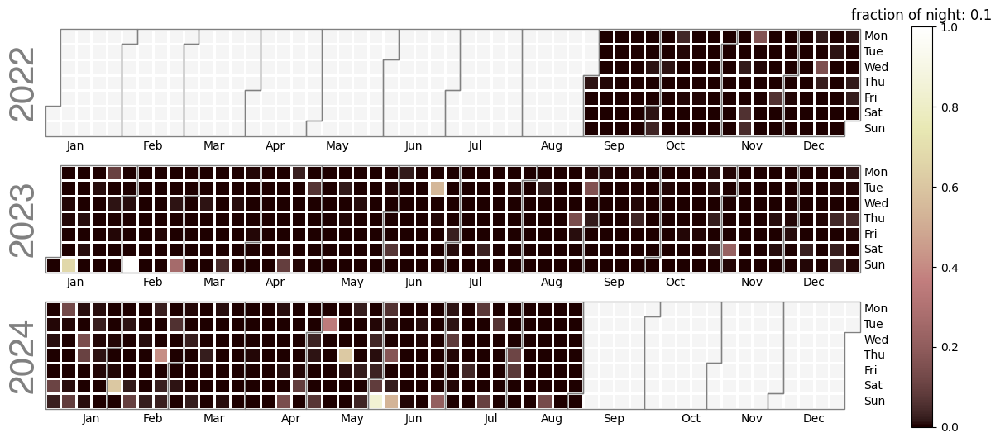

Synoptic control


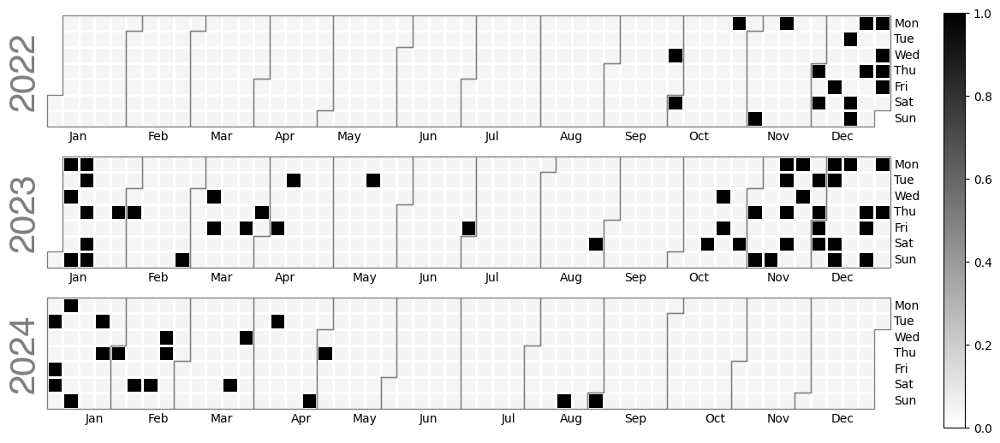

BuHt_wmean
Spearman correlation at None


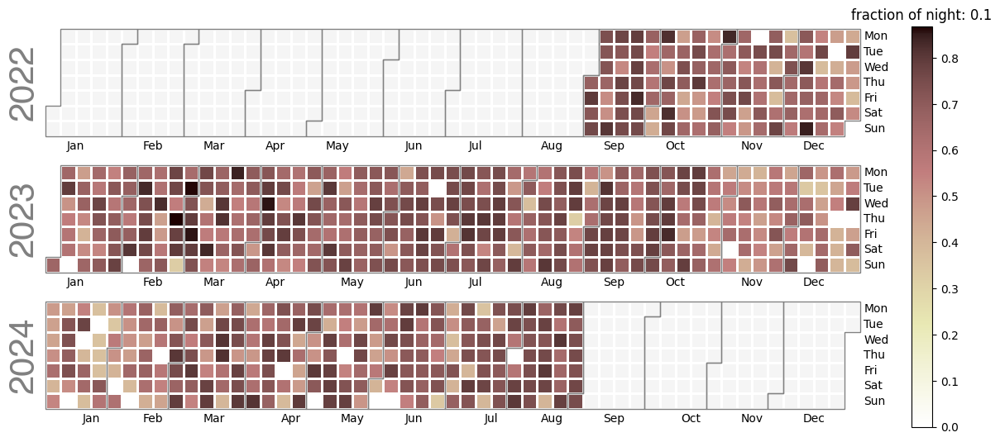

Spearman p-value at None


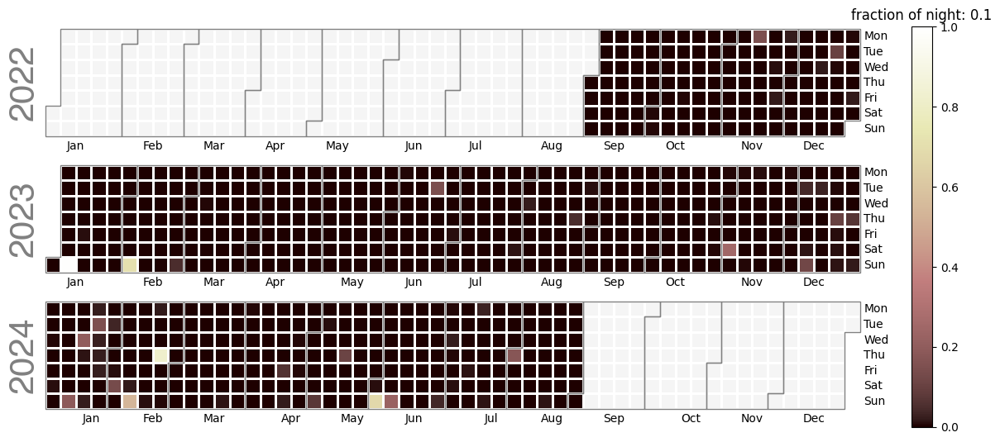

Synoptic control


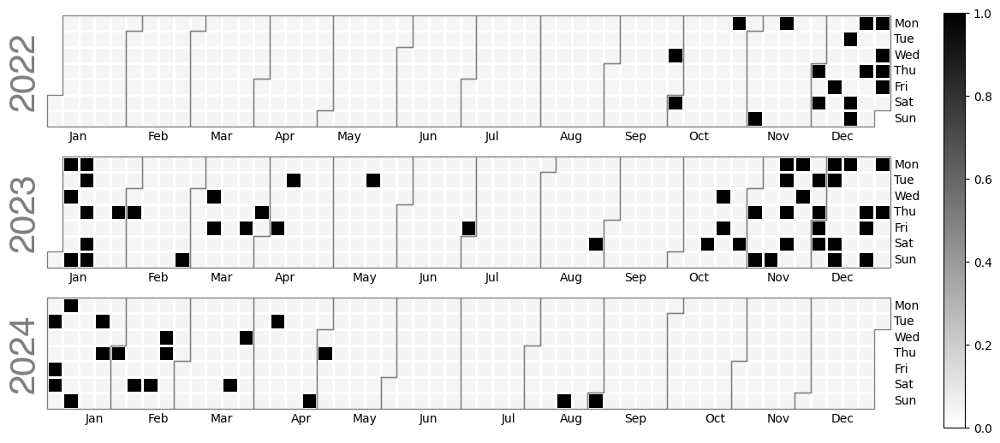

StrHW_median
Spearman correlation at None


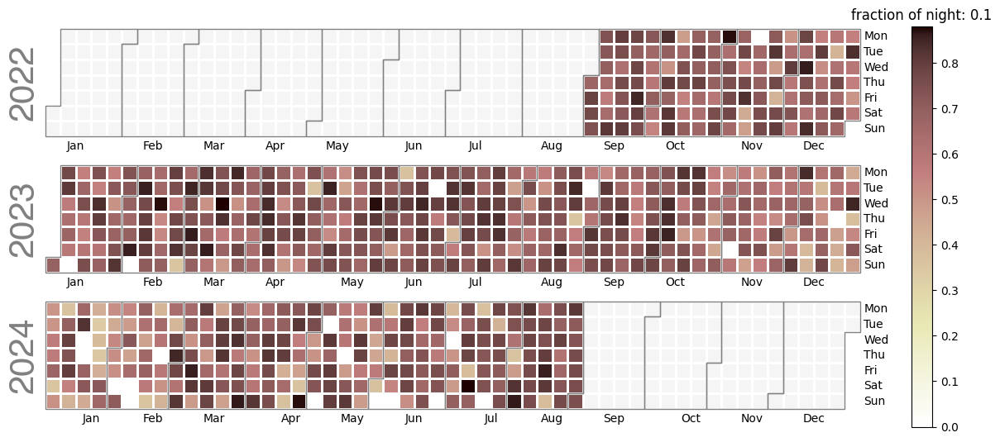

Spearman p-value at None


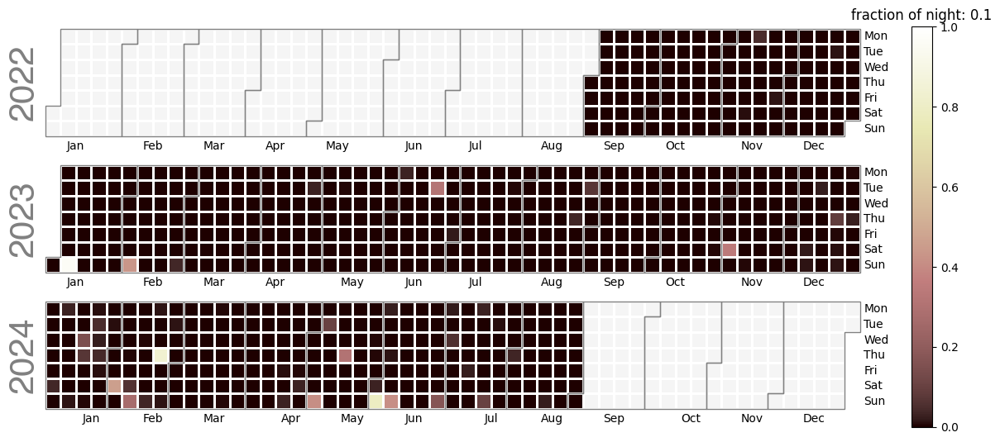

Synoptic control


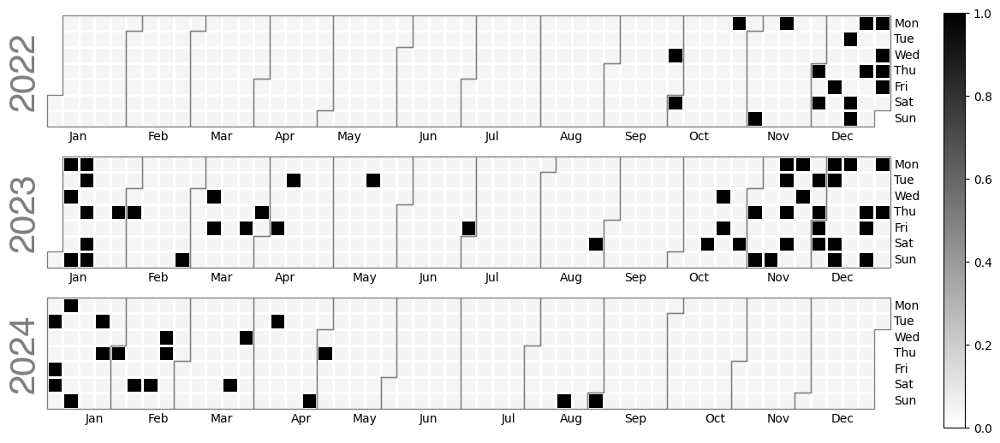

SVF_3D_mean
Spearman correlation at None


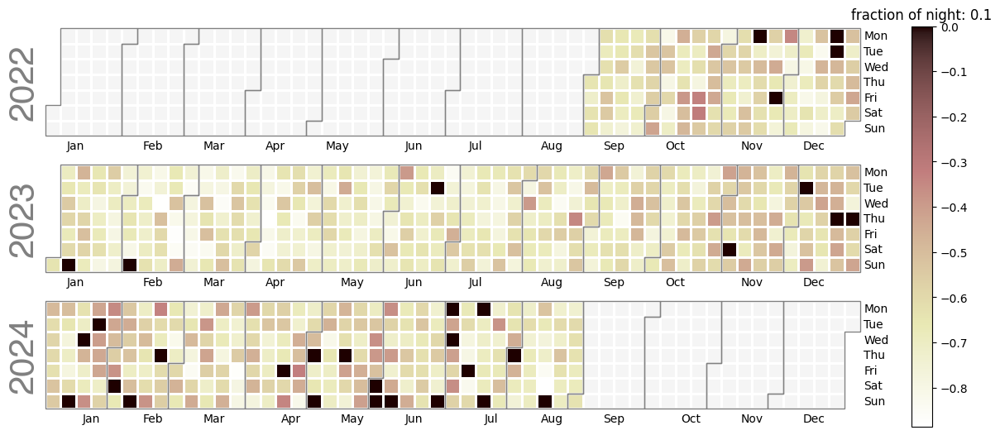

Spearman p-value at None


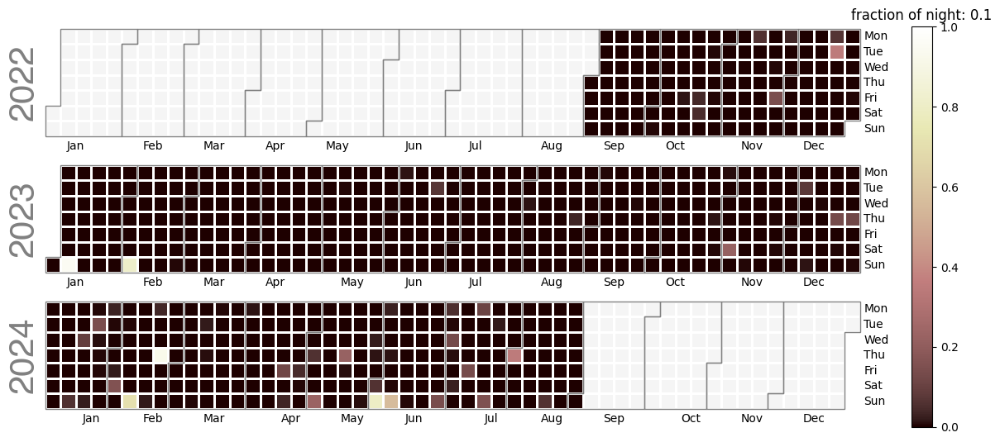

Synoptic control


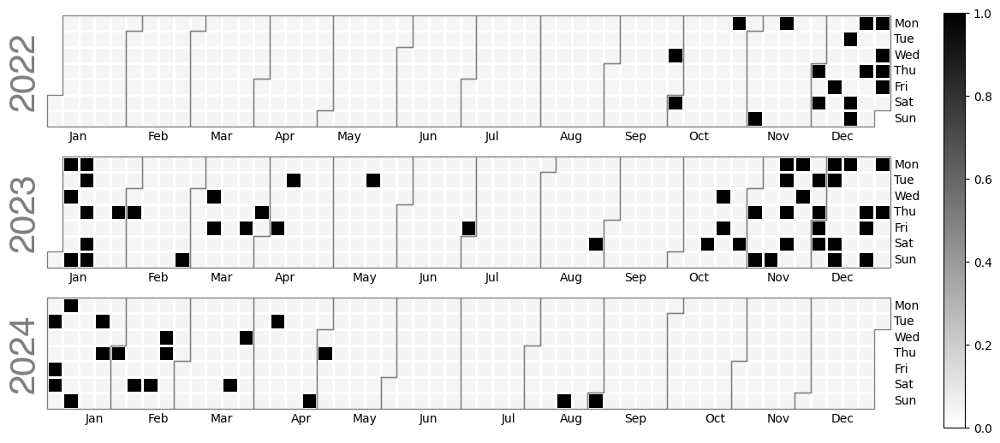

BuERI_mode
Spearman correlation at None


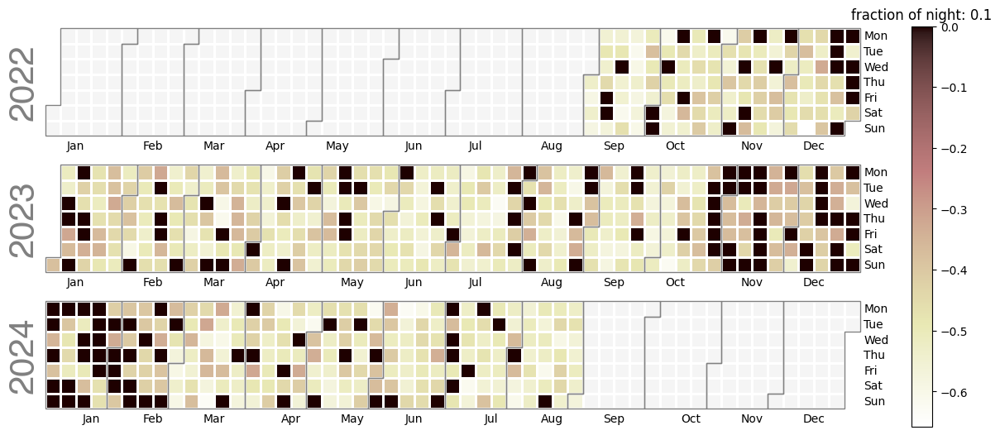

Spearman p-value at None


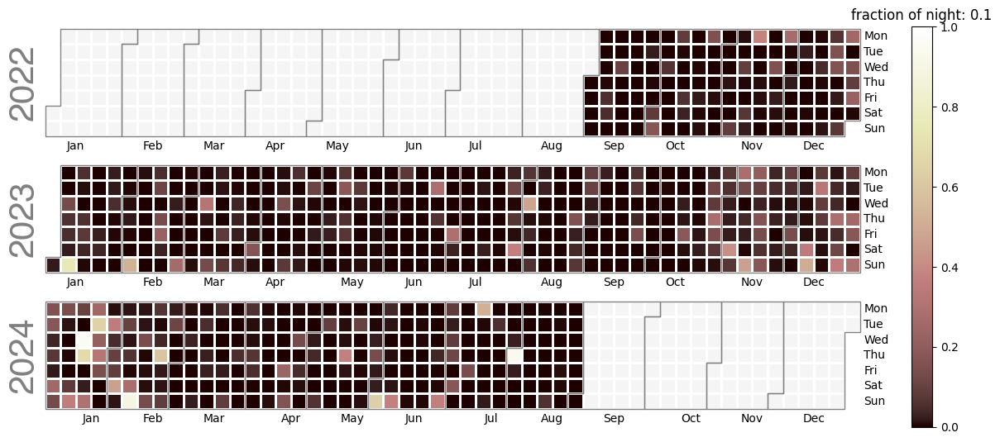

Synoptic control


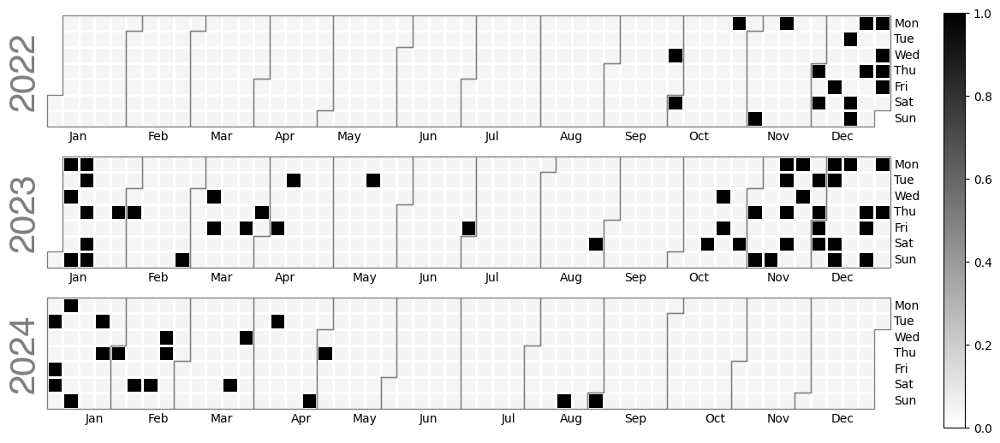

StrClo400_median
Spearman correlation at None


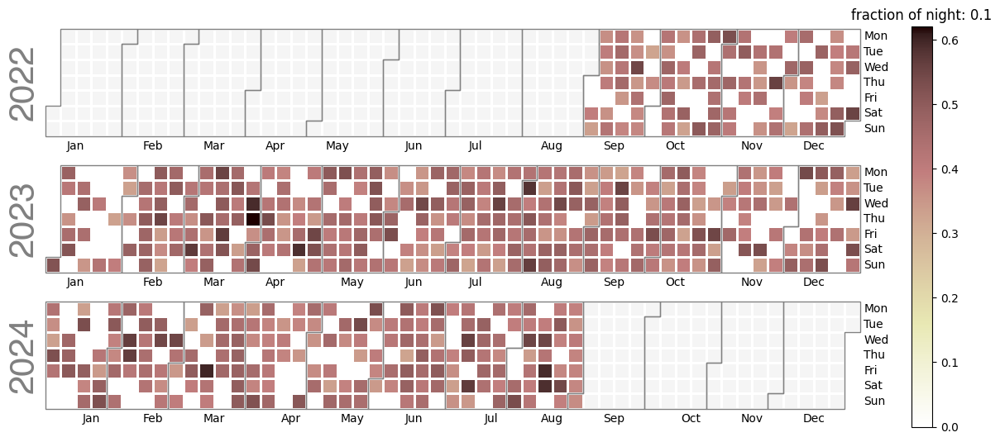

Spearman p-value at None


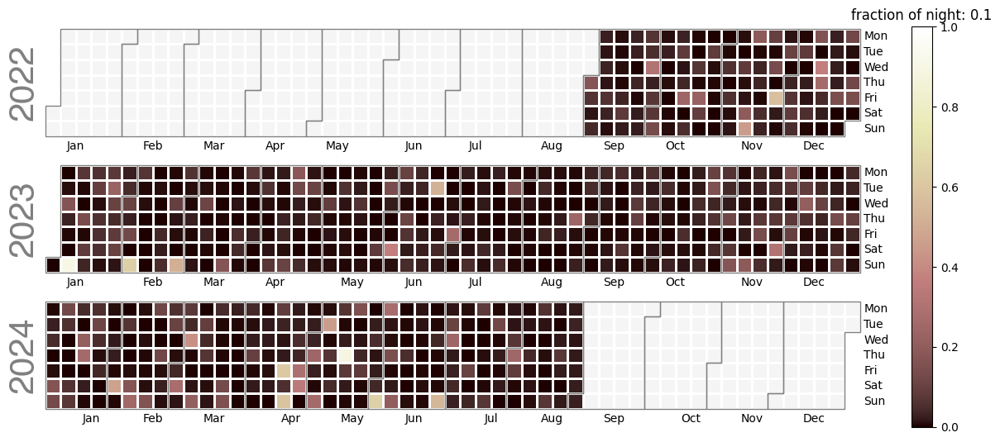

Synoptic control


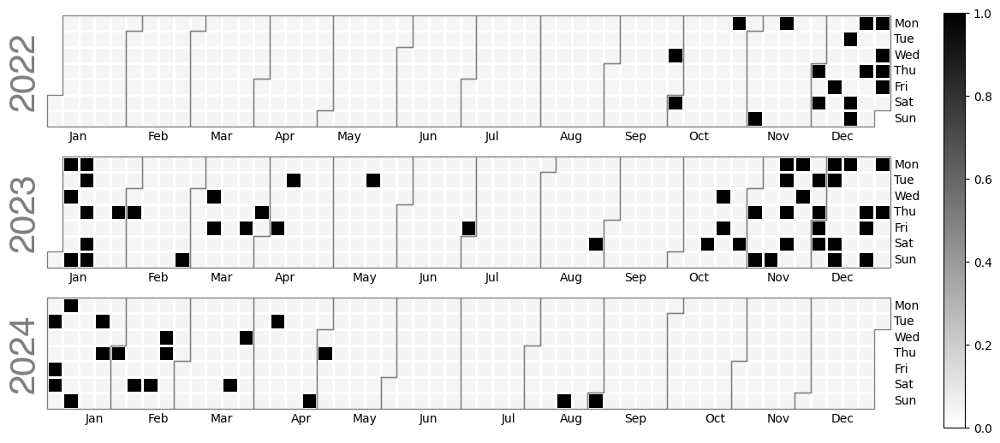

In [21]:
for i in ['BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuERI_mode', 'StrClo400_median']:
    print(i)
    stats_dict = plot_calplot(year, i, 300, fraction_of_night=0.1)

In [54]:
stats_dict = pd.read_csv("/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/2024/('year', 'BuAre_sum', 300).csv")
stats_dict['Time'] = pd.to_datetime(stats_dict['Time'])

date_to_fraction_of_day = temp.set_index('datetime_UTC')['fraction_of_day'].to_dict()
day_to_fraction_of_night = temp.set_index('datetime_UTC')['fraction_of_night'].to_dict()
stats_dict['fraction_of_day'] = stats_dict['Time'].astype(str).map(date_to_fraction_of_day)
stats_dict['fraction_of_night'] = stats_dict['Time'].astype(str).map(day_to_fraction_of_night)

In [55]:
stats_dict

,Unnamed: 0,Parameter,Parameter.1,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Mutual Information,Temp. Mean,Temp. Std. Dev.,UHI Magnitude,Time,fraction_of_day,fraction_of_night
0,2022-09-01 00:00:00+00:00,BuAre_sum,BuAre_sum,0.759086,3.319767e-08,0.762775,2.599769e-08,0.334594,15.577026,1.161342,3.282667,2022-09-01 00:00:00+00:00,0.0,0.545502
1,2022-09-01 01:00:00+00:00,BuAre_sum,BuAre_sum,0.802606,1.356386e-09,0.783498,6.039720e-09,0.337197,15.322473,1.149174,3.422667,2022-09-01 01:00:00+00:00,0.0,0.640301
2,2022-09-01 02:00:00+00:00,BuAre_sum,BuAre_sum,0.787695,4.408087e-09,0.804136,1.195151e-09,0.328483,14.870165,1.164558,3.361000,2022-09-01 02:00:00+00:00,0.0,0.735100
3,2022-09-01 03:00:00+00:00,BuAre_sum,BuAre_sum,0.817020,3.933249e-10,0.809607,7.531884e-10,0.486841,14.511736,1.121388,3.304333,2022-09-01 03:00:00+00:00,0.0,0.829898
4,2022-09-01 04:00:00+00:00,BuAre_sum,BuAre_sum,0.850881,1.327587e-11,0.837838,5.364182e-11,0.544745,14.017062,0.942711,2.525833,2022-09-01 04:00:00+00:00,0.0,0.924697
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17540,2024-08-31 20:00:00+00:00,BuAre_sum,BuAre_sum,0.702456,8.838621e-07,0.712222,5.306006e-07,0.248629,23.233942,1.212864,2.787833,2024-08-31 20:00:00+00:00,0.0,0.168276
17541,2024-08-31 21:00:00+00:00,BuAre_sum,BuAre_sum,0.690896,1.576131e-06,0.702593,8.776544e-07,0.288425,22.457265,1.244420,3.218333,2024-08-31 21:00:00+00:00,0.0,0.263335
17542,2024-08-31 22:00:00+00:00,BuAre_sum,BuAre_sum,0.668749,4.448385e-06,0.700843,9.597197e-07,0.304494,21.791268,1.214979,2.759500,2024-08-31 22:00:00+00:00,0.0,0.358395
17543,2024-08-31 23:00:00+00:00,BuAre_sum,BuAre_sum,0.730189,1.961498e-07,0.763869,2.415871e-08,0.328694,21.236507,1.336951,4.304500,2024-08-31 23:00:00+00:00,0.0,0.453454


Text(0.5, 0, 'Fraction of night')

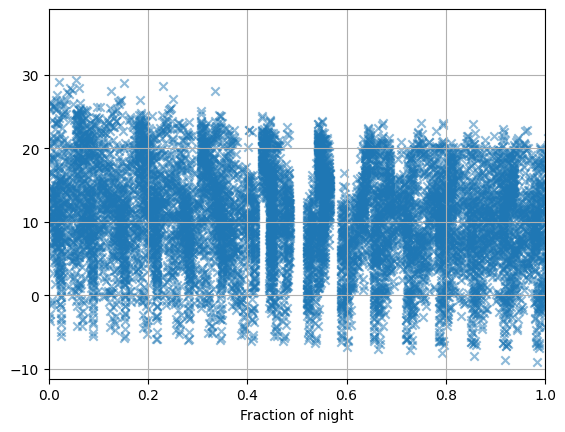

In [56]:
plt.scatter(stats_dict['fraction_of_night'],stats_dict['Temp. Mean'], alpha=0.5, marker='x')
plt.xlim(0,1)
plt.grid()
plt.xlabel('Fraction of night')

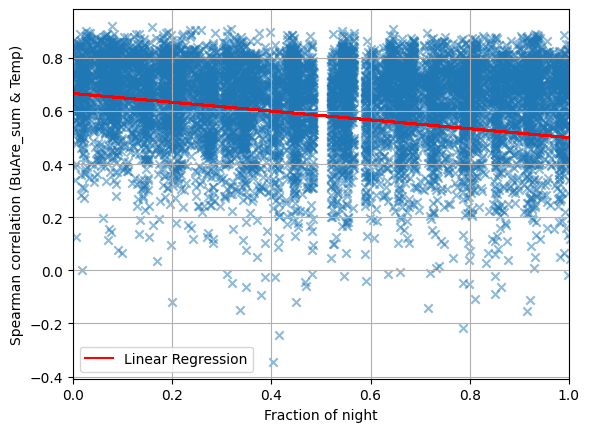

In [34]:
plt.scatter(stats_dict['fraction_of_night'],stats_dict['Spearman Correlation'], alpha=0.5, marker='x')
plt.xlim(0,1)
plt.grid()
plt.xlabel('Fraction of night')
plt.ylabel('Spearman correlation (BuAre_sum & Temp)')

# Add linear regression line
x = np.array(stats_dict['fraction_of_night'])
y = np.array(stats_dict['Spearman Correlation'])
m, b = np.polyfit(x, y, 1)  # Linear regression (slope and intercept)
plt.plot(x, m * x + b, color='red', label='Linear Regression')

plt.legend()



In [35]:
stats_dict.loc[((stats_dict['fraction_of_night'] <= (i+0.05)) & (stats_dict['fraction_of_night'] > (i-0.05))), 'Spearman Correlation']

5        0.671955
29       0.749426
53       0.776124
77       0.742423
101      0.769997
           ...   
17429    0.766276
17453    0.651384
17477    0.766058
17501    0.754021
17525    0.792537
Name: Spearman Correlation, Length: 818, dtype: float64

In [27]:
# remove rows with Spearman p-value <= 0.05
stats_dict_sig = stats_dict[stats_dict['Spearman p-value'] <= 0.05]

In [58]:
stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.9)) & (stats_dict['fraction_of_day'] > (0.8))), 'UHI Magnitude'].mean()

-0.026215065824324348

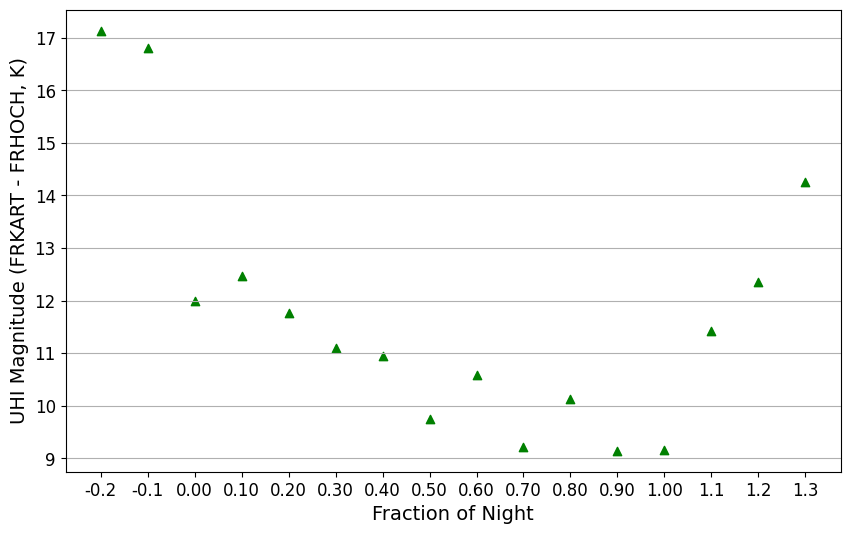

In [62]:
#boxplot for fraction of night
sc=[]
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.9)) & (stats_dict['fraction_of_day'] > (0.8))), 'Temp. Mean'].mean())
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (1)) & (stats_dict['fraction_of_day'] > (0.9))), 'Temp. Mean'].mean())
for i in [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
    sc.append(stats_dict.loc[((stats_dict['fraction_of_night'] <= (i+0.05)) & (stats_dict['fraction_of_night'] > (i-0.05))), 'Temp. Mean'].mean())
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.1)) & (stats_dict['fraction_of_day'] > (0))), 'Temp. Mean'].mean())
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.2)) & (stats_dict['fraction_of_day'] > (0.1))), 'Temp. Mean'].mean())
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.3)) & (stats_dict['fraction_of_day'] > (0.2))), 'Temp. Mean'].mean())

plt.figure(figsize=(10, 6))

plt.scatter(np.arange(1, len(sc) + 1), sc, color='green', marker='^', label='Mean')



plt.ylabel('UHI Magnitude (FRKART - FRHOCH, K)', fontsize=14)
plt.xlabel('Fraction of Night', fontsize=14)
plt.xticks(ticks=np.arange(1, len(sc) + 1), labels=['-0.2', '-0.1'] + [f'{i:.2f}' for i in np.arange(0, 1.05, 0.1)] + ['1.1', '1.2', '1.3'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y')


In [61]:
sc

[17.13528201363792,
 16.805758142440872,
 11.985295115187768,
 12.472337959059592,
 11.765017699999024,
 11.095459940394203,
 10.95249599781793,
 9.751050675657124,
 10.587423525048038,
 9.217376345993125,
 10.130264442161318,
 9.143522002030016,
 9.151894572608546,
 11.420045919595696,
 12.348610546567983,
 14.247824552866804]

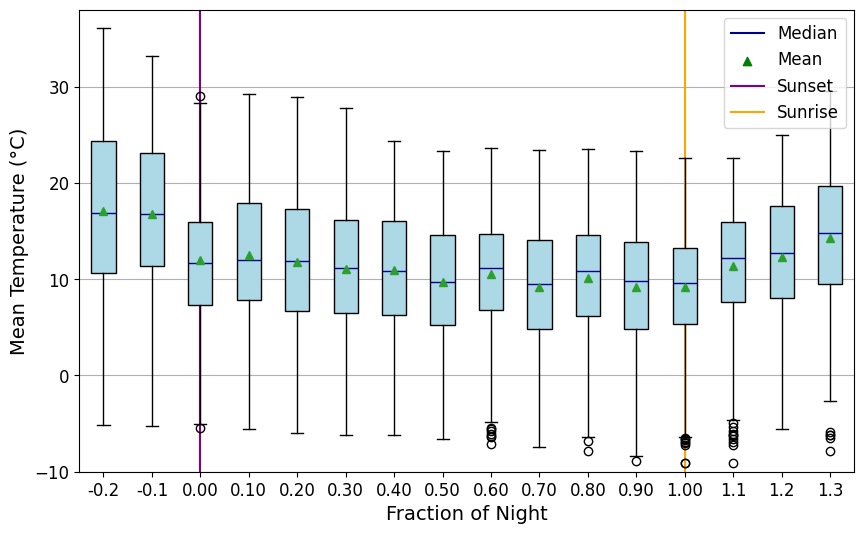

In [69]:
#boxplot for fraction of night
sc=[]
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.9)) & (stats_dict['fraction_of_day'] > (0.8))), 'Temp. Mean'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (1)) & (stats_dict['fraction_of_day'] > (0.9))), 'Temp. Mean'])
for i in [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
    sc.append(stats_dict.loc[((stats_dict['fraction_of_night'] <= (i+0.05)) & (stats_dict['fraction_of_night'] > (i-0.05))), 'Temp. Mean'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.1)) & (stats_dict['fraction_of_day'] > (0))), 'Temp. Mean'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.2)) & (stats_dict['fraction_of_day'] > (0.1))), 'Temp. Mean'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.3)) & (stats_dict['fraction_of_day'] > (0.2))), 'Temp. Mean'])

plt.figure(figsize=(10, 6))

plt.plot([3, 3], [-10, 38], color='purple', linestyle='-', label='Sunset')
sunset = plt.Line2D([0], [0], color='purple', linestyle='-', label='Sunset')
plt.plot([13, 13], [-10, 38], color='orange', linestyle='-', label='Sunrise')
sunrise = plt.Line2D([0], [0], color='orange', linestyle='-', label='Sunrise')

boxplot = plt.boxplot(sc,showmeans=True, patch_artist=True,)
for box in boxplot['boxes']:
    box.set(facecolor='lightblue')

# Set the color of the median lines to dark blue
for median in boxplot['medians']:
    median.set(color='darkblue')


# Custom legend handles
mean_handle = plt.Line2D([], [], color='darkblue', linestyle='-', label='Median')
median_handle = plt.scatter([], [], color='green', linestyle='-', label='Mean', marker='^')


plt.ylabel('Mean Temperature (°C)', fontsize=14)
plt.xlabel('Fraction of Night', fontsize=14)
plt.xticks(ticks=np.arange(1, len(sc) + 1), labels=['-0.2', '-0.1'] + [f'{i:.2f}' for i in np.arange(0, 1.05, 0.1)] + ['1.1', '1.2', '1.3'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y')
plt.ylim(-10,38)

plt.legend(handles=[mean_handle, median_handle, sunset, sunrise], loc='upper right', fontsize=12)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_temp_mean.png', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_temp_mean.svg', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_temp_mean.pdf', bbox_inches='tight', dpi=300)
plt.show()

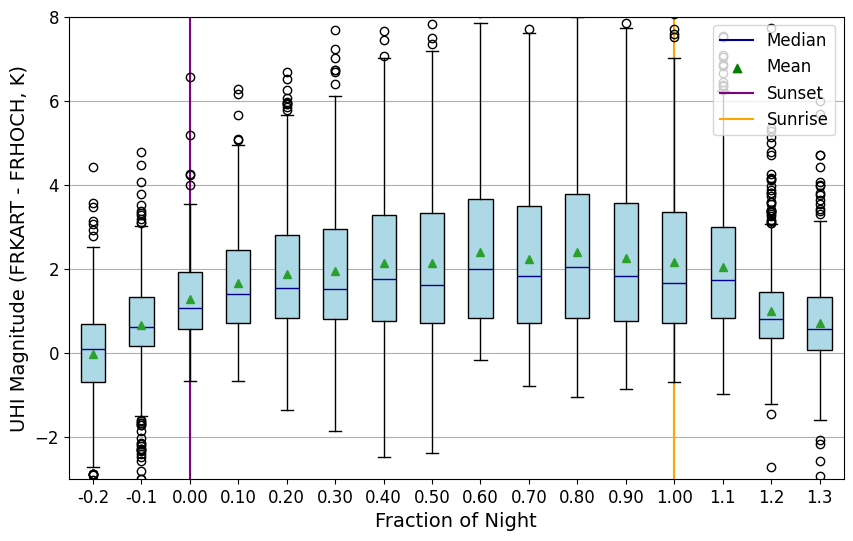

In [64]:
#boxplot for fraction of night
sc=[]
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.9)) & (stats_dict['fraction_of_day'] > (0.8))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (1)) & (stats_dict['fraction_of_day'] > (0.9))), 'UHI Magnitude'])
for i in [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
    sc.append(stats_dict.loc[((stats_dict['fraction_of_night'] <= (i+0.05)) & (stats_dict['fraction_of_night'] > (i-0.05))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.1)) & (stats_dict['fraction_of_day'] > (0))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.2)) & (stats_dict['fraction_of_day'] > (0.1))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.3)) & (stats_dict['fraction_of_day'] > (0.2))), 'UHI Magnitude'])

plt.figure(figsize=(10, 6))

plt.plot([3, 3], [-10, 10], color='purple', linestyle='-', label='Sunset')
sunset = plt.Line2D([0], [0], color='purple', linestyle='-', label='Sunset')
plt.plot([13, 13], [-10, 10], color='orange', linestyle='-', label='Sunrise')
sunrise = plt.Line2D([0], [0], color='orange', linestyle='-', label='Sunrise')

boxplot = plt.boxplot(sc,showmeans=True, patch_artist=True,)
for box in boxplot['boxes']:
    box.set(facecolor='lightblue')

# Set the color of the median lines to dark blue
for median in boxplot['medians']:
    median.set(color='darkblue')


# Custom legend handles
mean_handle = plt.Line2D([], [], color='darkblue', linestyle='-', label='Median')
median_handle = plt.scatter([], [], color='green', linestyle='-', label='Mean', marker='^')


plt.ylabel('UHI Magnitude (FRKART - FRHOCH, K)', fontsize=14)
plt.xlabel('Fraction of Night', fontsize=14)
plt.xticks(ticks=np.arange(1, len(sc) + 1), labels=['-0.2', '-0.1'] + [f'{i:.2f}' for i in np.arange(0, 1.05, 0.1)] + ['1.1', '1.2', '1.3'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y')
plt.ylim(-3,8)

plt.legend(handles=[mean_handle, median_handle, sunset, sunrise], loc='upper right', fontsize=12)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_uhi_mag.png', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_uhi_mag.svg', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_uhi_mag.pdf', bbox_inches='tight', dpi=300)
plt.show()

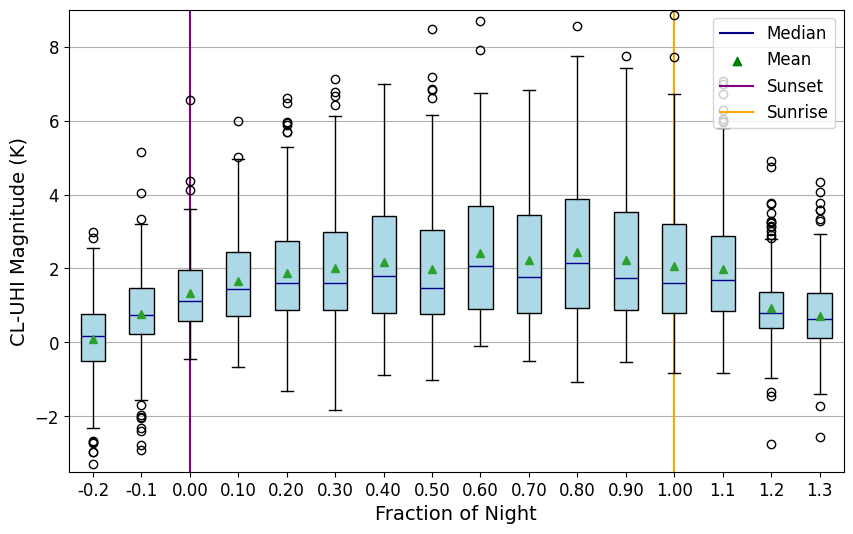

In [16]:
#boxplot for fraction of night
sc=[]
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.9)) & (stats_dict['fraction_of_day'] > (0.8))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (1)) & (stats_dict['fraction_of_day'] > (0.9))), 'UHI Magnitude'])
for i in [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
    sc.append(stats_dict.loc[((stats_dict['fraction_of_night'] <= (i+0.05)) & (stats_dict['fraction_of_night'] > (i-0.05))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.1)) & (stats_dict['fraction_of_day'] > (0))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.2)) & (stats_dict['fraction_of_day'] > (0.1))), 'UHI Magnitude'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.3)) & (stats_dict['fraction_of_day'] > (0.2))), 'UHI Magnitude'])

plt.figure(figsize=(10, 6))

plt.plot([3, 3], [-10, 10], color='purple', linestyle='-', label='Sunset')
sunset = plt.Line2D([0], [0], color='purple', linestyle='-', label='Sunset')
plt.plot([13, 13], [-10, 10], color='orange', linestyle='-', label='Sunrise')
sunrise = plt.Line2D([0], [0], color='orange', linestyle='-', label='Sunrise')

boxplot = plt.boxplot(sc,showmeans=True, patch_artist=True,)
for box in boxplot['boxes']:
    box.set(facecolor='lightblue')

# Set the color of the median lines to dark blue
for median in boxplot['medians']:
    median.set(color='darkblue')


# Custom legend handles
mean_handle = plt.Line2D([], [], color='darkblue', linestyle='-', label='Median')
median_handle = plt.scatter([], [], color='green', linestyle='-', label='Mean', marker='^')


plt.ylabel('CL-UHI Magnitude (K)', fontsize=14)
plt.xlabel('Fraction of Night', fontsize=14)
plt.xticks(ticks=np.arange(1, len(sc) + 1), labels=['-0.2', '-0.1'] + [f'{i:.2f}' for i in np.arange(0, 1.05, 0.1)] + ['1.1', '1.2', '1.3'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y')
plt.ylim(-3.5,9)

plt.legend(handles=[mean_handle, median_handle, sunset, sunrise], loc='upper right', fontsize=12)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_uhi_mag.png', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_uhi_mag.svg', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_uhi_mag.pdf', bbox_inches='tight', dpi=300)
plt.show()

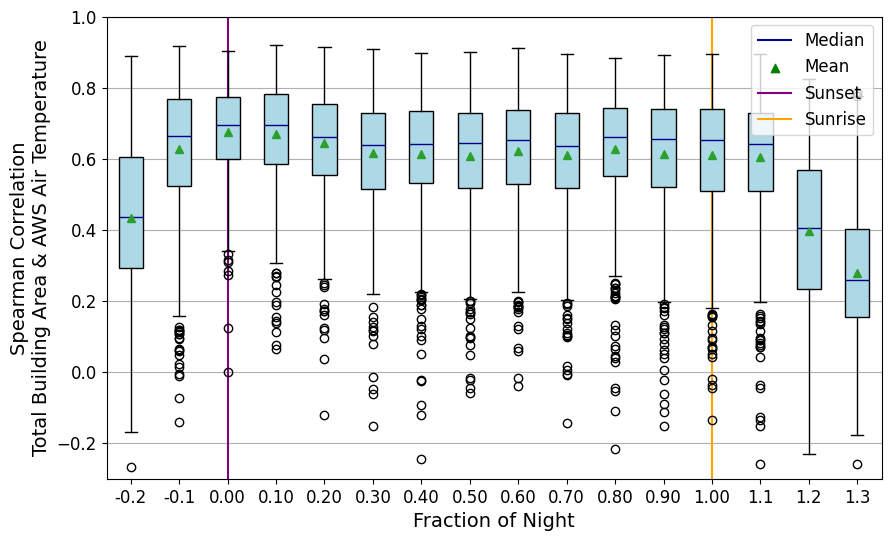

In [48]:
#boxplot for fraction of night
sc=[]
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.9)) & (stats_dict['fraction_of_day'] > (0.8))), 'Spearman Correlation'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (1)) & (stats_dict['fraction_of_day'] > (0.9))), 'Spearman Correlation'])
for i in [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
    sc.append(stats_dict.loc[((stats_dict['fraction_of_night'] <= (i+0.05)) & (stats_dict['fraction_of_night'] > (i-0.05))), 'Spearman Correlation'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.1)) & (stats_dict['fraction_of_day'] > (0))), 'Spearman Correlation'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.2)) & (stats_dict['fraction_of_day'] > (0.1))), 'Spearman Correlation'])
sc.append(stats_dict.loc[((stats_dict['fraction_of_day'] <= (0.3)) & (stats_dict['fraction_of_day'] > (0.2))), 'Spearman Correlation'])

plt.figure(figsize=(10, 6))

plt.plot([3, 3], [-1, 1], color='purple', linestyle='-', label='Sunset')
sunset = plt.Line2D([0], [0], color='purple', linestyle='-', label='Sunset')
plt.plot([13, 13], [-1, 1], color='orange', linestyle='-', label='Sunrise')
sunrise = plt.Line2D([0], [0], color='orange', linestyle='-', label='Sunrise')

boxplot = plt.boxplot(sc,showmeans=True, patch_artist=True,)
for box in boxplot['boxes']:
    box.set(facecolor='lightblue')

# Set the color of the median lines to dark blue
for median in boxplot['medians']:
    median.set(color='darkblue')


# Custom legend handles
mean_handle = plt.Line2D([], [], color='darkblue', linestyle='-', label='Median')
median_handle = plt.scatter([], [], color='green', linestyle='-', label='Mean', marker='^')


plt.ylabel('Spearman Correlation\nTotal Building Area & AWS Air Temperature', fontsize=14)
plt.xlabel('Fraction of Night', fontsize=14)
plt.xticks(ticks=np.arange(1, len(sc) + 1), labels=['-0.2', '-0.1'] + [f'{i:.2f}' for i in np.arange(0, 1.05, 0.1)] + ['1.1', '1.2', '1.3'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y')
plt.ylim(-0.3,1)

plt.legend(handles=[mean_handle, median_handle, sunset, sunrise], loc='upper right', fontsize=12)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_spearman.png', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_spearman.svg', bbox_inches='tight', dpi=300)
plt.savefig('/Users/lisawink/Documents/paper1/figures/fig11/fraction_of_night_spearman.pdf', bbox_inches='tight', dpi=300)
plt.show()

In [124]:
for i in sc:
    print(i.mean(), i.std(), i.median(), i.min(), i.max())

0.5414962262072128 0.14108796622869552 0.532771638034796 0.3202757413283729 0.8883904147062042
0.6582288732154923 0.14125595870536714 0.6802713644818907 0.3246525878104825 0.9188094977568662
0.6819501005484099 0.12451794287674472 0.6973410657621184 0.3318743845059634 0.9034905350694824
0.679726252679136 0.12638990840469488 0.6988729620308567 0.3204945836524783 0.9207790786738156
0.6558760948412267 0.127094370111105 0.6673596673596673 0.3213699529489003 0.915526862895284
0.6352834955598847 0.12802755302497967 0.6485392274865959 0.3213699529489003 0.909618120144436
0.638672668403484 0.1337129949949677 0.6551044972097603 -0.3447860816281868 0.8980194769668455
0.634930130117515 0.12813142560177504 0.6500711237553343 0.3229018492176387 0.9006455848561111
0.6426597785901557 0.13404682555938194 0.6648429806324544 0.3237772185140606 0.9109311740890688
0.6353062404169313 0.1301239048613468 0.6507276507276507 0.3215887952730057 0.8951745267534742
0.6488461196520406 0.12711048349226586 0.67053288

Spearman correlation at None


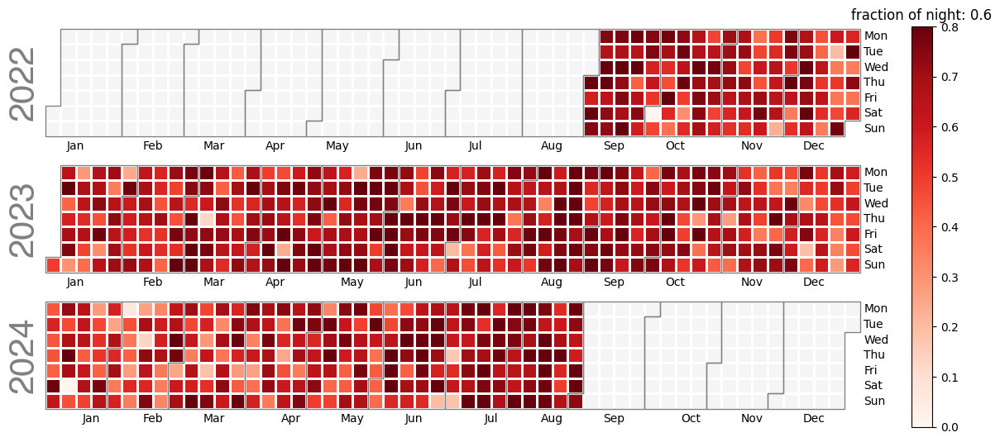

Spearman p-value at None


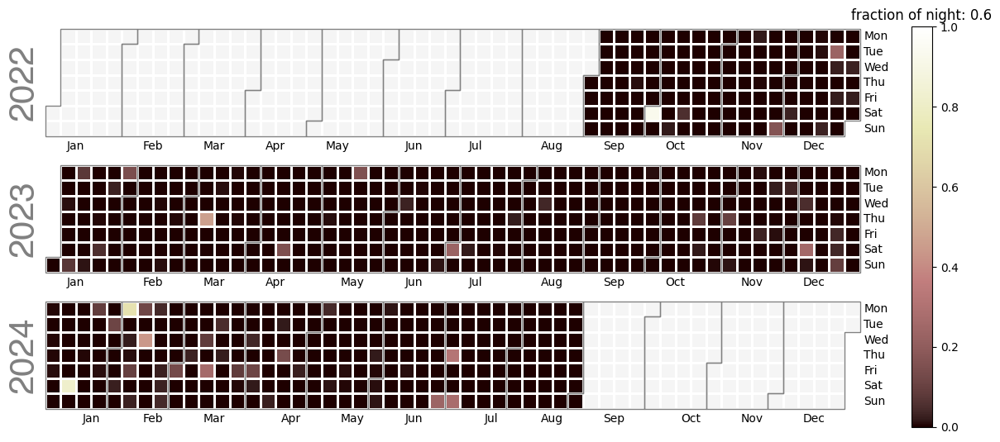

Synoptic control


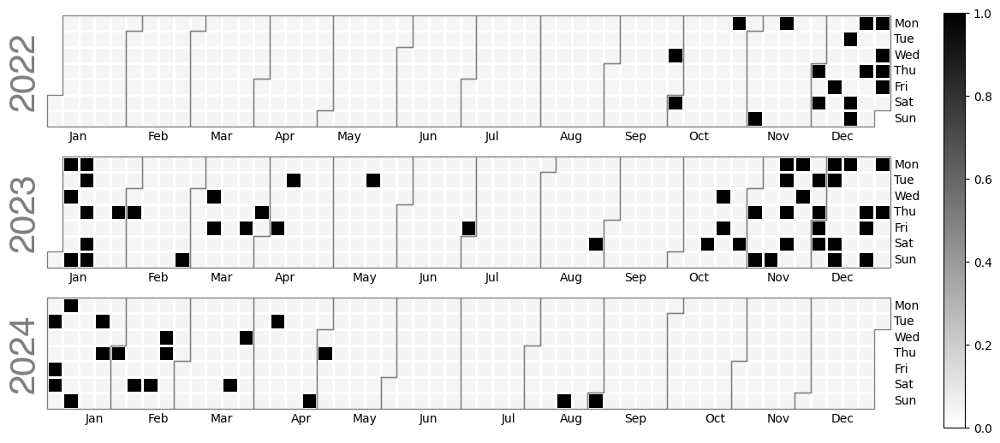

In [40]:
plot_calplot(year, 'BuAre_sum', 300, fraction_of_night=0.6)

Spearman correlation at None


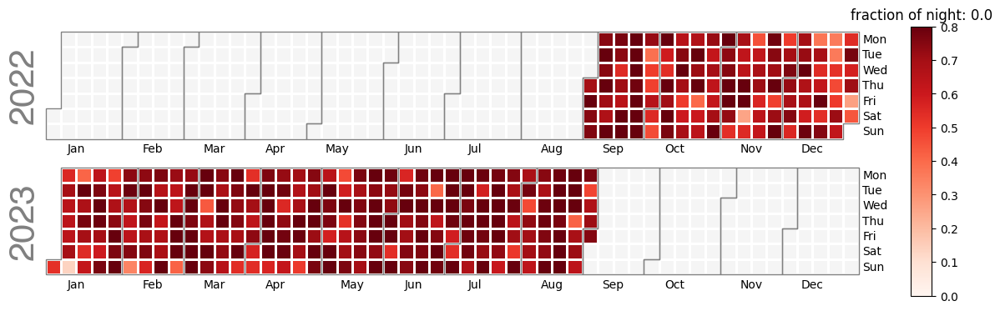

Spearman p-value at None


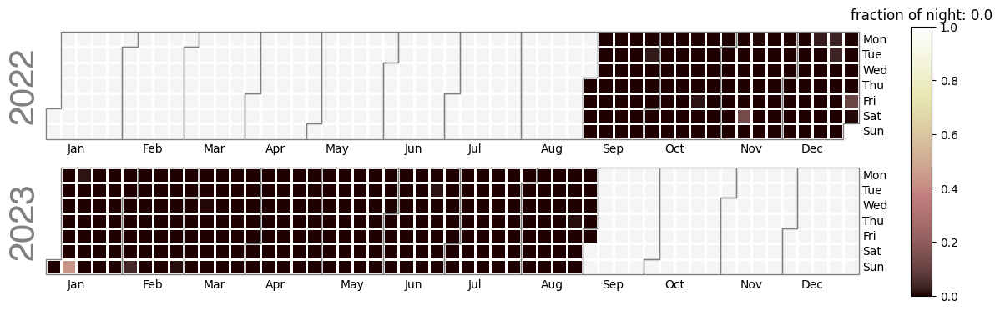

Synoptic control


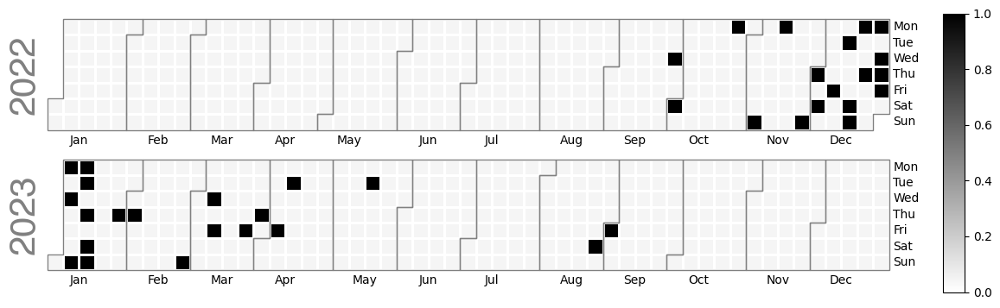

Spearman correlation at None


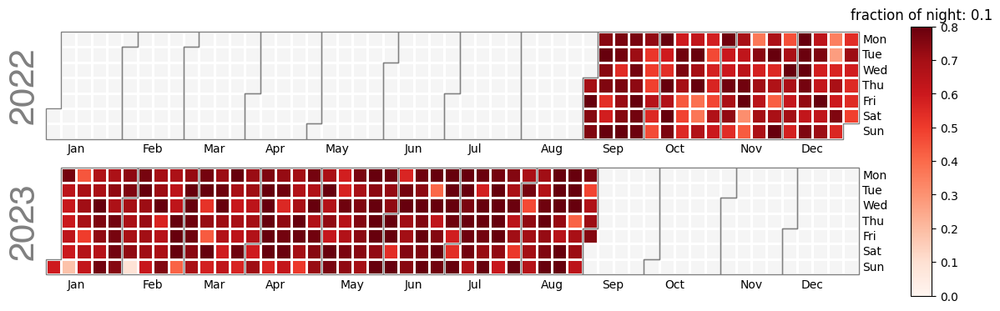

Spearman p-value at None


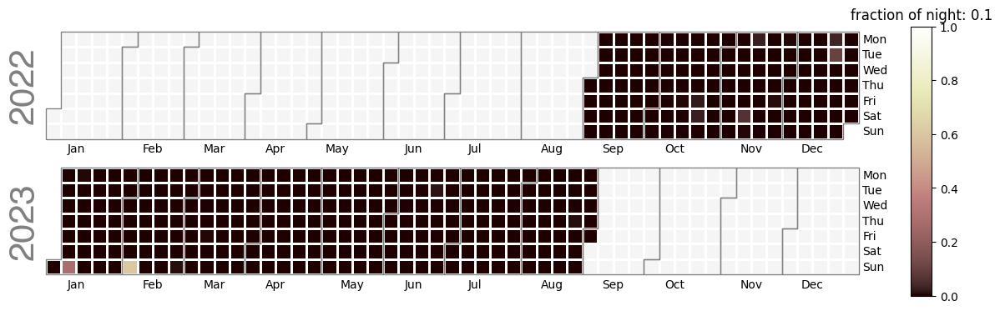

Synoptic control


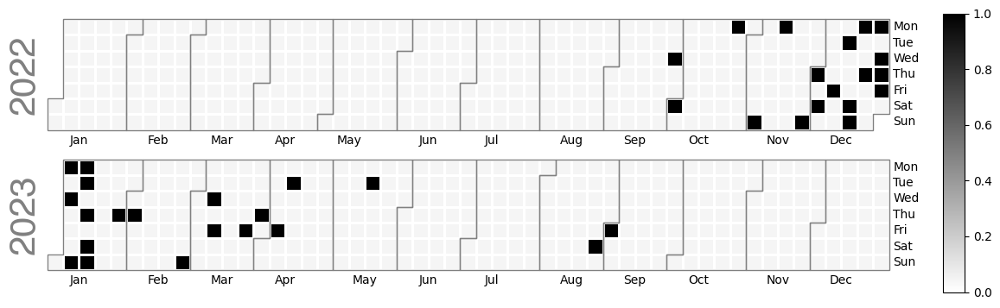

Spearman correlation at None


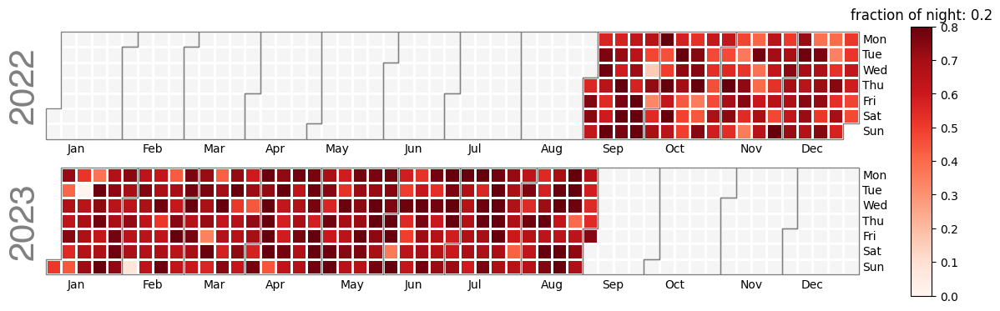

Spearman p-value at None


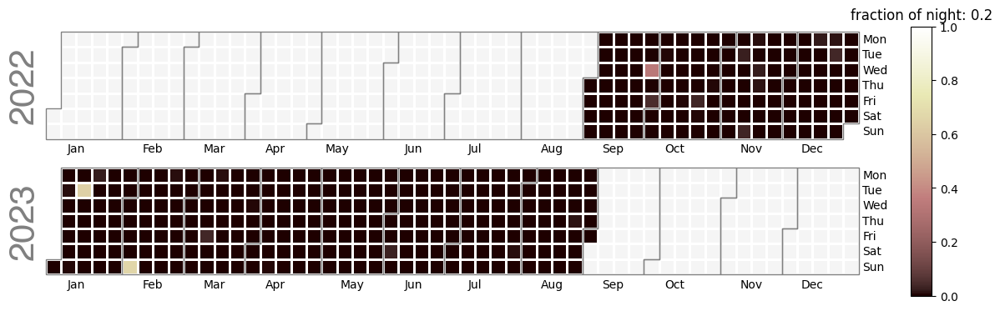

Synoptic control


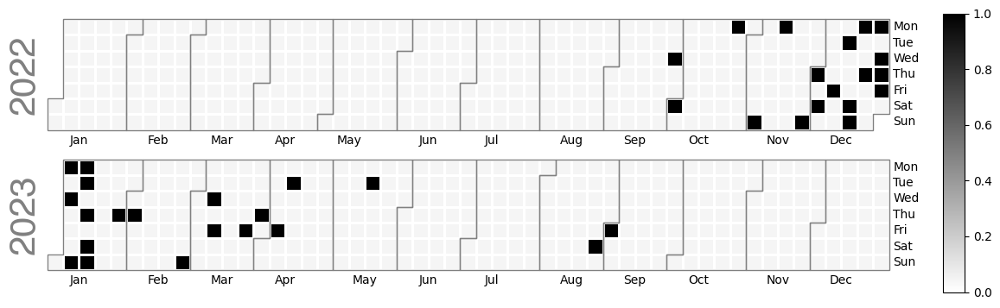

Spearman correlation at None


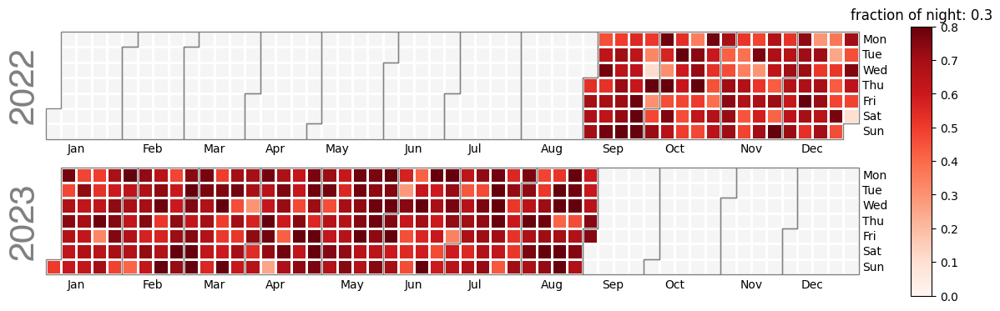

Spearman p-value at None


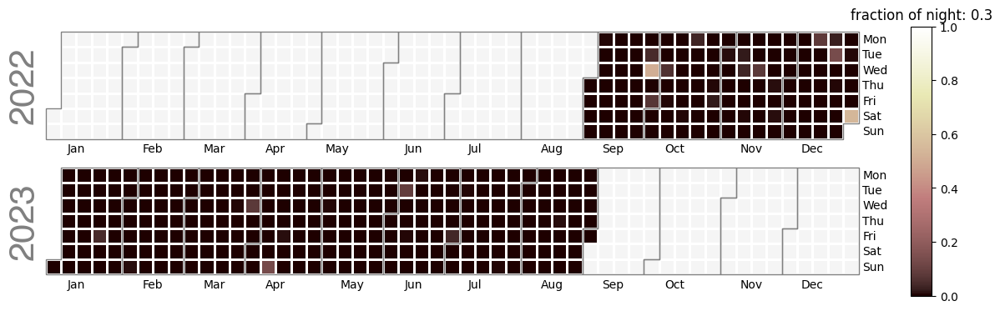

Synoptic control


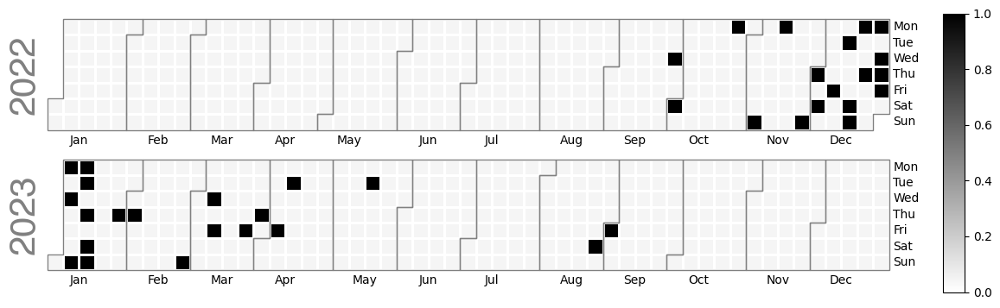

Spearman correlation at None


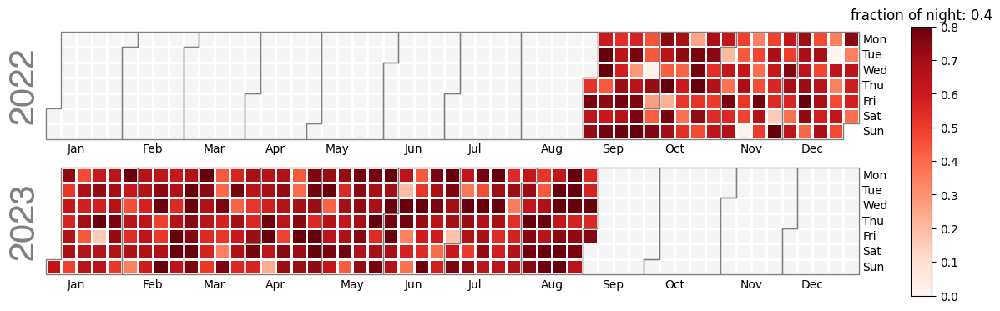

Spearman p-value at None


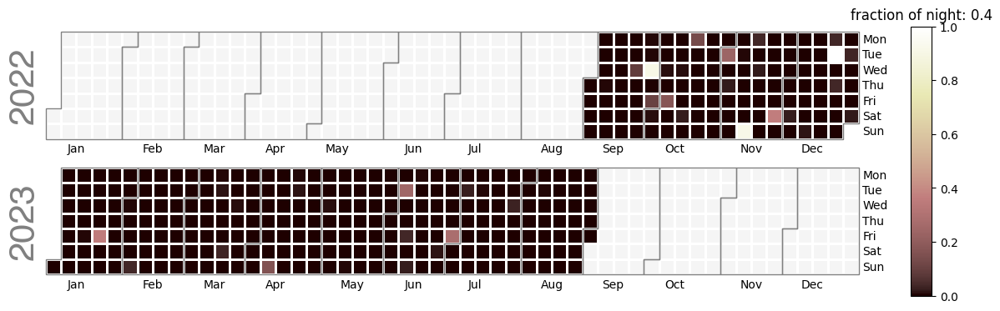

Synoptic control


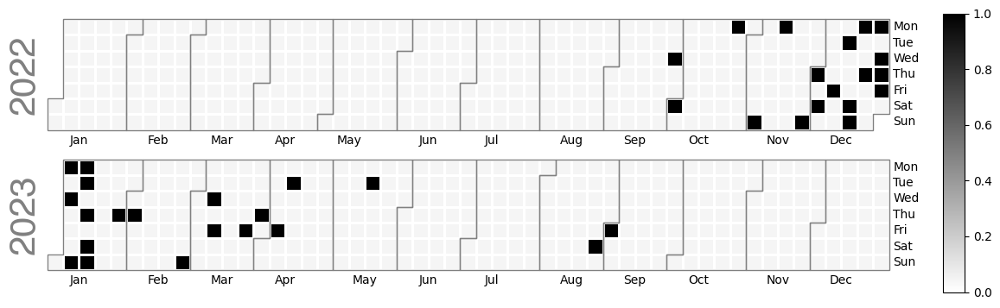

Spearman correlation at None


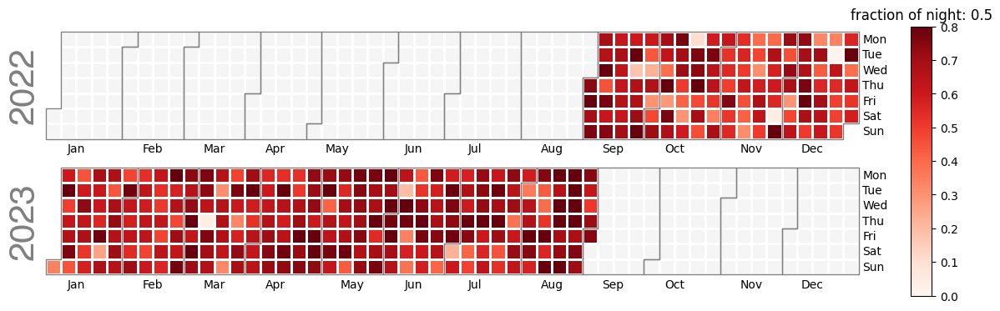

Spearman p-value at None


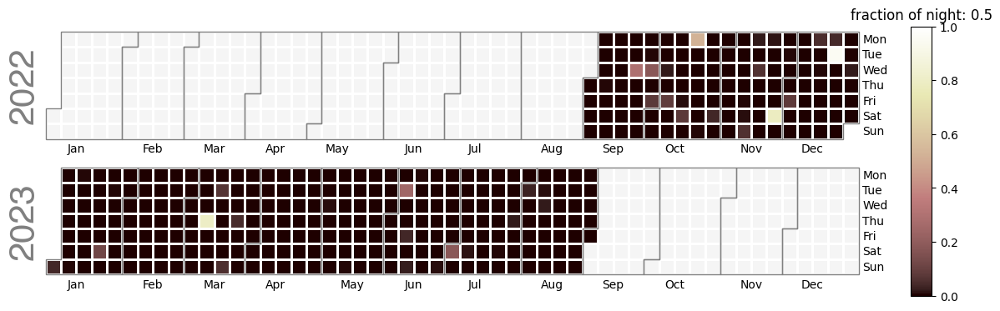

Synoptic control


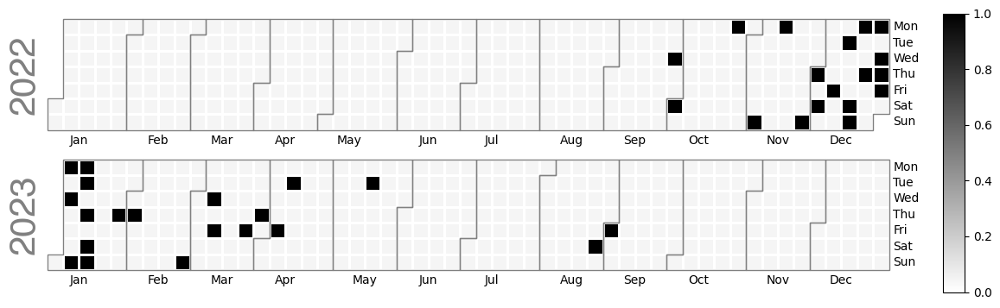

Spearman correlation at None


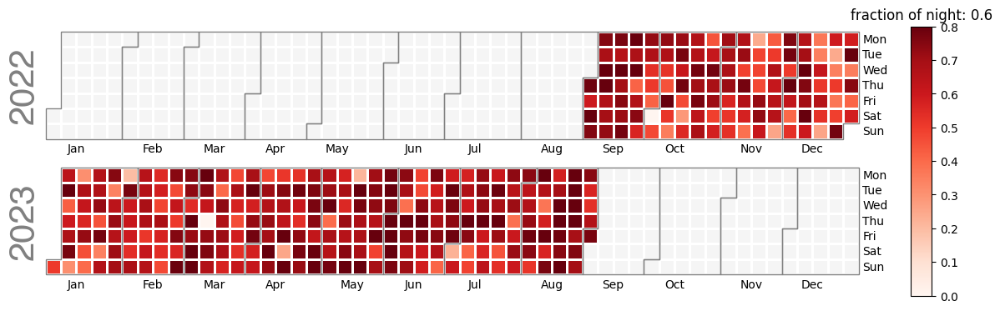

Spearman p-value at None


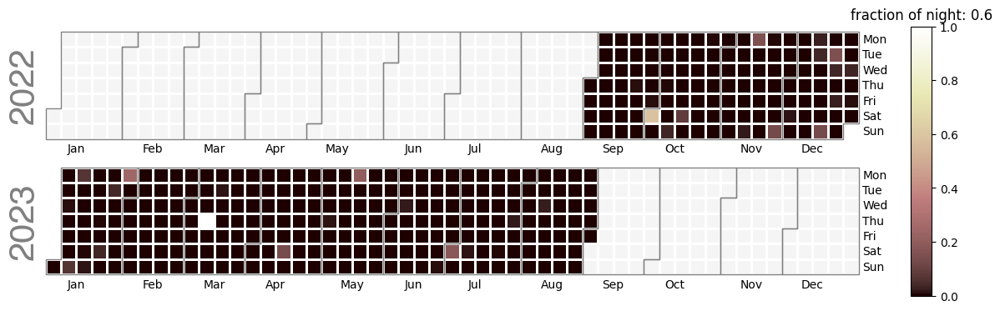

Synoptic control


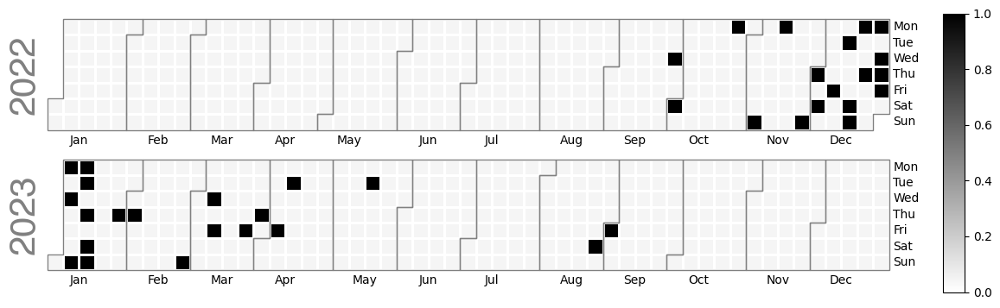

Spearman correlation at None


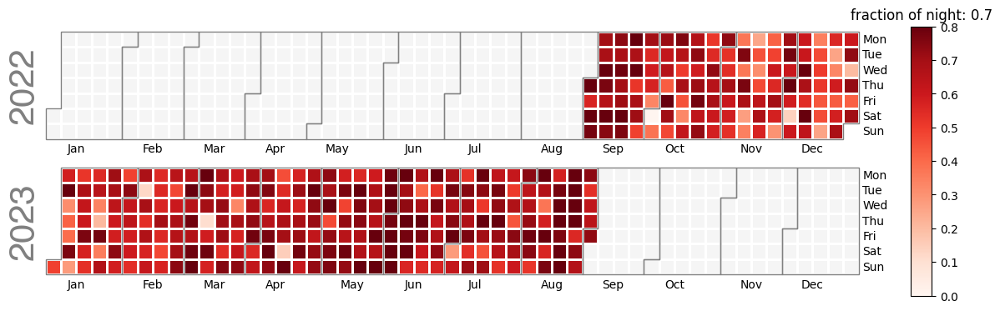

Spearman p-value at None


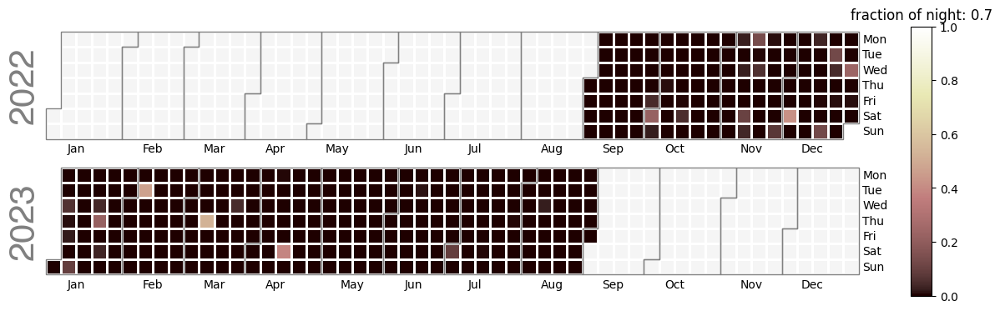

Synoptic control


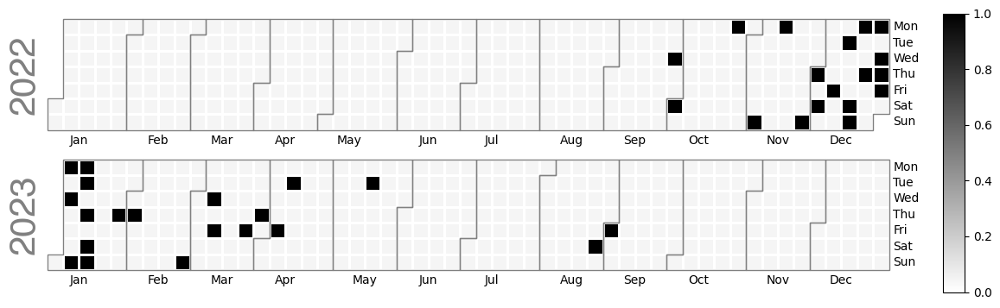

Spearman correlation at None


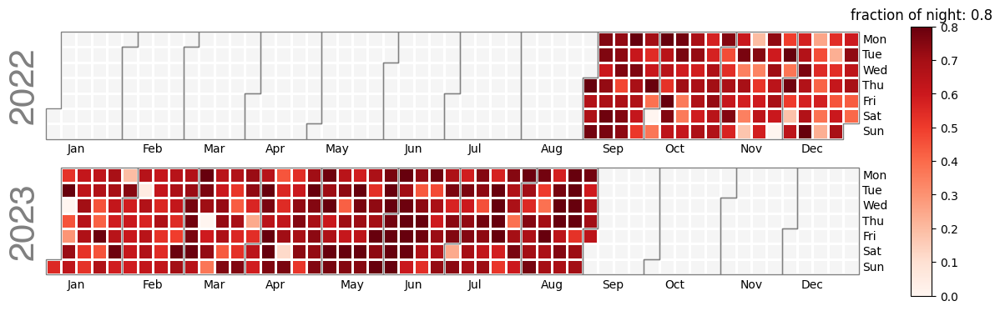

Spearman p-value at None


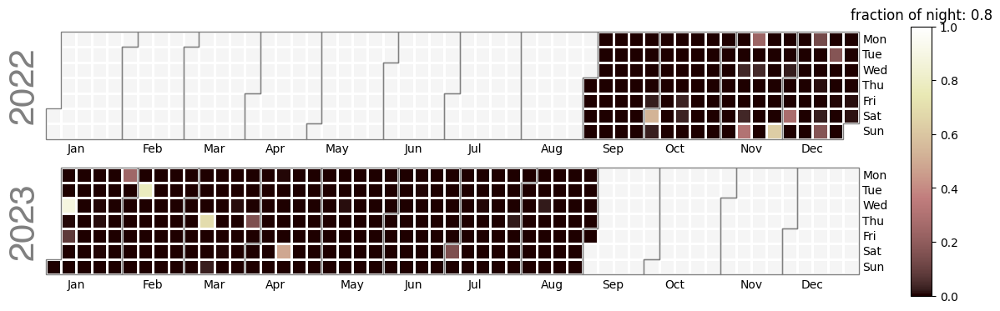

Synoptic control


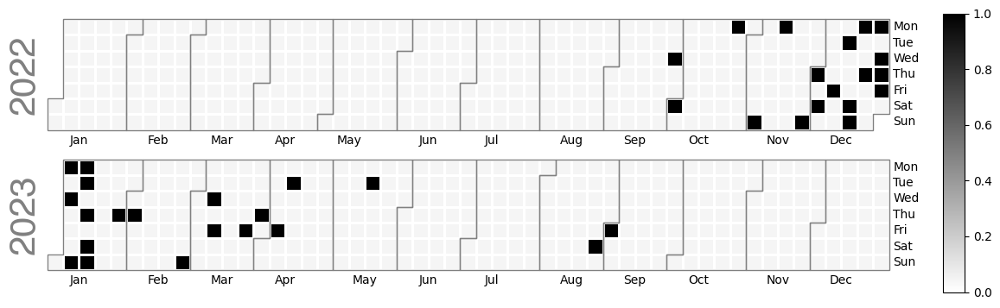

Spearman correlation at None


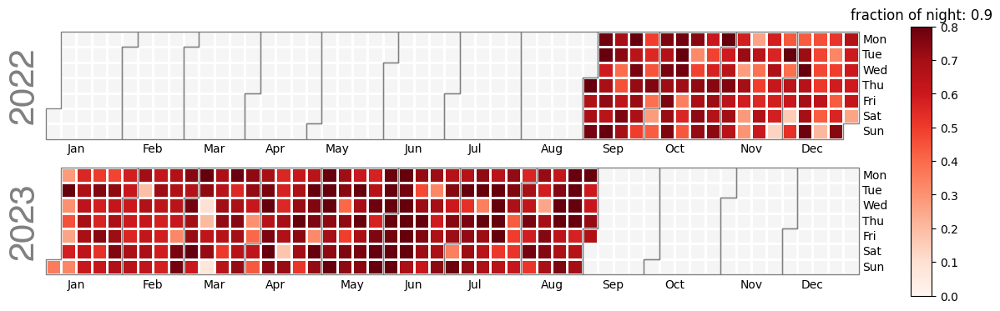

Spearman p-value at None


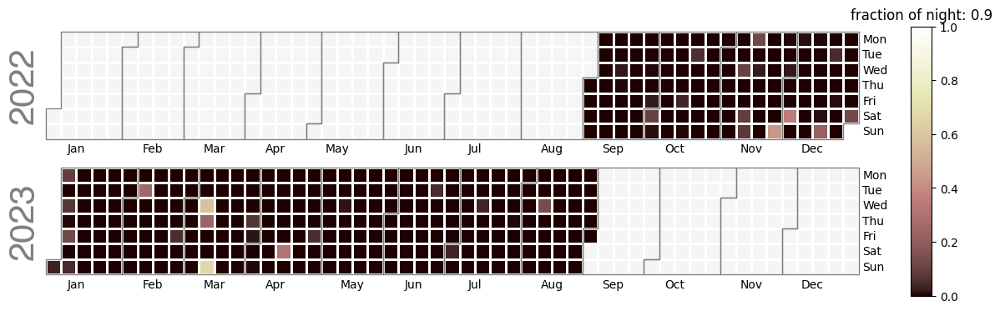

Synoptic control


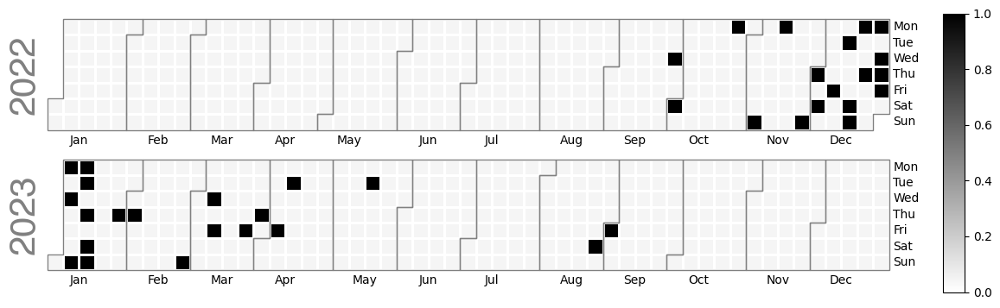

Spearman correlation at None


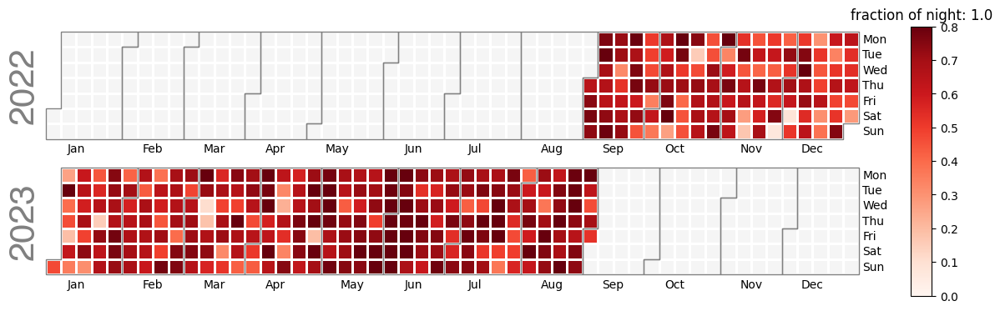

Spearman p-value at None


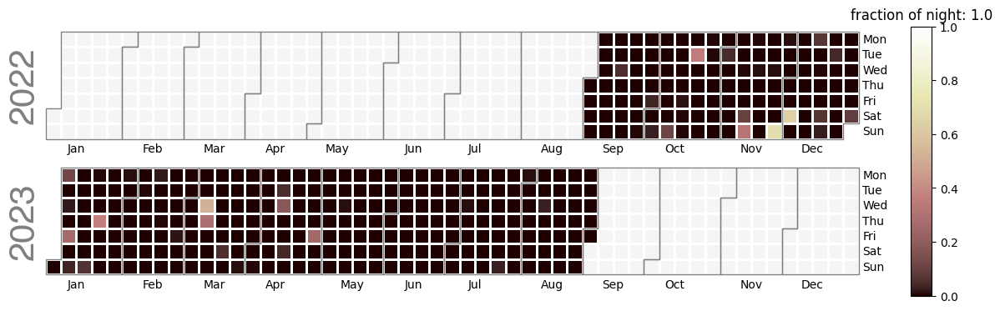

Synoptic control


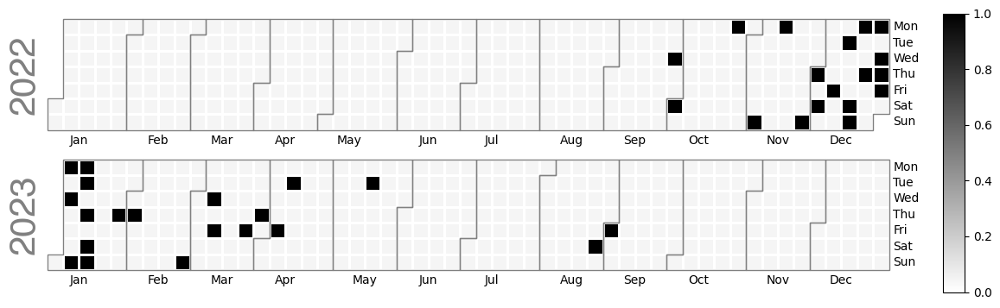

In [16]:
for i in [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]:
    plot_calplot(year, 'BuAre_sum', 300, fraction_of_night=i)

                     Unnamed: 0  Parameter Parameter.1  Pearson Correlation  \
0     2022-09-01 00:00:00+00:00  BuAre_sum   BuAre_sum             0.750891   
47    2022-09-02 23:00:00+00:00  BuAre_sum   BuAre_sum             0.804490   
71    2022-09-03 23:00:00+00:00  BuAre_sum   BuAre_sum             0.680896   
95    2022-09-04 23:00:00+00:00  BuAre_sum   BuAre_sum             0.767081   
119   2022-09-05 23:00:00+00:00  BuAre_sum   BuAre_sum             0.722089   
...                         ...        ...         ...                  ...   
8664  2023-08-28 00:00:00+00:00  BuAre_sum   BuAre_sum             0.684075   
8688  2023-08-29 00:00:00+00:00  BuAre_sum   BuAre_sum             0.498686   
8712  2023-08-30 00:00:00+00:00  BuAre_sum   BuAre_sum             0.492183   
8736  2023-08-31 00:00:00+00:00  BuAre_sum   BuAre_sum             0.634507   
8760  2023-09-01 00:00:00+00:00  BuAre_sum   BuAre_sum             0.697017   

      Pearson p-value  Spearman Correlation  Spearm

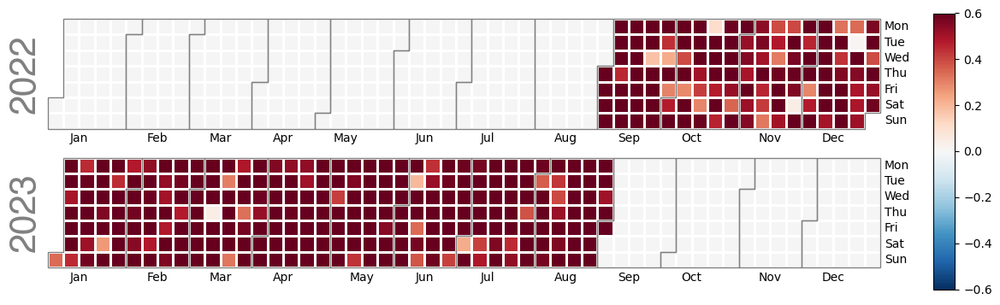

Daytime spearman p-value at None


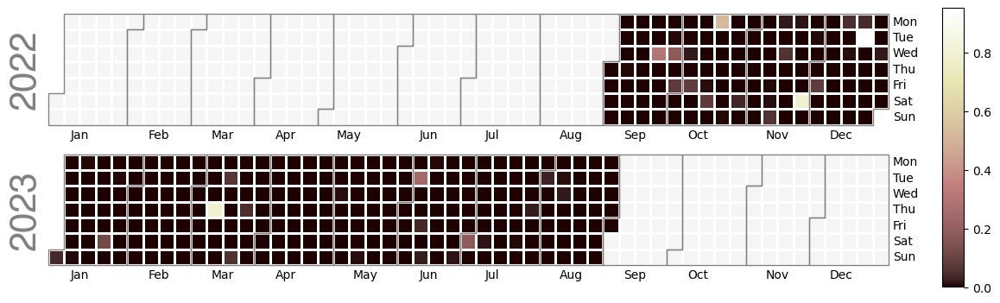

Synoptic control


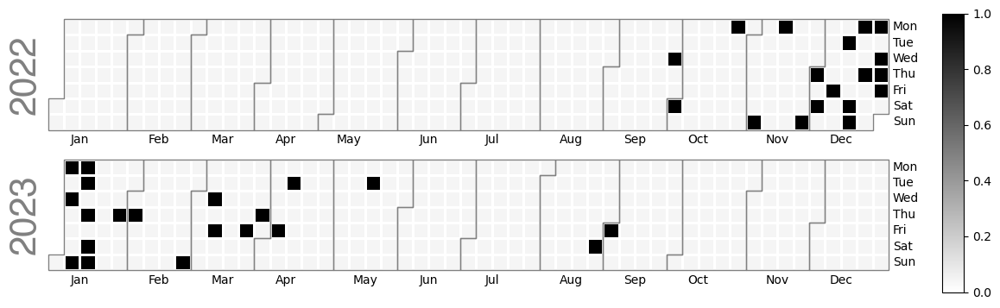

In [14]:
plot_calplot(year, 'BuAre_sum', 300, fraction_of_night=0.1)

                     Unnamed: 0          Parameter        Parameter.1  \
12    2022-09-01 12:00:00+00:00  station_elevation  station_elevation   
35    2022-09-02 11:00:00+00:00  station_elevation  station_elevation   
59    2022-09-03 11:00:00+00:00  station_elevation  station_elevation   
83    2022-09-04 11:00:00+00:00  station_elevation  station_elevation   
107   2022-09-05 11:00:00+00:00  station_elevation  station_elevation   
...                         ...                ...                ...   
8676  2023-08-28 12:00:00+00:00  station_elevation  station_elevation   
8700  2023-08-29 12:00:00+00:00  station_elevation  station_elevation   
8724  2023-08-30 12:00:00+00:00  station_elevation  station_elevation   
8748  2023-08-31 12:00:00+00:00  station_elevation  station_elevation   
8766  2023-09-01 06:00:00+00:00  station_elevation  station_elevation   

      Pearson Correlation  Pearson p-value  Spearman Correlation  \
12              -0.403508         0.012000             

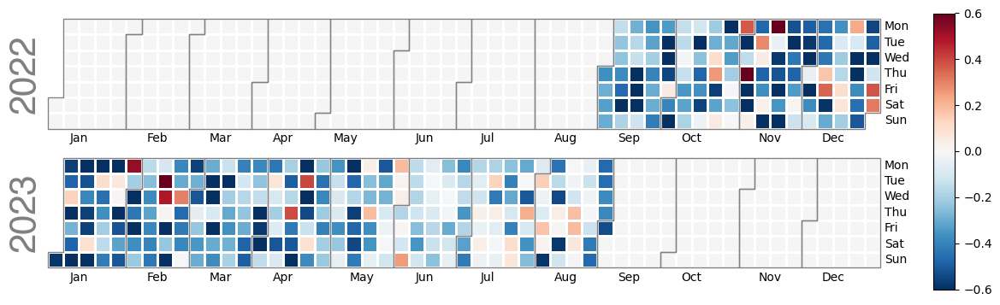

Daytime spearman p-value at None


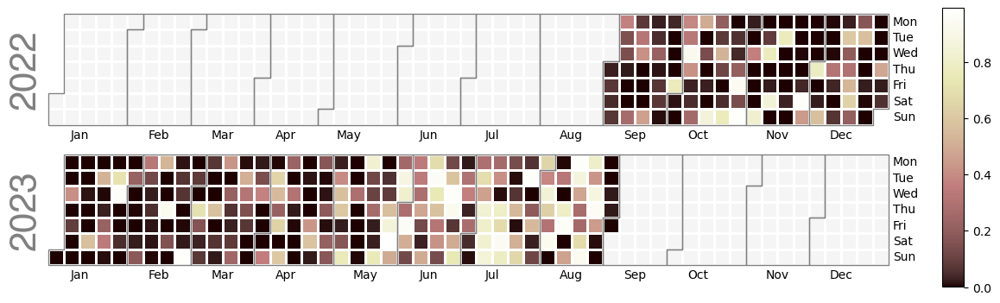

Synoptic control


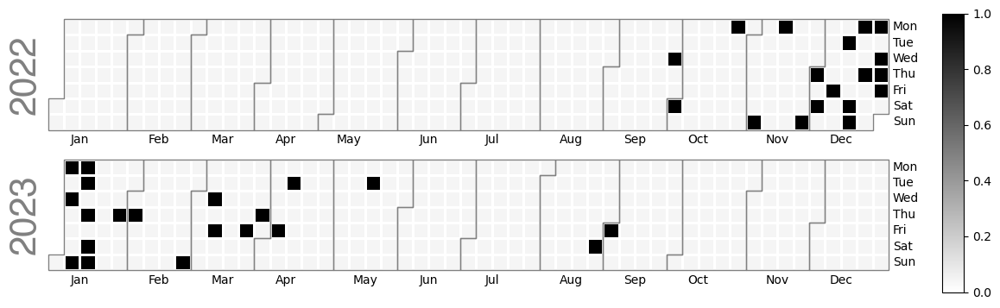

In [386]:
plot_calplot(year, 'station_elevation', 100, fraction_of_day=0.5)

Spearman correlation at None


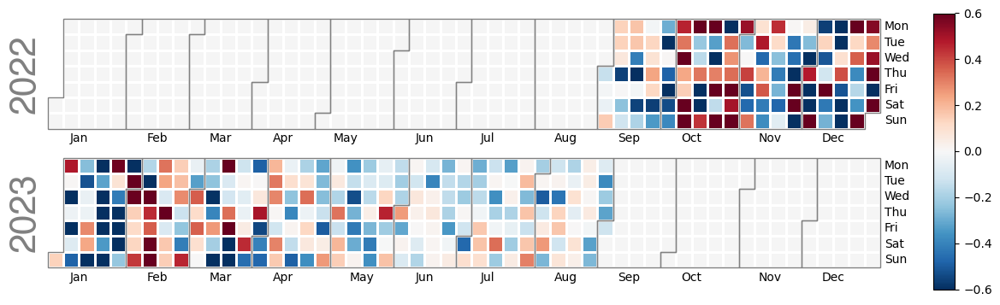

Daytime spearman p-value at None


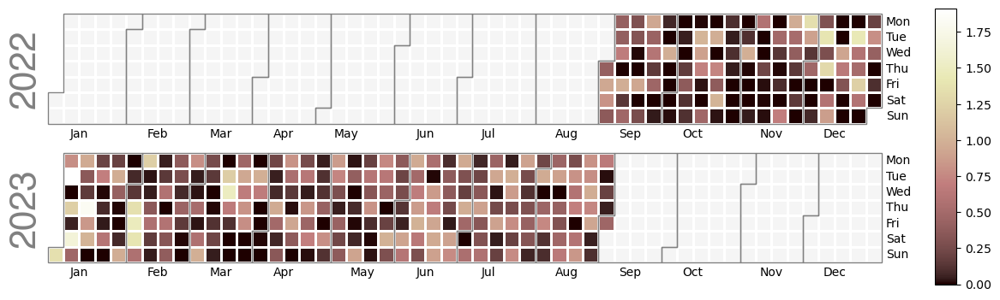

Synoptic control


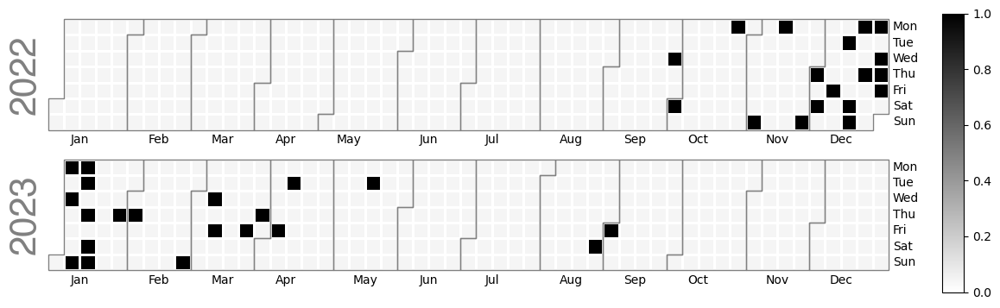

In [312]:
plot_calplot(year, 'station_elevation', 100, fraction_of_night=0.9)

Spearman correlation at None


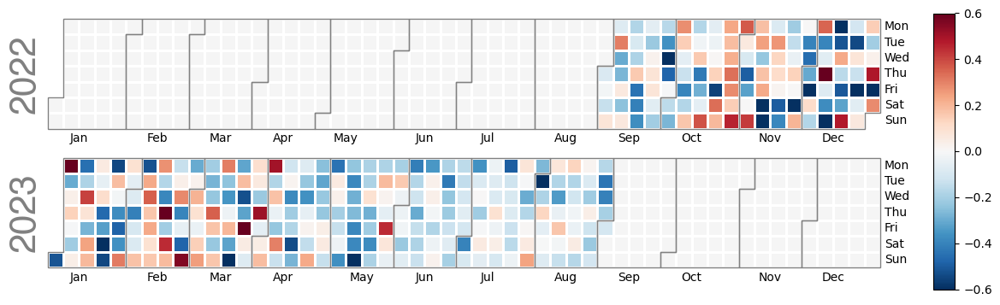

Daytime spearman p-value at None


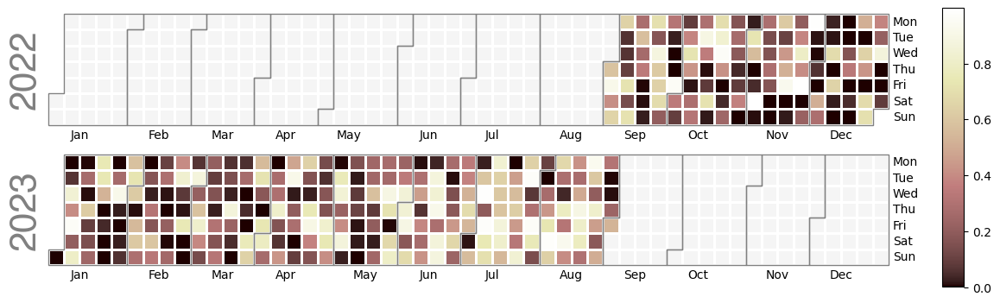

Synoptic control


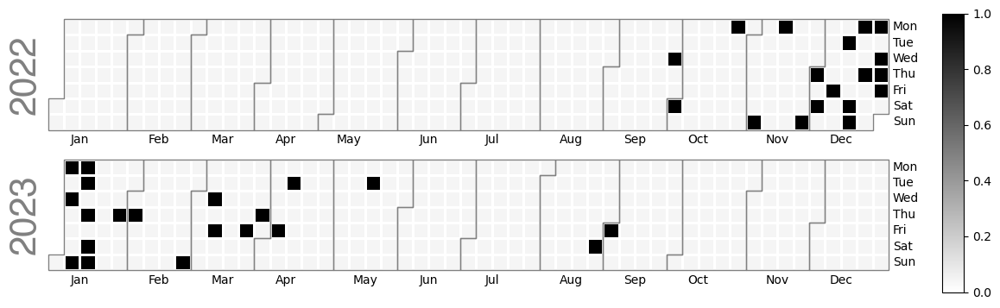

In [384]:
plot_calplot(year, 'station_elevation', 100, fraction_of_night=0.5)

                     Unnamed: 0          Parameter        Parameter.1  \
12    2022-09-01 12:00:00+00:00  station_elevation  station_elevation   
35    2022-09-02 11:00:00+00:00  station_elevation  station_elevation   
59    2022-09-03 11:00:00+00:00  station_elevation  station_elevation   
83    2022-09-04 11:00:00+00:00  station_elevation  station_elevation   
107   2022-09-05 11:00:00+00:00  station_elevation  station_elevation   
...                         ...                ...                ...   
8676  2023-08-28 12:00:00+00:00  station_elevation  station_elevation   
8700  2023-08-29 12:00:00+00:00  station_elevation  station_elevation   
8724  2023-08-30 12:00:00+00:00  station_elevation  station_elevation   
8748  2023-08-31 12:00:00+00:00  station_elevation  station_elevation   
8766  2023-09-01 06:00:00+00:00  station_elevation  station_elevation   

      Pearson Correlation  Pearson p-value  Spearman Correlation  \
12              -0.403508         0.012000             

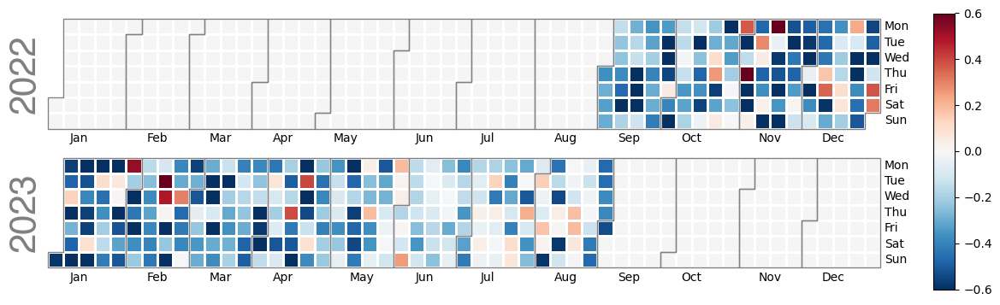

Daytime spearman p-value at None


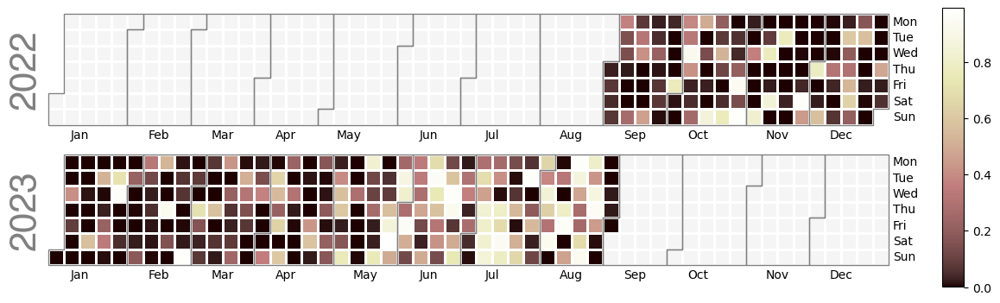

Synoptic control


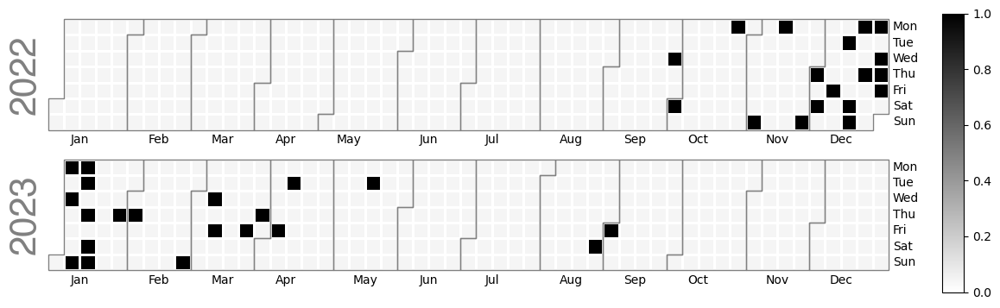

In [387]:
plot_calplot(year, 'station_elevation', 100, fraction_of_day=0.5)

Spearman correlation at None


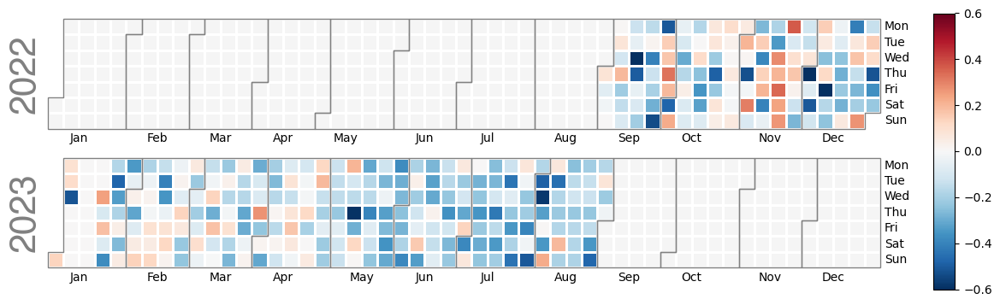

Daytime spearman p-value at None


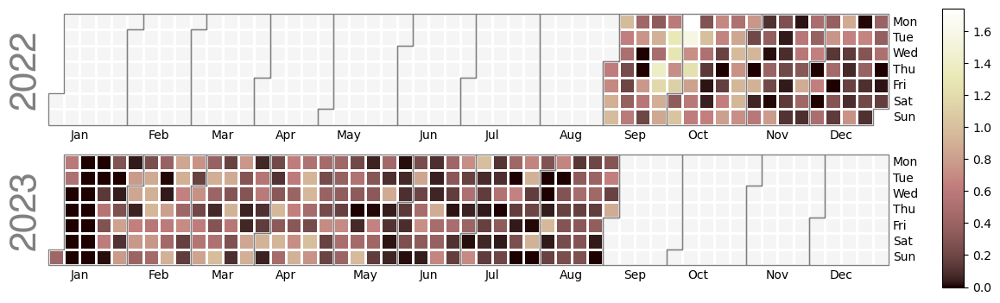

Synoptic control


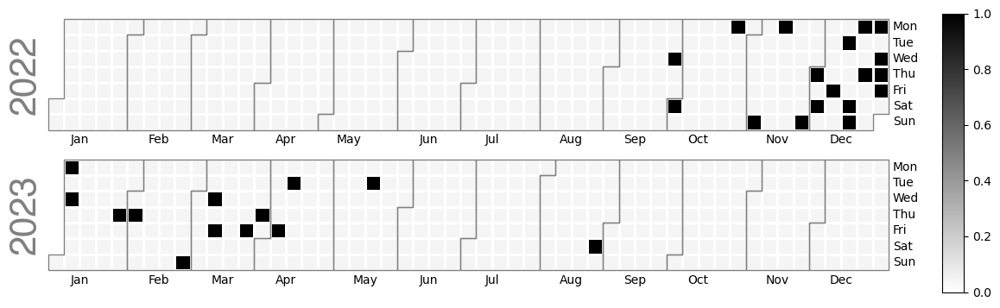

In [305]:
plot_calplot(year, 'SVF_3D_mean', 100, fraction_of_day=0.6)

Spearman correlation at None


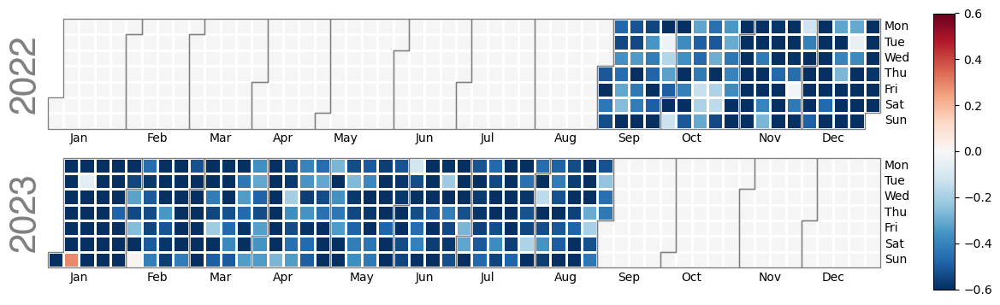

Daytime spearman p-value at None


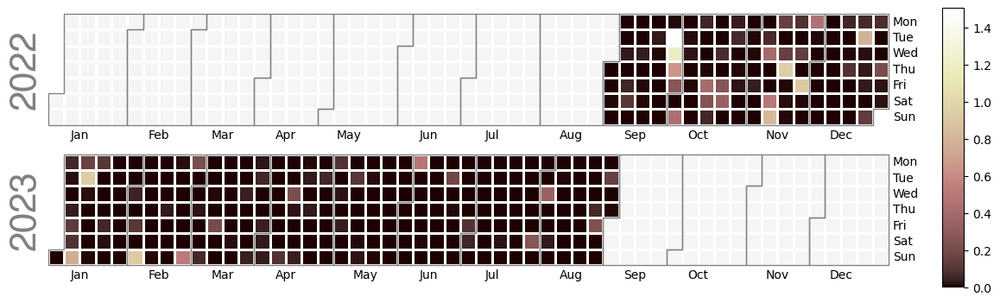

Synoptic control


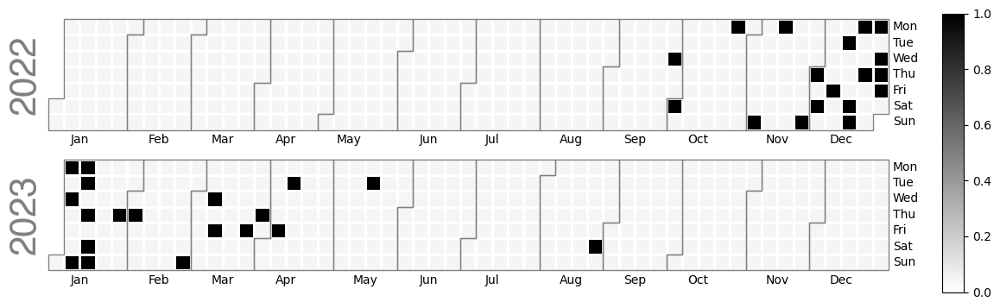

In [248]:
plot_calplot(year, 'SVF_3D_mean', 100, fraction_of_night=0.1)

                     Unnamed: 0  Parameter Parameter.1  Pearson Correlation  \
0     2022-09-01 00:00:00+00:00  BuAre_sum   BuAre_sum             0.750891   
47    2022-09-02 23:00:00+00:00  BuAre_sum   BuAre_sum             0.804490   
71    2022-09-03 23:00:00+00:00  BuAre_sum   BuAre_sum             0.680896   
95    2022-09-04 23:00:00+00:00  BuAre_sum   BuAre_sum             0.767081   
119   2022-09-05 23:00:00+00:00  BuAre_sum   BuAre_sum             0.722089   
...                         ...        ...         ...                  ...   
8664  2023-08-28 00:00:00+00:00  BuAre_sum   BuAre_sum             0.684075   
8688  2023-08-29 00:00:00+00:00  BuAre_sum   BuAre_sum             0.498686   
8712  2023-08-30 00:00:00+00:00  BuAre_sum   BuAre_sum             0.492183   
8736  2023-08-31 00:00:00+00:00  BuAre_sum   BuAre_sum             0.634507   
8760  2023-09-01 00:00:00+00:00  BuAre_sum   BuAre_sum             0.697017   

      Pearson p-value  Spearman Correlation  Spearm

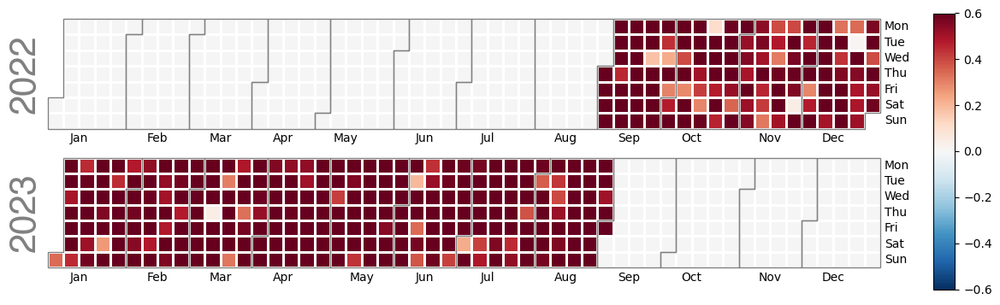

Daytime spearman p-value at None


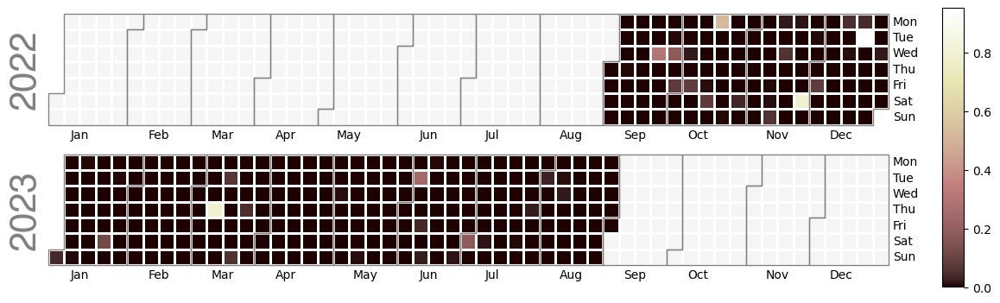

Synoptic control


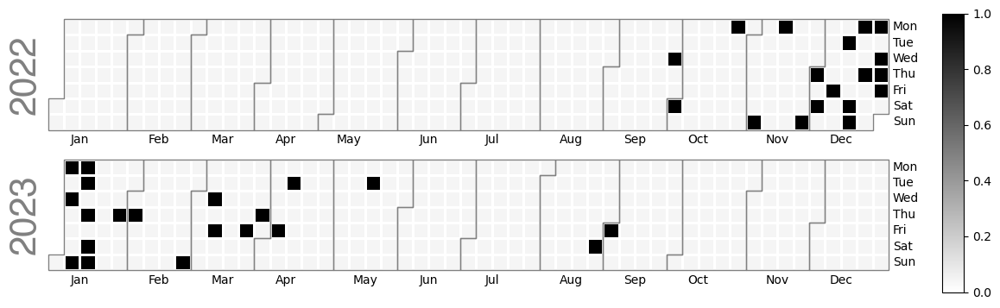

In [392]:
plot_calplot(year, 'BuAre_sum', 300, fraction_of_night=0.6)

Spearman correlation at None


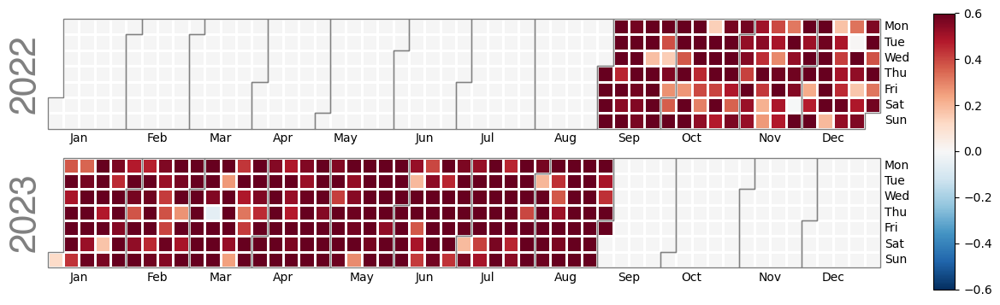

Daytime spearman p-value at None


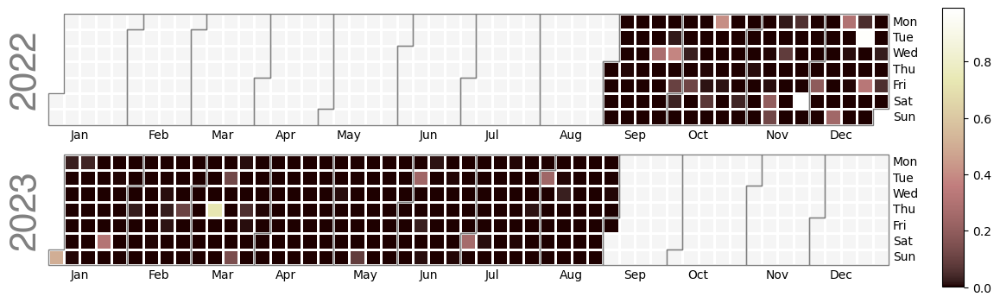

Synoptic control


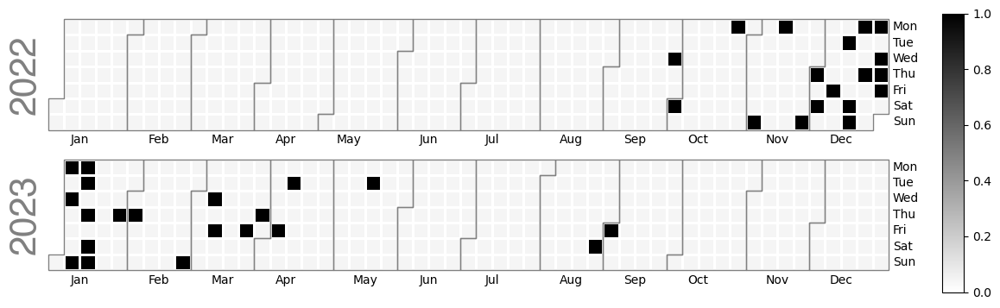

In [379]:
plot_calplot(year, 'BuAre_sum', 300, fraction_of_night=0.6)

                     Unnamed: 0  Parameter Parameter.1  Pearson Correlation  \
12    2022-09-01 12:00:00+00:00  BuAre_sum   BuAre_sum             0.028203   
35    2022-09-02 11:00:00+00:00  BuAre_sum   BuAre_sum             0.104514   
59    2022-09-03 11:00:00+00:00  BuAre_sum   BuAre_sum             0.363091   
83    2022-09-04 11:00:00+00:00  BuAre_sum   BuAre_sum             0.056626   
107   2022-09-05 11:00:00+00:00  BuAre_sum   BuAre_sum             0.206138   
...                         ...        ...         ...                  ...   
8676  2023-08-28 12:00:00+00:00  BuAre_sum   BuAre_sum             0.415438   
8700  2023-08-29 12:00:00+00:00  BuAre_sum   BuAre_sum            -0.025486   
8724  2023-08-30 12:00:00+00:00  BuAre_sum   BuAre_sum             0.107084   
8748  2023-08-31 12:00:00+00:00  BuAre_sum   BuAre_sum             0.177397   
8766  2023-09-01 06:00:00+00:00  BuAre_sum   BuAre_sum             0.448145   

      Pearson p-value  Spearman Correlation  Spearm

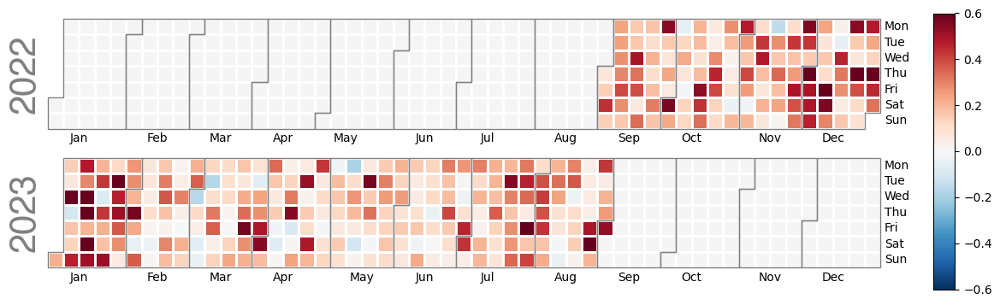

Daytime spearman p-value at None


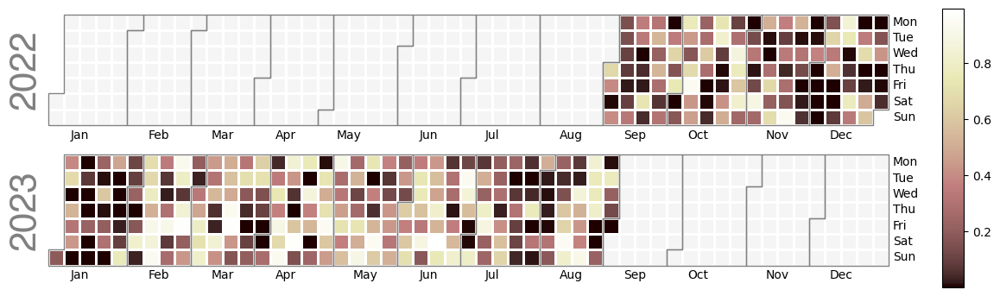

Synoptic control


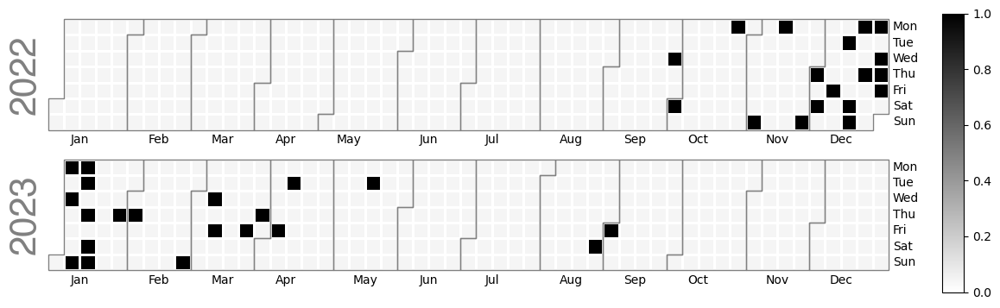

In [393]:
plot_calplot(year, 'BuAre_sum', 300, fraction_of_day=0.6)

Spearman correlation at None


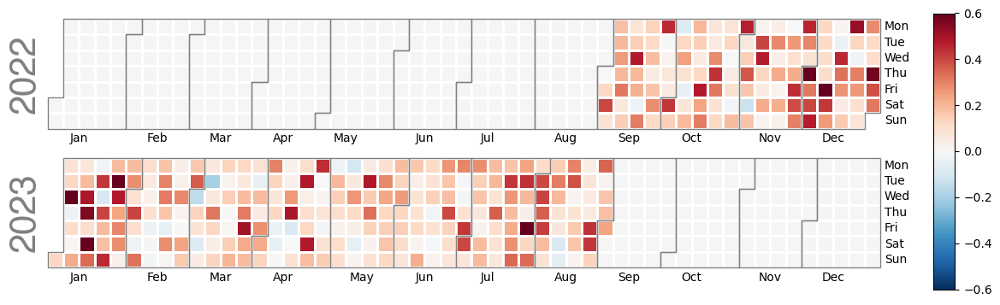

Daytime spearman p-value at None


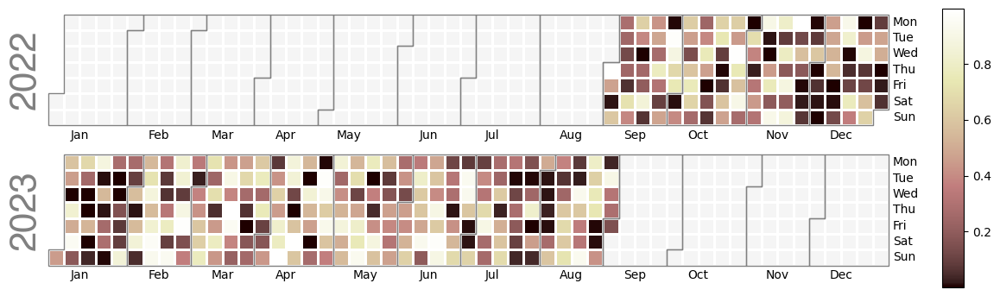

Synoptic control


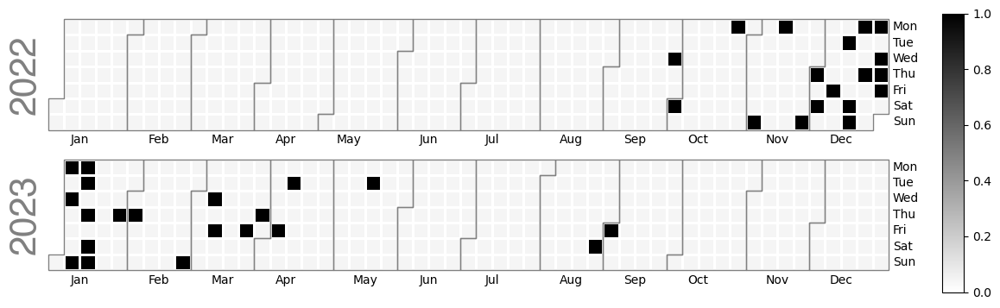

In [380]:
plot_calplot(year, 'BuAre_sum', 300, fraction_of_day=0.6)

Spearman correlation at None


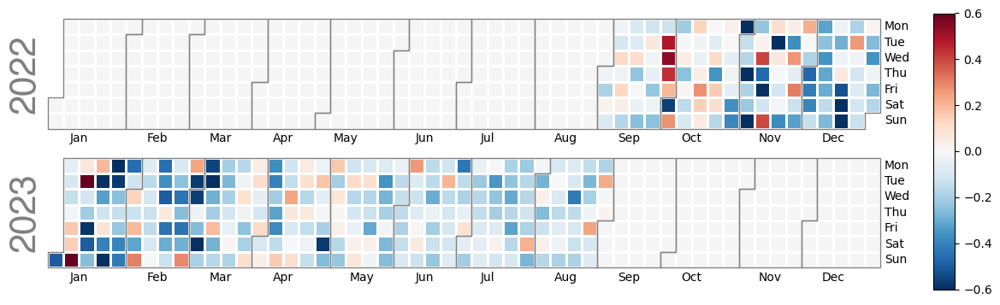

Daytime spearman p-value at None


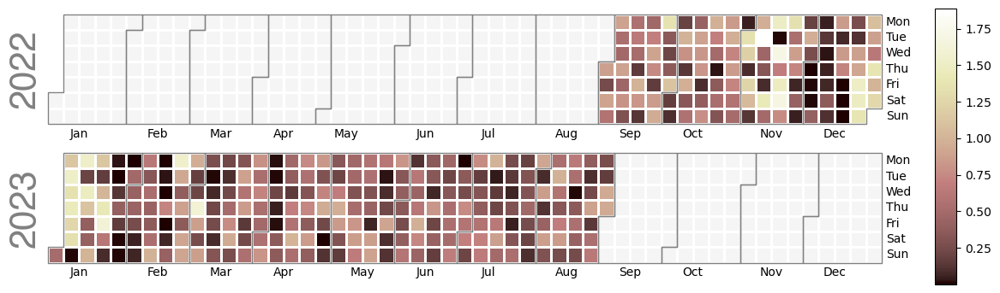

Synoptic control


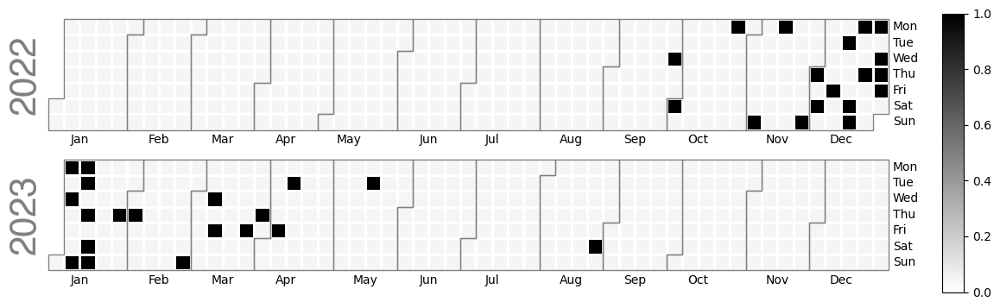

In [249]:
plot_calplot(year, 'sky_view_factor', 300, fraction_of_night=0.1)

Index(['Parameter', 'Pearson Correlation', 'Pearson p-value',
       'Spearman Correlation', 'Spearman p-value', 'Mutual Information',
       'Time'],
      dtype='object')
Spearman correlation at 13


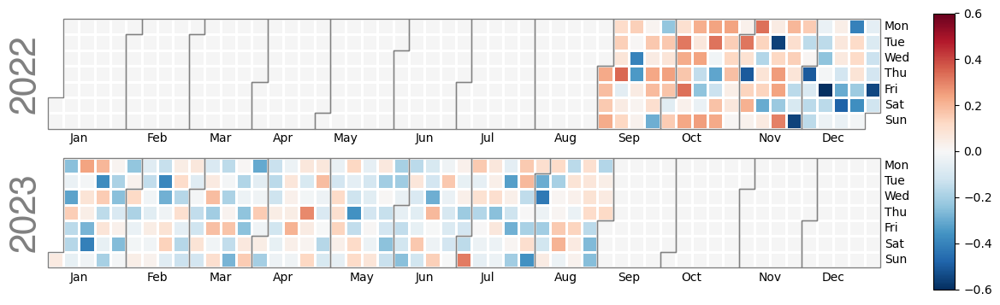

Daytime spearman p-value at 13


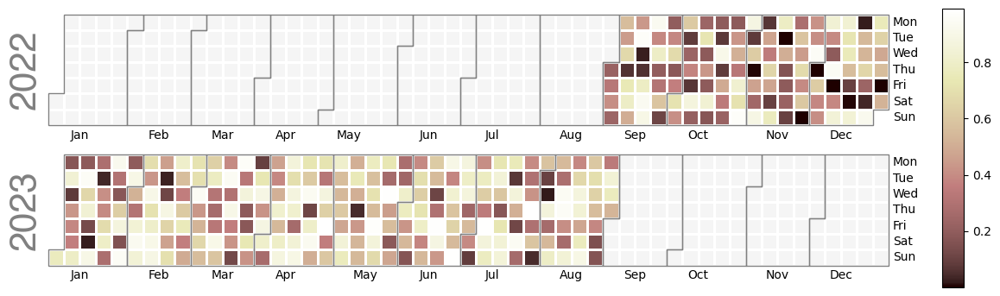

In [73]:
plot_calplot(year, 'BuIBD', 200, 13)

Index(['Parameter', 'Pearson Correlation', 'Pearson p-value',
       'Spearman Correlation', 'Spearman p-value', 'Mutual Information',
       'Time'],
      dtype='object')
Daytime spearman correlation:


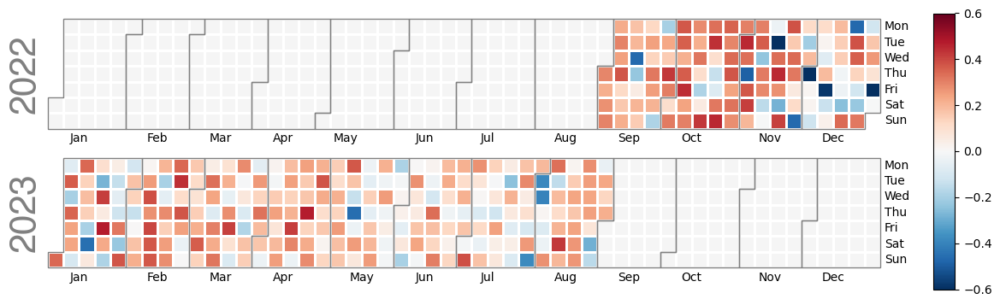

Daytime spearman p-value:


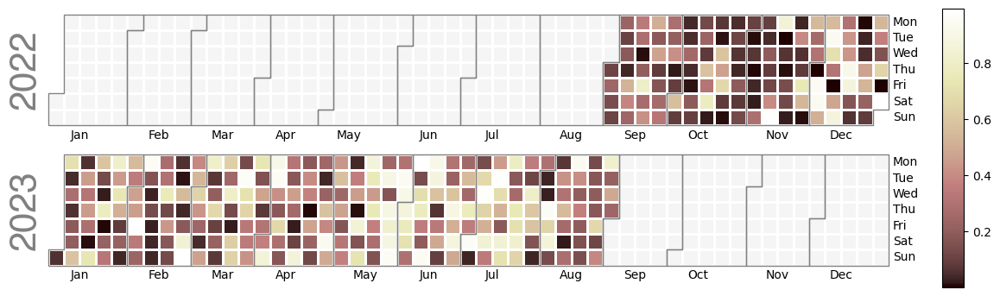

Nighttime spearman correlation:


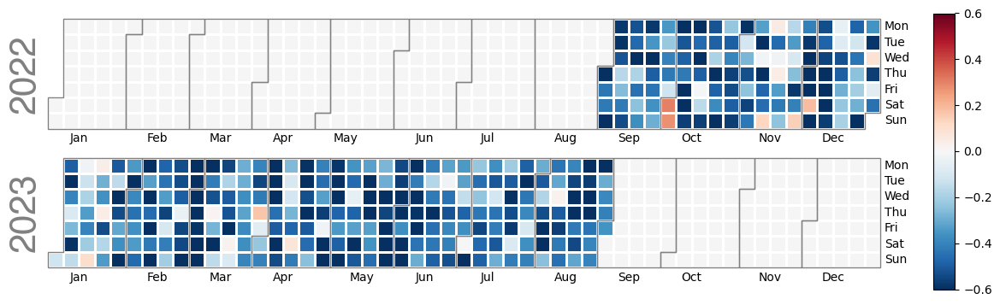

Nighttime spearman p-value:


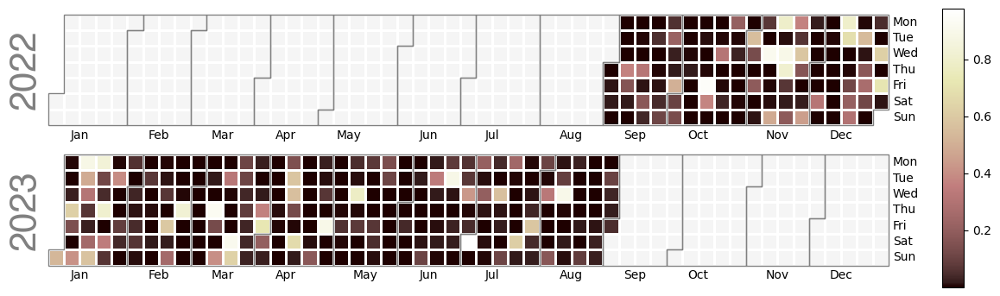

In [42]:
plot_calplot(year, 'SVF_3D_mean', 200)

Index(['Parameter', 'Pearson Correlation', 'Pearson p-value',
       'Spearman Correlation', 'Spearman p-value', 'Mutual Information',
       'Time'],
      dtype='object')
Daytime spearman correlation:


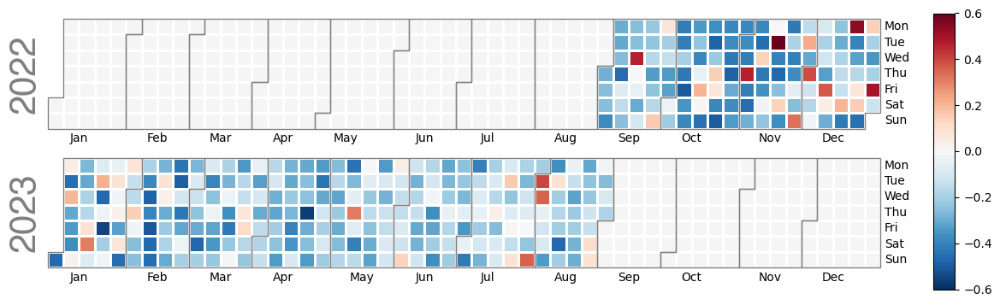

Daytime spearman p-value:


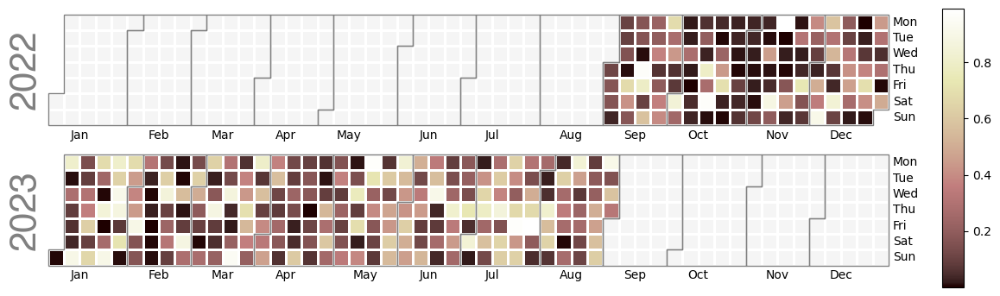

Nighttime spearman correlation:


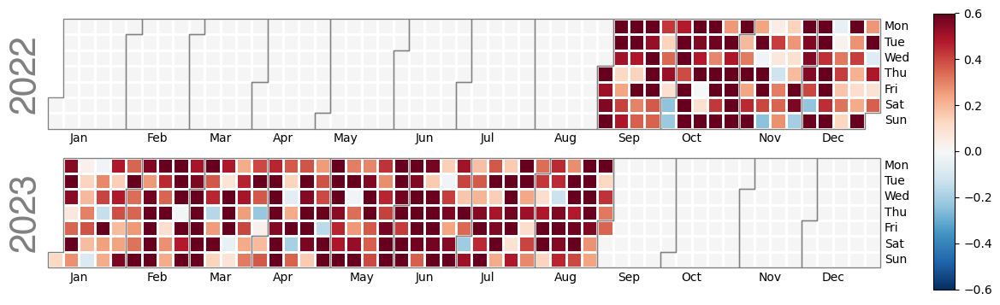

Nighttime spearman p-value:


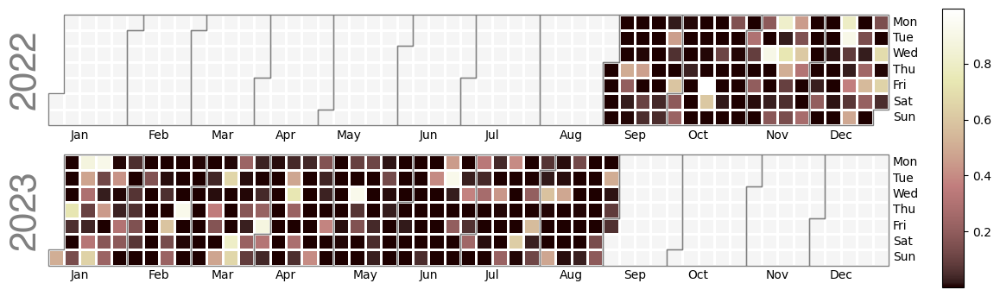

In [39]:
plot_calplot(year, 'BuHt_wmean', 200)

Index(['Parameter', 'Pearson Correlation', 'Pearson p-value',
       'Spearman Correlation', 'Spearman p-value', 'Mutual Information',
       'Time'],
      dtype='object')
Daytime spearman correlation:


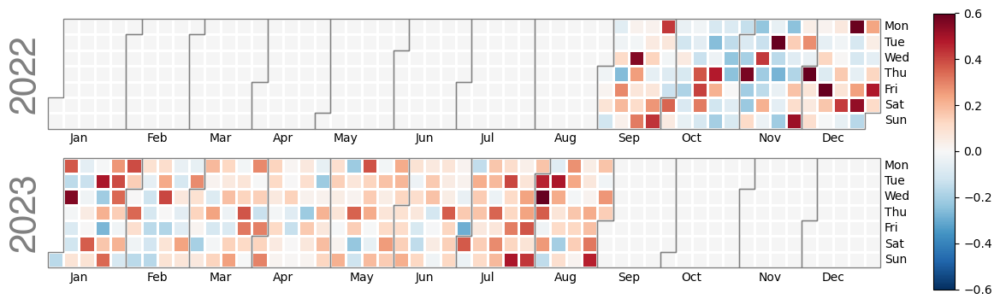

Daytime spearman p-value:


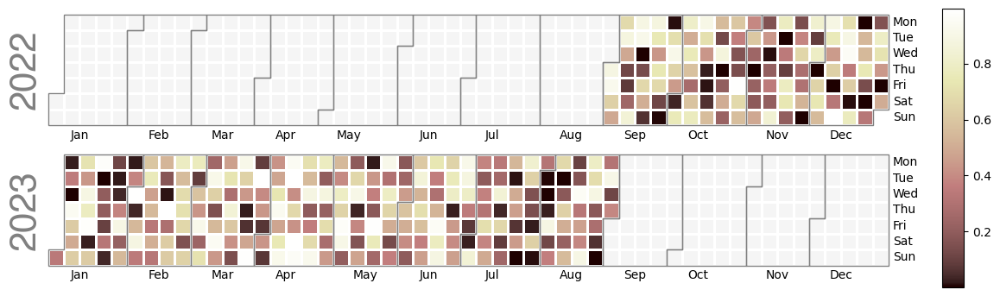

Nighttime spearman correlation:


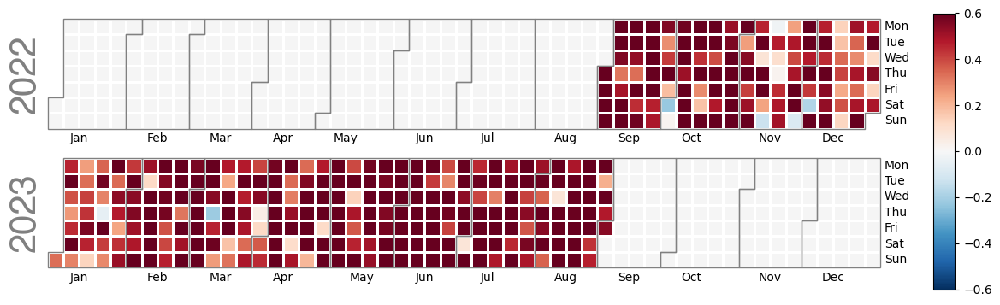

Nighttime spearman p-value:


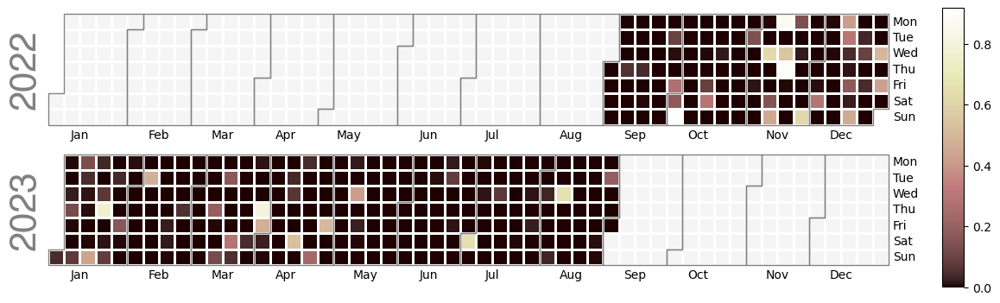

In [40]:
plot_calplot(year, 'BuHt_wmean', 300)

Index(['Parameter', 'Pearson Correlation', 'Pearson p-value',
       'Spearman Correlation', 'Spearman p-value', 'Mutual Information',
       'Time'],
      dtype='object')
Daytime spearman correlation:


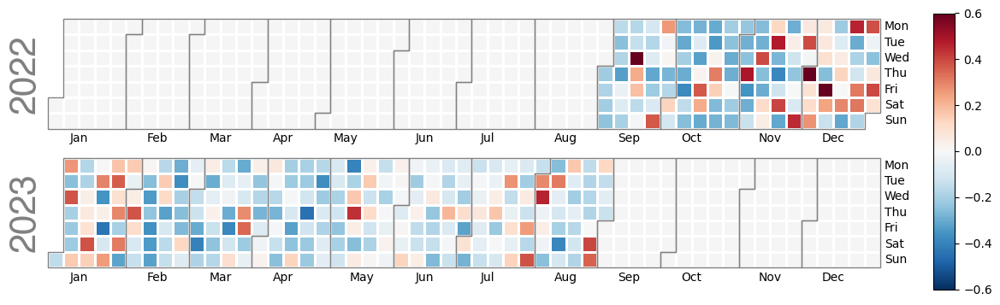

Daytime spearman p-value:


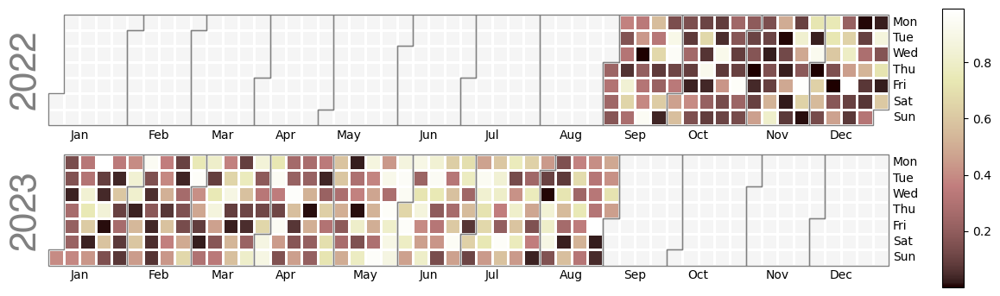

Nighttime spearman correlation:


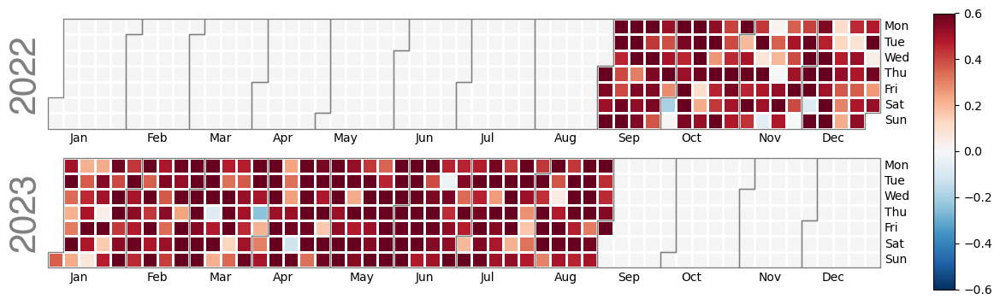

Nighttime spearman p-value:


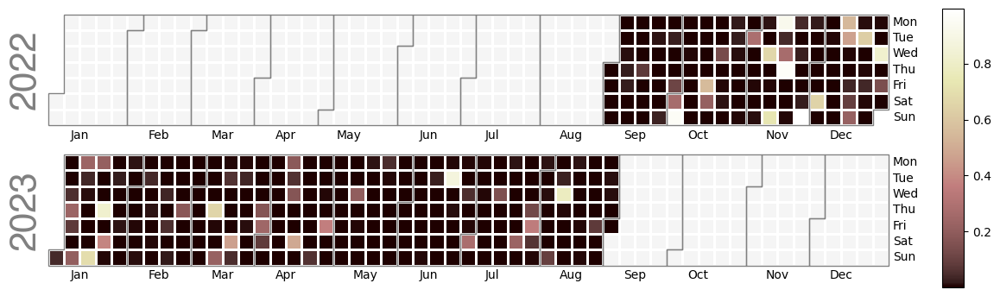

In [37]:
plot_calplot(year, 'BuVol_3D_sum', 100)

Daytime spearman correlation:


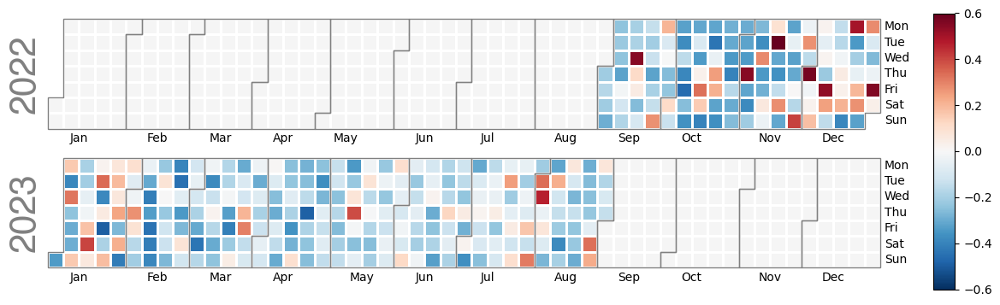

Daytime spearman p-value:


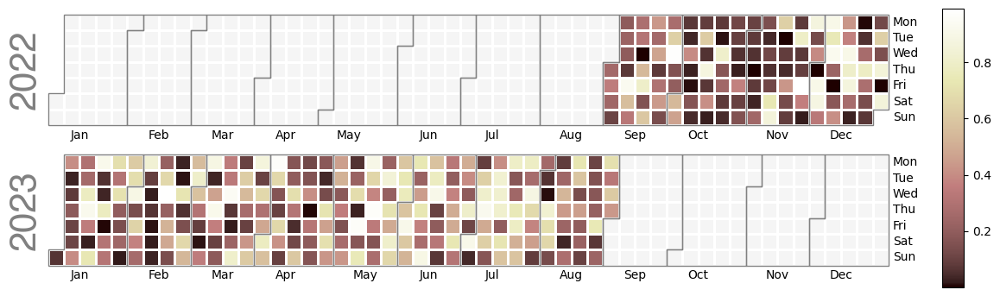

Nighttime spearman correlation:


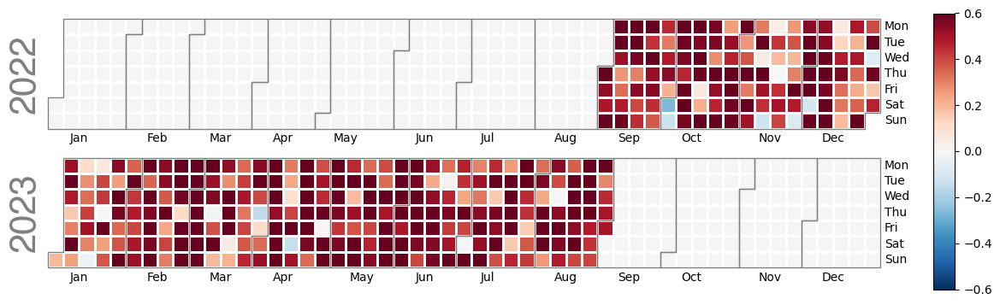

Nighttime spearman p-value:


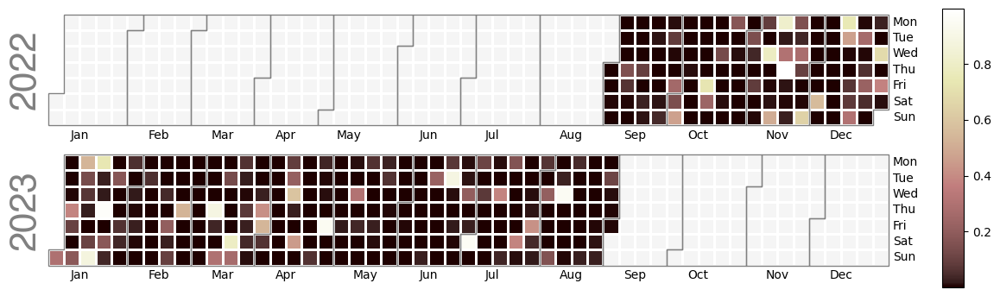

In [11]:
plot_calplot(year, 'BuVol_3D_sum', 200)

Daytime spearman correlation:


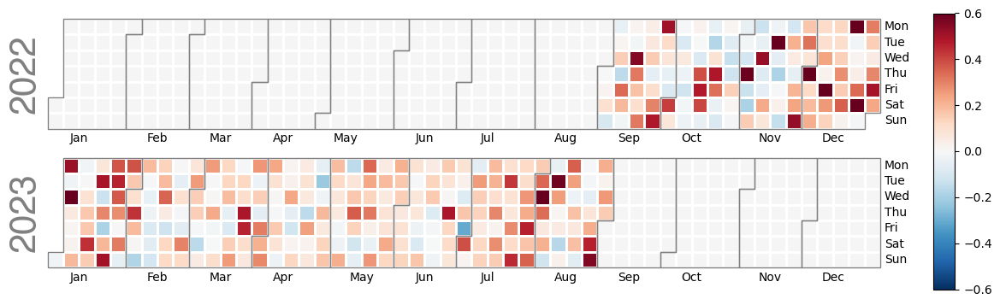

Daytime spearman p-value:


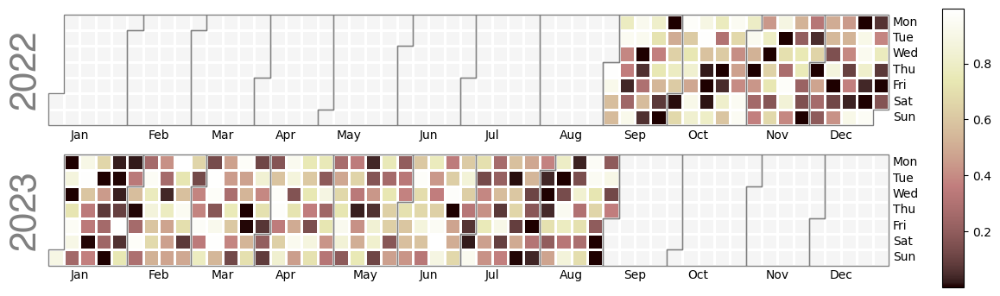

Nighttime spearman correlation:


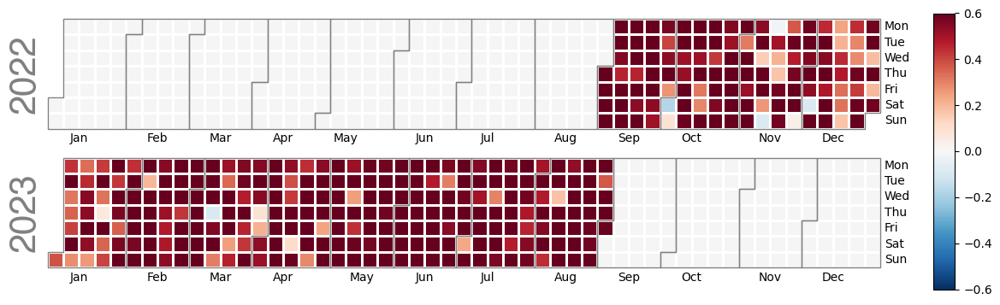

Nighttime spearman p-value:


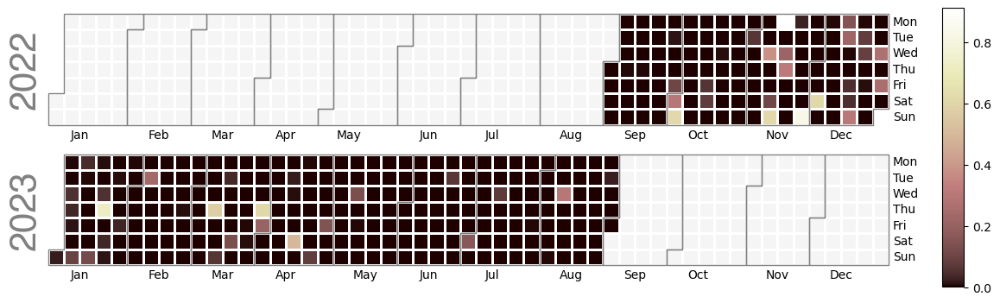

In [12]:
plot_calplot(year, 'BuVol_3D_sum', 300)

# 100m

Daytime spearman correlation:


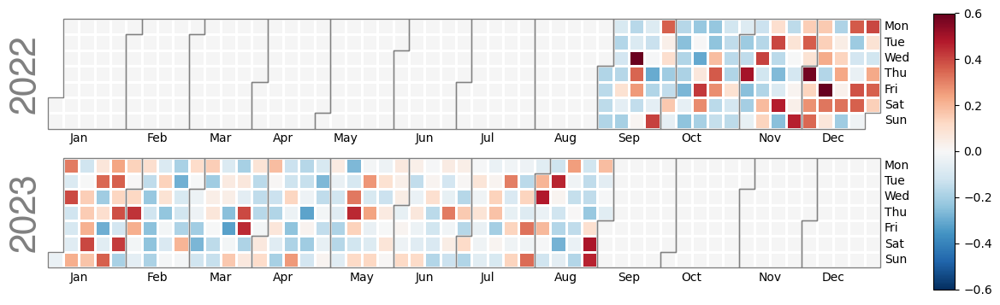

Daytime spearman p-value:


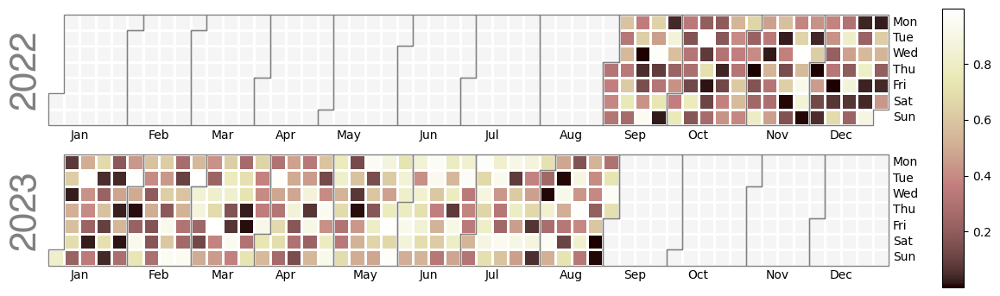

Nighttime spearman correlation:


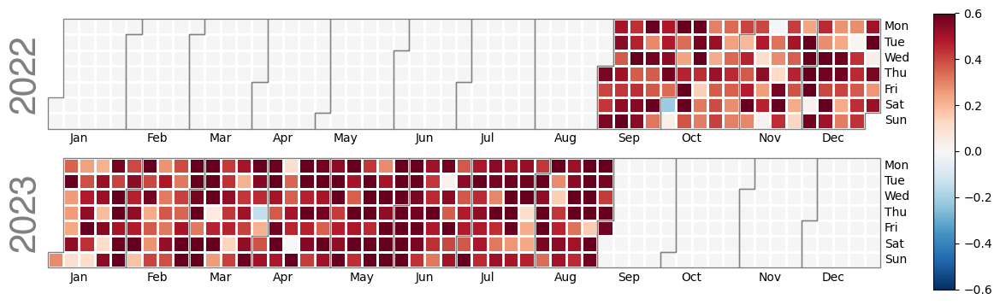

Nighttime spearman p-value:


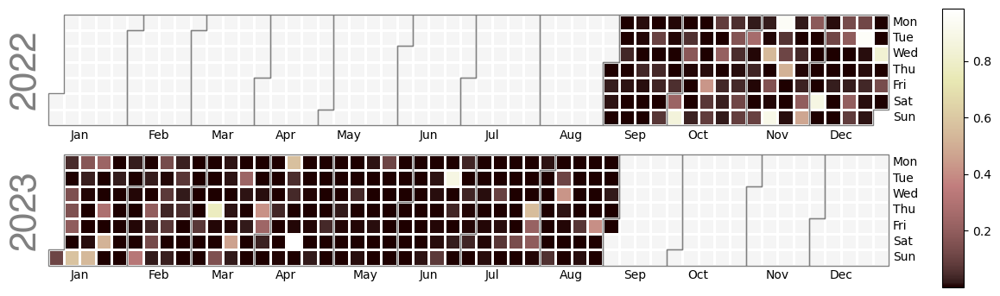

In [8]:
plot_calplot(year, 'BuAre_sum', 100)

Daytime spearman correlation:


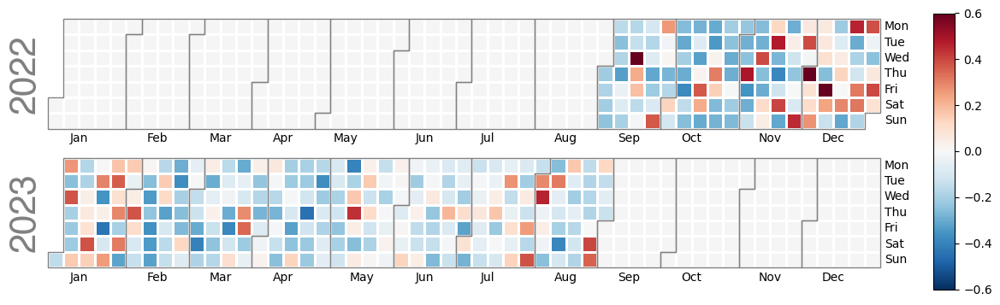

Daytime spearman p-value:


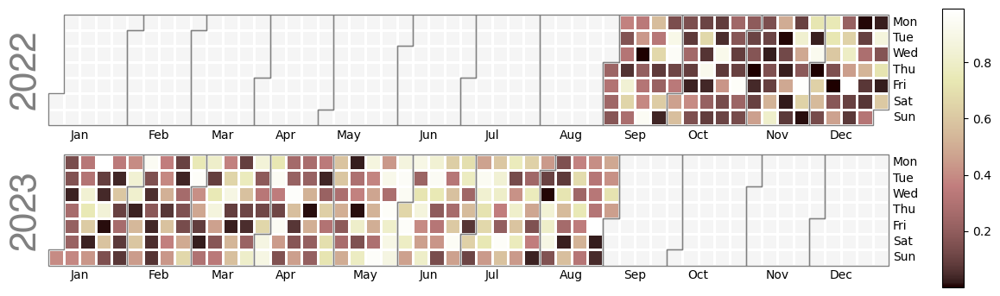

Nighttime spearman correlation:


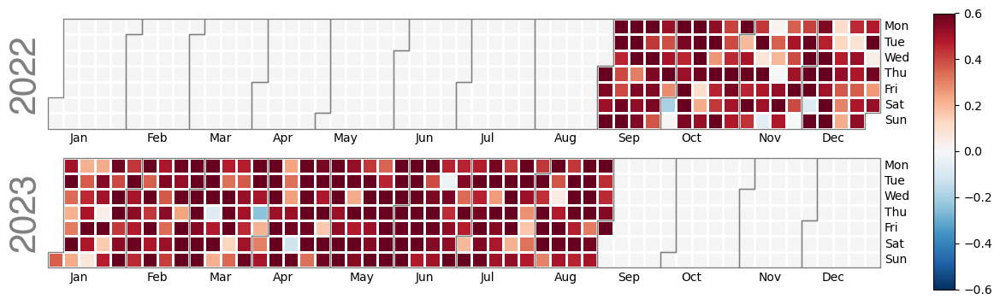

Nighttime spearman p-value:


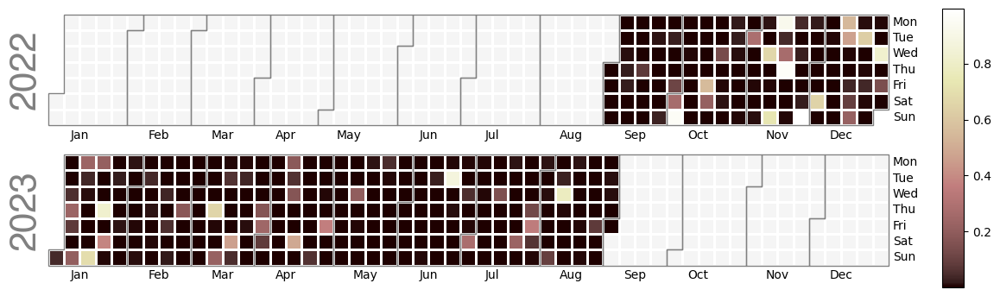

In [9]:
plot_calplot(year, 'BuVol_3D_sum', 100)

# 200m

Daytime spearman correlation:


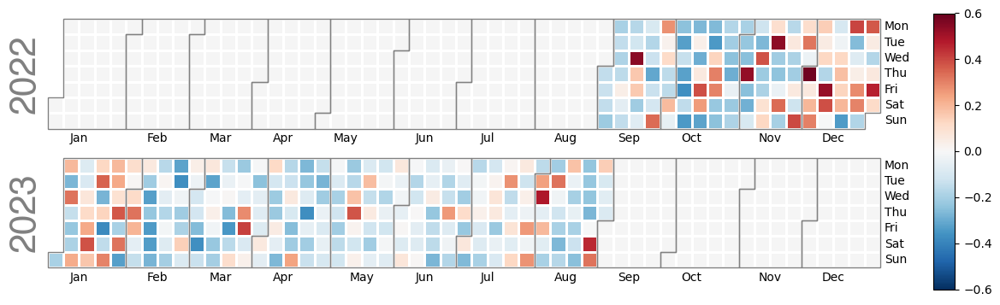

Daytime spearman p-value:


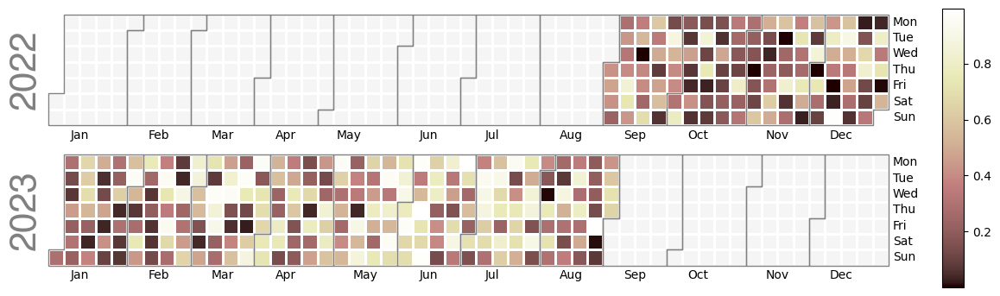

Nighttime spearman correlation:


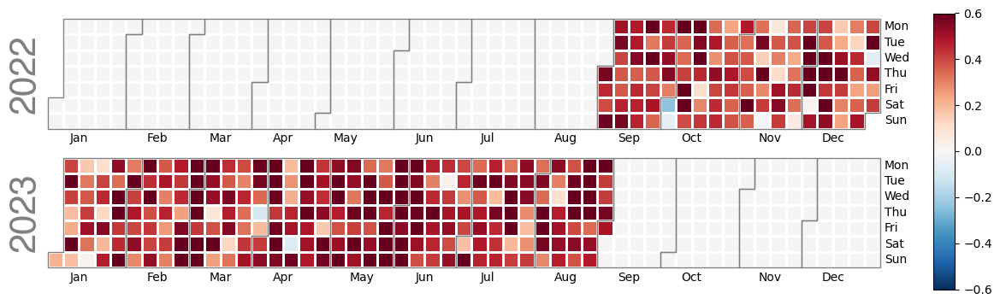

Nighttime spearman p-value:


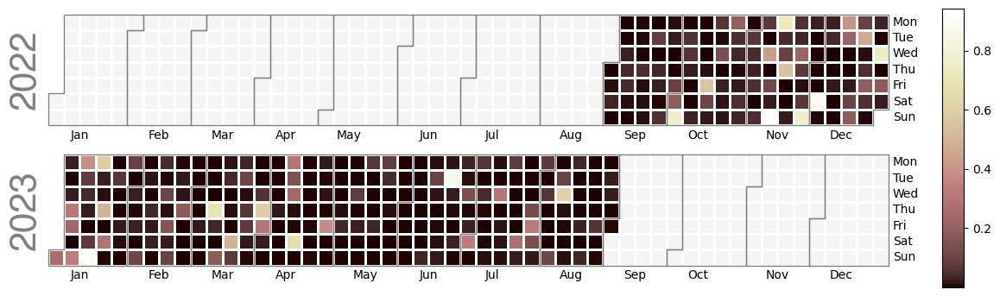

In [14]:
plot_calplot(year, 'BuAre_sum', 200)

Daytime spearman correlation:


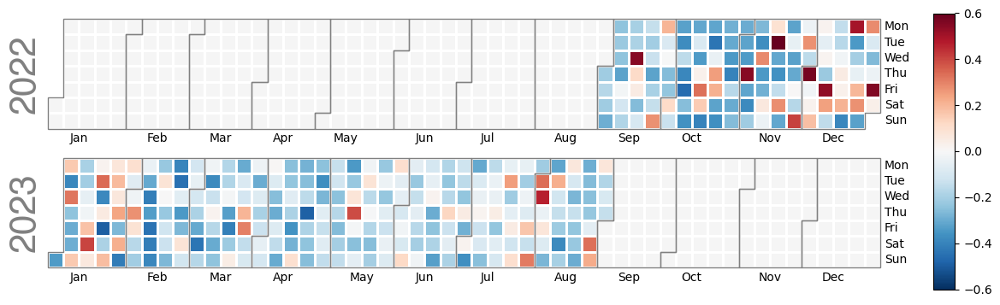

Daytime spearman p-value:


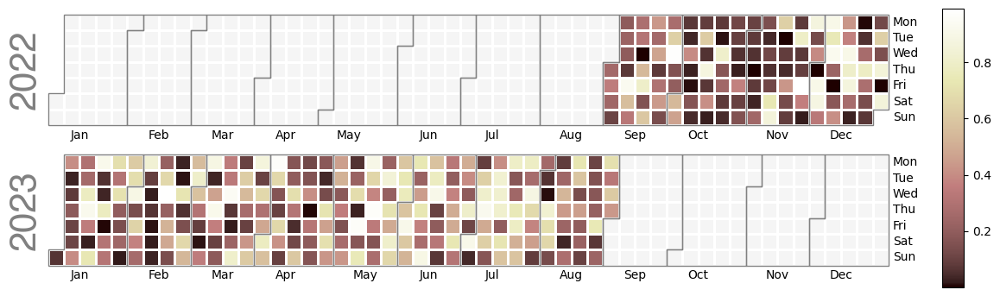

Nighttime spearman correlation:


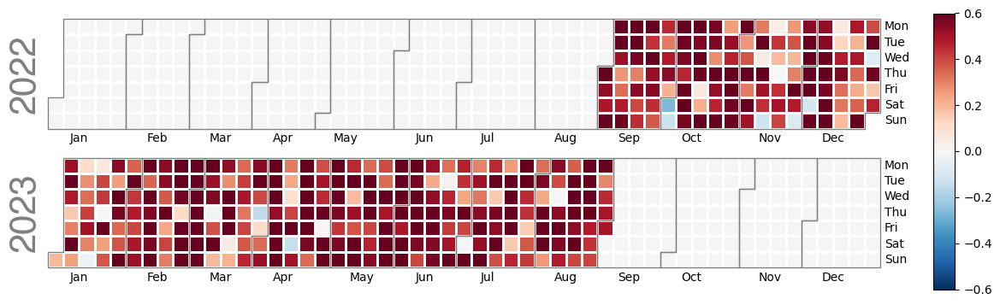

Nighttime spearman p-value:


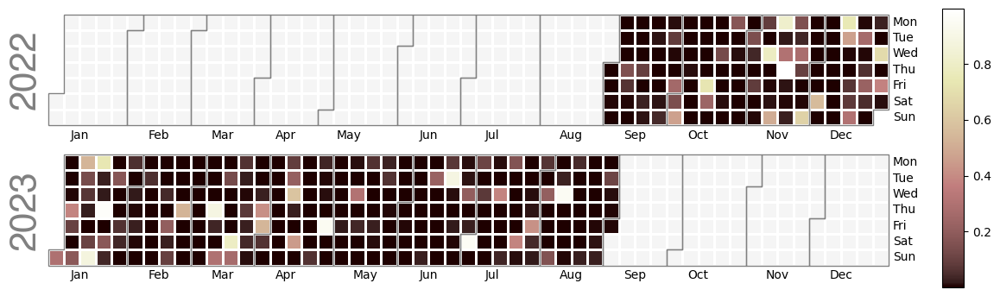

In [10]:
plot_calplot(year, 'BuVol_3D_sum', 200)

# 300m

Daytime spearman correlation:


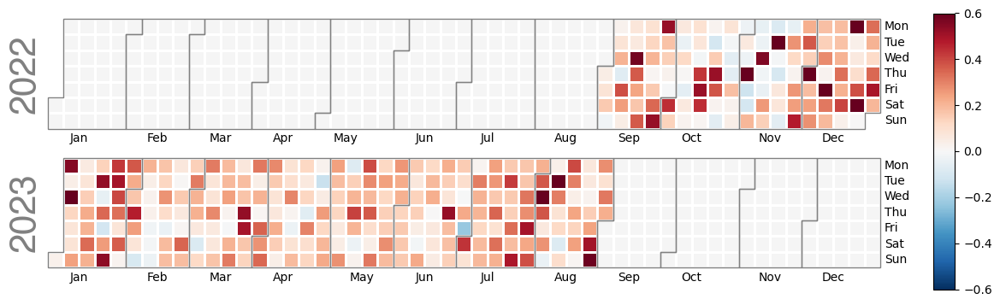

Daytime spearman p-value:


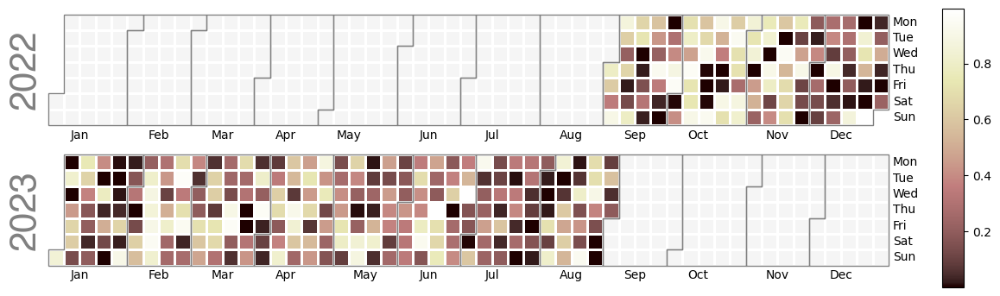

Nighttime spearman correlation:


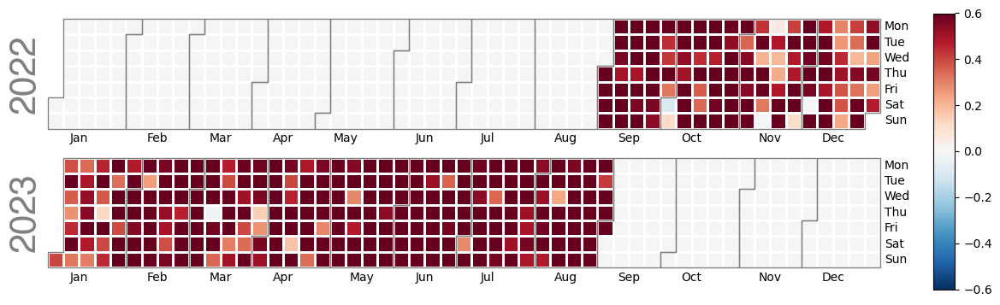

Nighttime spearman p-value:


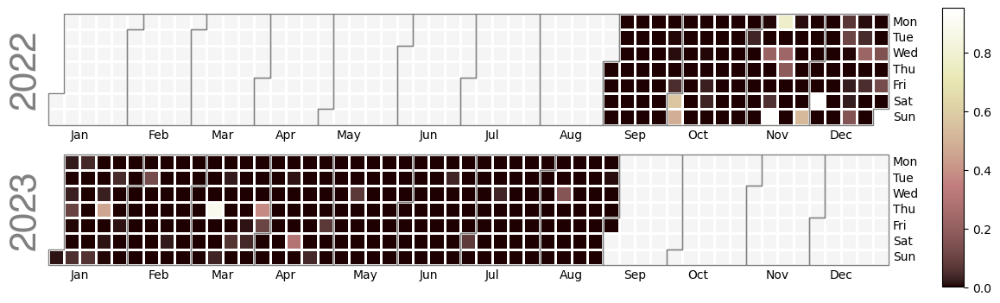

In [12]:
plot_calplot(year, 'BuVol_3D_sum', 300)

Daytime spearman correlation:


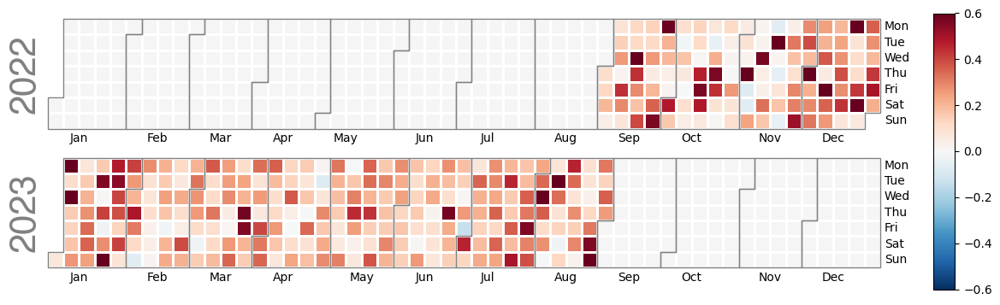

Daytime spearman p-value:


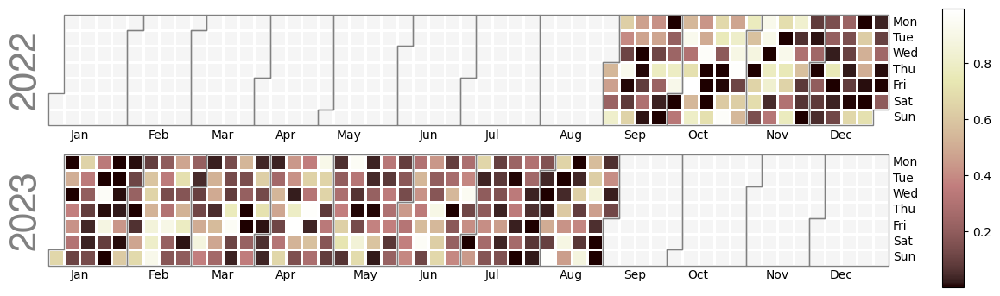

Nighttime spearman correlation:


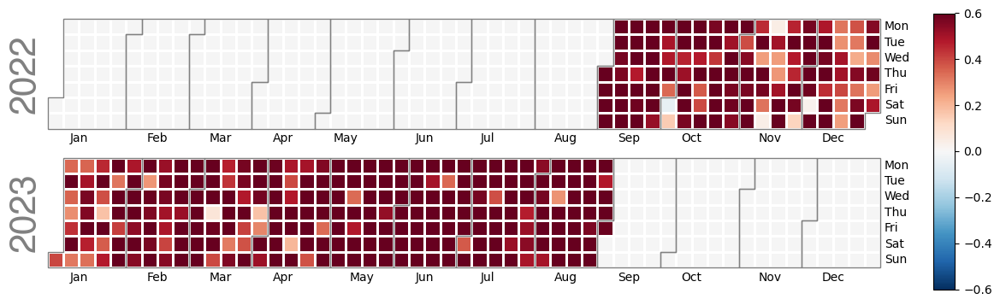

Nighttime spearman p-value:


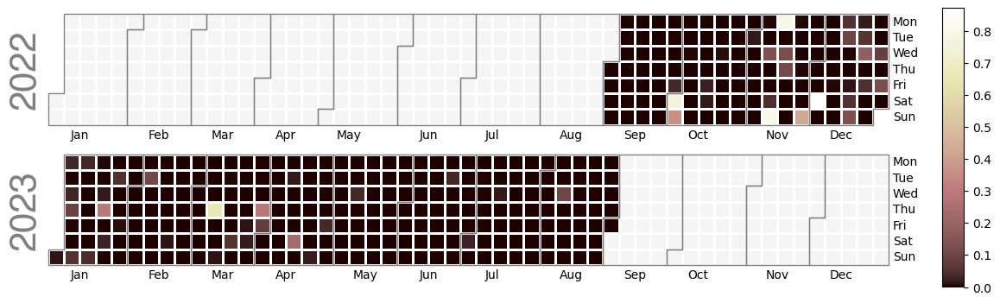

In [15]:
plot_calplot(year, 'BuAre_sum', 300)

In [31]:
stats_dict = pd.read_csv(f'/Users/lisawink/Documents/paper1/data/processed_data/diurnal/all_year/{year,var,radius}.csv') 

In [32]:
stats_dict['Time'] = pd.to_datetime(stats_dict['Time'])

In [33]:
# select all hours at 13:00
stats_dict_13 = stats_dict[stats_dict['Time'].dt.hour == 13]
stats_dict_03 = stats_dict[stats_dict['Time'].dt.hour == 3]

In [34]:
stats_dict_13 = stats_dict_13.drop(columns=['Unnamed: 0','Parameter.1'])
stats_dict_03 = stats_dict_03.drop(columns=['Unnamed: 0','Parameter.1'])

In [36]:
stats_dict_13.index = stats_dict_13['Time'].dt.date
stats_dict_03.index = stats_dict_03['Time'].dt.date

In [37]:
stats_dict_13[stats_dict_13['Time'].dt.year == 2023]['Spearman Correlation']

Time
2023-01-01   -0.042112
2023-01-02    0.313634
2023-01-03   -0.087581
2023-01-04    0.394480
2023-01-05   -0.118168
                ...   
2023-08-27    0.460844
2023-08-28    0.186910
2023-08-29   -0.063508
2023-08-30   -0.009359
2023-08-31   -0.067525
Name: Spearman Correlation, Length: 243, dtype: float64

In [38]:
stats_dict_13.index = pd.to_datetime(stats_dict_13.index)
stats_dict_03.index = pd.to_datetime(stats_dict_03.index)

### Day (300m)

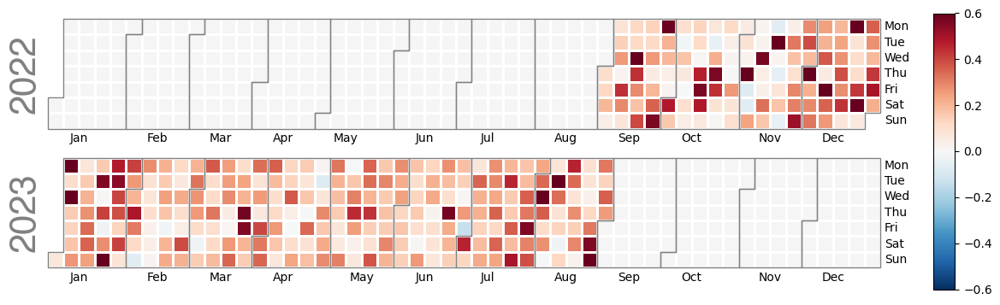

In [13]:
calplot.calplot(stats_dict_13['Spearman Correlation'], cmap='RdBu_r',vmin=-0.6,vmax=0.6)
plt.savefig('/Users/lisawink/Documents/paper1/figures/temperature_building_area_spearman_13.png',bbox_inches='tight')

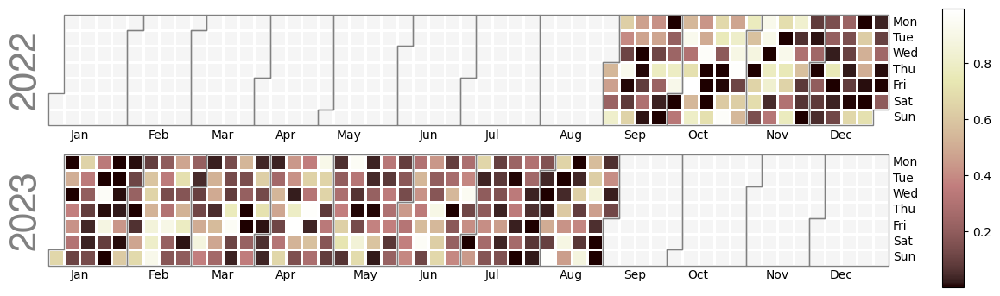

In [14]:
calplot.calplot(stats_dict_13['Spearman p-value'], cmap='pink')
plt.savefig('/Users/lisawink/Documents/paper1/figures/temperature_building_area_spearman_pvalue_13.png',bbox_inches='tight')

### Day (200m)

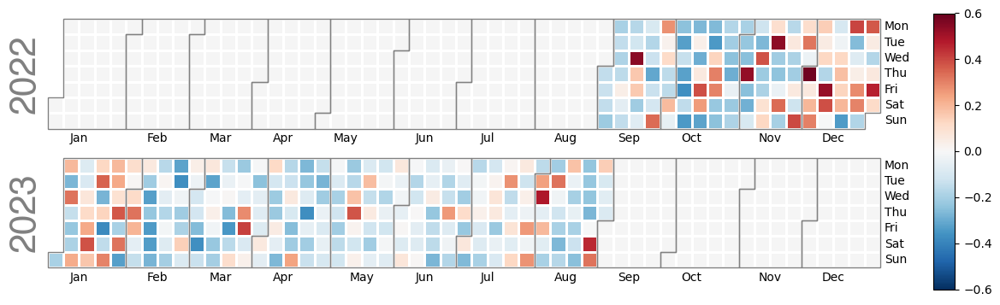

In [24]:
calplot.calplot(stats_dict_13['Spearman Correlation'], cmap='RdBu_r',vmin=-0.6,vmax=0.6)
plt.savefig('/Users/lisawink/Documents/paper1/figures/temperature_building_area_spearman_13.png',bbox_inches='tight')

### Day (100m)

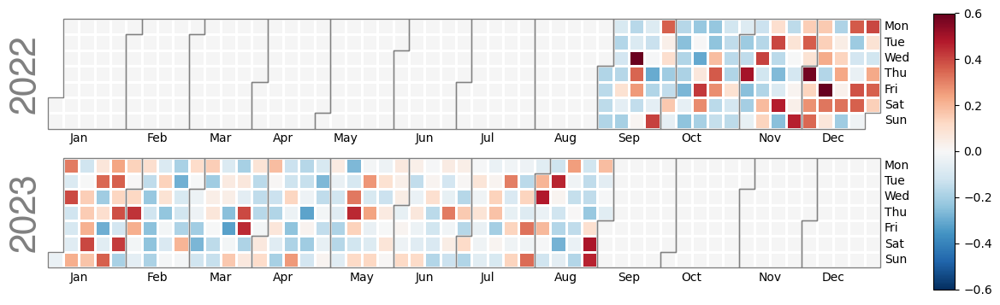

In [39]:
calplot.calplot(stats_dict_13['Spearman Correlation'], cmap='RdBu_r',vmin=-0.6,vmax=0.6)
plt.savefig('/Users/lisawink/Documents/paper1/figures/temperature_building_area_spearman_13.png',bbox_inches='tight')

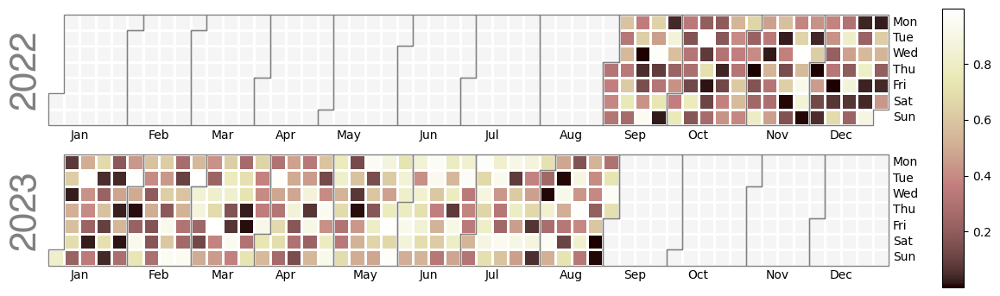

In [40]:
calplot.calplot(stats_dict_13['Spearman p-value'], cmap='pink')
plt.savefig('/Users/lisawink/Documents/paper1/figures/temperature_building_area_spearman_pvalue_13.png',bbox_inches='tight')

# Night

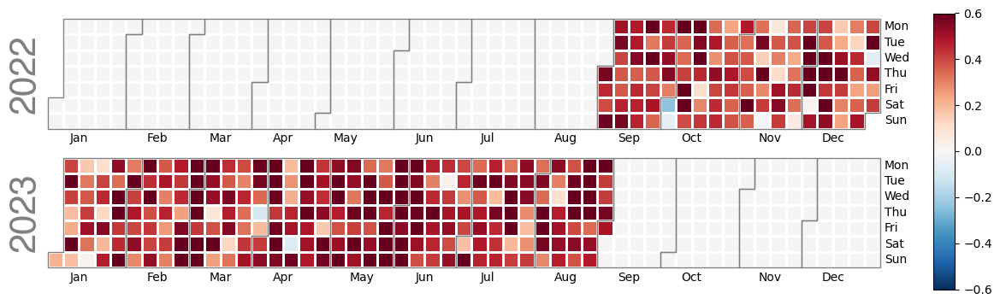

In [71]:
calplot.calplot(stats_dict_03['Spearman Correlation'], cmap='RdBu_r',vmin=-0.6,vmax=0.6)
plt.savefig('/Users/lisawink/Documents/paper1/figures/temperature_building_area_spearman_03.png',bbox_inches='tight')

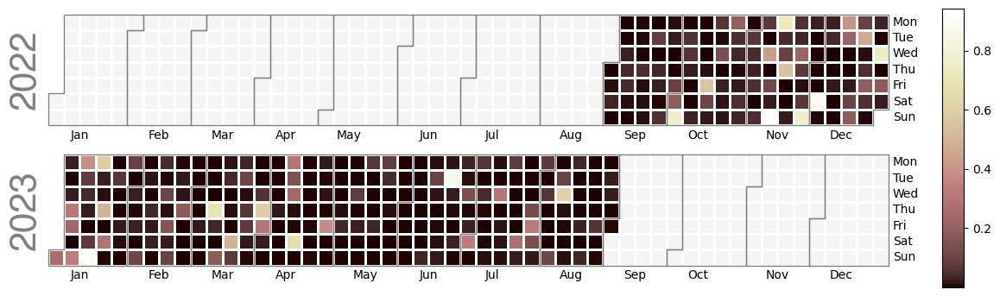

In [72]:
calplot.calplot(stats_dict_03['Spearman p-value'], cmap='pink')
plt.savefig('/Users/lisawink/Documents/paper1/figures/temperature_building_area_spearman_03_pvalue.png',bbox_inches='tight')

In [85]:
stats_dict_13['Spearman p-value'].values.tolist()

[0.4205794798521948,
 0.4726835045689856,
 0.4222875636691714,
 0.2339574031441106,
 0.2911731367955561,
 0.4339135839797107,
 0.3225886229307129,
 0.400637768715729,
 0.8345083003596447,
 0.7383706087773572,
 0.4346033734489133,
 0.3612515851458483,
 0.5438365935199192,
 0.0016875737926517,
 0.3857502097427987,
 0.4023880359816805,
 0.252939409006887,
 0.6923830969817162,
 0.6090792182133721,
 0.3440888652475268,
 0.4959347293416866,
 0.0856923756121171,
 0.4679856582832257,
 0.5647883818769709,
 0.0605321730089453,
 0.1327258206859358,
 0.8818083608712953,
 0.5329409156540019,
 0.3944216819314732,
 0.3981835088812182,
 0.305657634973386,
 0.7859979498841676,
 0.185195692068128,
 0.0678220018329775,
 0.4634034557016268,
 0.0739907699488713,
 0.0421392130541501,
 0.414241592186694,
 0.0594103040634372,
 0.1431042490000317,
 0.8446017610987495,
 0.1102920290571627,
 0.7465060887978539,
 0.0316057999868965,
 0.1671431166953249,
 0.079508544518575,
 0.1494259021480824,
 0.0579334342421997

In [94]:
[1,1,1] +data[:4]

[1,
 1,
 1,
 0.4205794798521948,
 0.4726835045689856,
 0.4222875636691714,
 0.2339574031441106]

In [95]:
data = stats_dict_13['Spearman p-value'].values.tolist()  # Replace with your actual list
subdivided = []



# First group: 4 elements
subdivided.append([1,1,1]+data[:4])

# Next 16 groups: 7 elements each
start = 4
for _ in range(16):
    subdivided.append(data[start:start + 7])
    start += 7

# 17th group: 6 elements
subdivided.append(data[start:start + 6]+[1])
start += 6



# 18th group: 1 element
subdivided.append([1,1,1,1,1,1]+data[start:start + 1])
start += 1

# Remaining groups: 7 elements each, except the last group (4 elements)
while start < len(data) - 4:
    subdivided.append(data[start:start + 7])
    start += 7

# Last group: 4 elements
subdivided.append(data[start:]+[1,1,1])


# Print or use the subdivided list
print(subdivided)

[[1, 1, 1, 0.4205794798521948, 0.4726835045689856, 0.4222875636691714, 0.2339574031441106], [0.2911731367955561, 0.4339135839797107, 0.3225886229307129, 0.400637768715729, 0.8345083003596447, 0.7383706087773572, 0.4346033734489133], [0.3612515851458483, 0.5438365935199192, 0.0016875737926517, 0.3857502097427987, 0.4023880359816805, 0.252939409006887, 0.6923830969817162], [0.6090792182133721, 0.3440888652475268, 0.4959347293416866, 0.0856923756121171, 0.4679856582832257, 0.5647883818769709, 0.0605321730089453], [0.1327258206859358, 0.8818083608712953, 0.5329409156540019, 0.3944216819314732, 0.3981835088812182, 0.305657634973386, 0.7859979498841676], [0.185195692068128, 0.0678220018329775, 0.4634034557016268, 0.0739907699488713, 0.0421392130541501, 0.414241592186694, 0.0594103040634372], [0.1431042490000317, 0.8446017610987495, 0.1102920290571627, 0.7465060887978539, 0.0316057999868965, 0.1671431166953249, 0.079508544518575], [0.1494259021480824, 0.0579334342421997, 0.4793476991574048, 0

In [96]:
np.array(subdivided)

array([[1.00000000e+00, 1.00000000e+00, 1.00000000e+00, 4.20579480e-01,
        4.72683505e-01, 4.22287564e-01, 2.33957403e-01],
       [2.91173137e-01, 4.33913584e-01, 3.22588623e-01, 4.00637769e-01,
        8.34508300e-01, 7.38370609e-01, 4.34603373e-01],
       [3.61251585e-01, 5.43836594e-01, 1.68757379e-03, 3.85750210e-01,
        4.02388036e-01, 2.52939409e-01, 6.92383097e-01],
       [6.09079218e-01, 3.44088865e-01, 4.95934729e-01, 8.56923756e-02,
        4.67985658e-01, 5.64788382e-01, 6.05321730e-02],
       [1.32725821e-01, 8.81808361e-01, 5.32940916e-01, 3.94421682e-01,
        3.98183509e-01, 3.05657635e-01, 7.85997950e-01],
       [1.85195692e-01, 6.78220018e-02, 4.63403456e-01, 7.39907699e-02,
        4.21392131e-02, 4.14241592e-01, 5.94103041e-02],
       [1.43104249e-01, 8.44601761e-01, 1.10292029e-01, 7.46506089e-01,
        3.16058000e-02, 1.67143117e-01, 7.95085445e-02],
       [1.49425902e-01, 5.79334342e-02, 4.79347699e-01, 9.94164508e-02,
        1.03200246e-01, 2

In [132]:
plot_data.data

array([[           nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan,            nan,            nan, 2.33957403e-01,
        4.34603373e-01, 6.92383097e-01, 6.05321730e-02, 7.85997950e-01,
        5.94103041e-02, 7.95085445e-02, 1.83749348e-01, 3.13765289e-01,
        6.04277200e-01, 4.99170322e-01, 2.86133681e-01, 2.65508982e-02,
        1.01054049e-01, 9.81093765e-01, 6.04806925e-02, 3.31856260e-01,
                   nan],
       [           nan,            nan,

In [143]:
# import berlin colormap from matplotlib
import matplotlib.pyplot as plt

cmap = plt.get_cmap('berlin')


ValueError: 'berlin' is not a valid value for name; supported values are 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Grays', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_grey', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gist_yerg', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'grey', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r'

In [147]:
import matplotlib

In [148]:
matplotlib.__version__

'3.8.3'

(<Figure size 1250x340 with 3 Axes>,
 array([<Axes: ylabel='2022'>, <Axes: ylabel='2023'>], dtype=object))

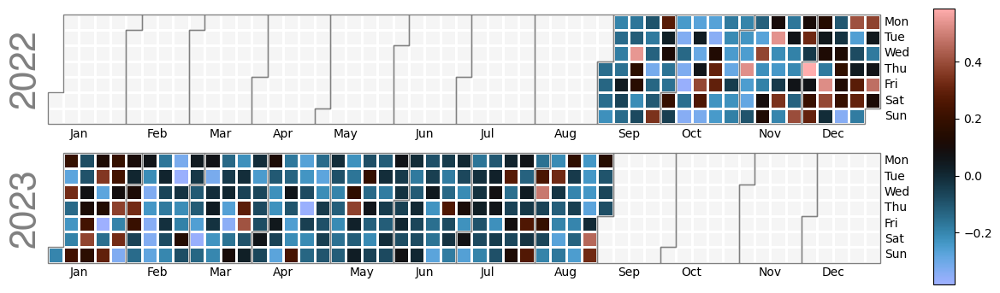

In [30]:
calplot.calplot(stats_dict_13['Spearman Correlation'], cmap='berlin')

(<Figure size 1250x340 with 3 Axes>,
 array([<Axes: ylabel='2022'>, <Axes: ylabel='2023'>], dtype=object))

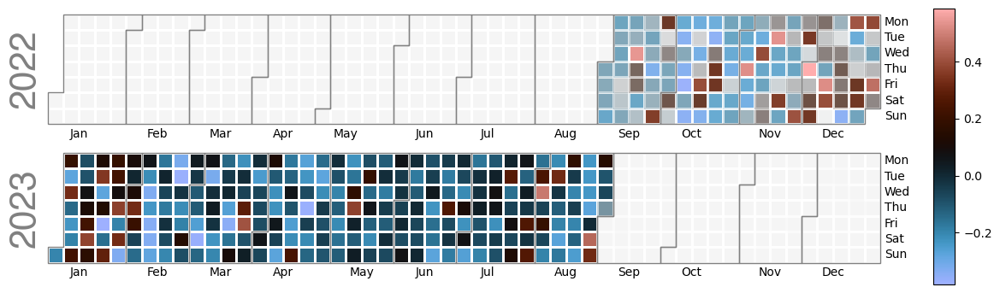

In [31]:
calplot.calplot(stats_dict_13['Spearman Correlation'], cmap='berlin',alpha=(1-np.nan_to_num(plot_data.data)))

(<Figure size 1250x340 with 3 Axes>,
 array([<Axes: ylabel='2022'>, <Axes: ylabel='2023'>], dtype=object))

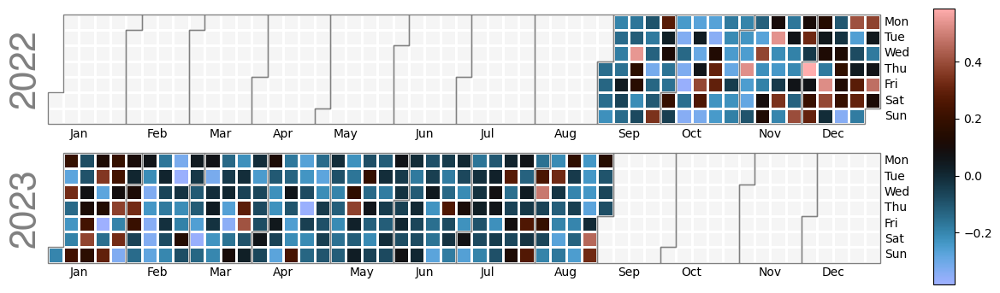

In [40]:
calplot.calplot(stats_dict_13['Spearman Correlation'], cmap='berlin')

(<Figure size 1250x340 with 3 Axes>,
 array([<Axes: ylabel='2022'>, <Axes: ylabel='2023'>], dtype=object))

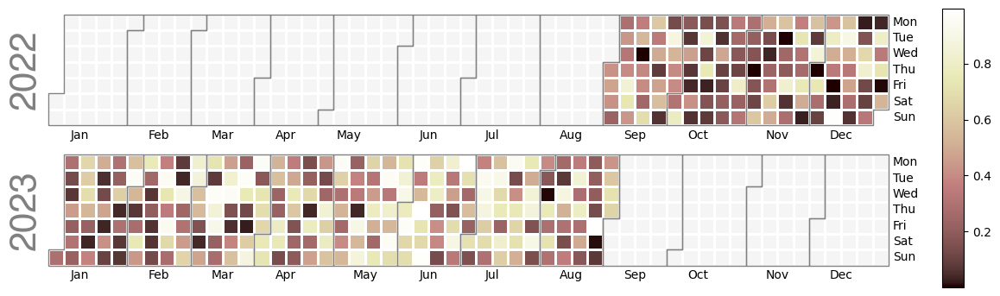

In [39]:
calplot.calplot(stats_dict_13['Spearman p-value'], cmap='pink')

(<Figure size 1250x340 with 3 Axes>,
 array([<Axes: ylabel='2022'>, <Axes: ylabel='2023'>], dtype=object))

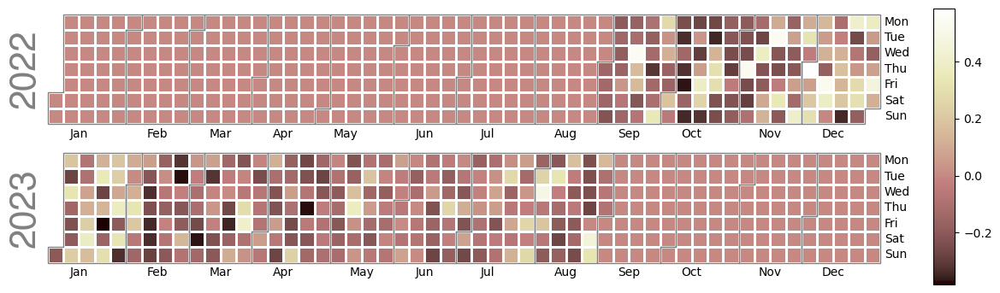

In [65]:
calplot.calplot(df['Spearman Correlation'], cmap='pink')

In [101]:
import calendar
import datetime
from dateutil.relativedelta import relativedelta

import numpy as np
import pandas as pd

from matplotlib.colors import ColorConverter, ListedColormap
from matplotlib.patches import Polygon
import matplotlib.pyplot as plt

def yearplot(data, year=None, how='sum',
             vmin=None, vmax=None,
             cmap='viridis', fillcolor='whitesmoke',
             linewidth=1, linecolor=None, edgecolor='gray',
             daylabels=calendar.day_abbr[:], dayticks=True,
             dropzero=None,
             textformat=None, textfiller='', textcolor='black',
             monthlabels=calendar.month_abbr[1:], monthlabeloffset=15,
             monthticks=True,
             ax=None, **kwargs):
    """
    Plot one year from a timeseries as a calendar heatmap.

    Parameters
    ----------
    data : Series
        Data for the plot. Must be indexed by a DatetimeIndex.
    year : integer
        Only data indexed by this year will be plotted. If `None`, the first
        year for which there is data will be plotted.
    how : string
        Method for resampling data by day. If `None`, assume data is already
        sampled by day and don't resample. Otherwise, this is passed to Pandas
        `Series.resample`.
    vmin, vmax : floats
        Values to anchor the colormap. If `None`, min and max are used after
        resampling data by day.
    cmap : matplotlib colormap name or object
        The mapping from data values to color space.
    fillcolor : matplotlib color
        Color to use for days without data.
    linewidth : float
        Width of the lines that will divide each day.
    linecolor : color
        Color of the lines that will divide each day. If `None`, the axes
        background color is used, or 'white' if it is transparent.
    daylabels : list
        Strings to use as labels for days, must be of length 7.
    dayticks : list or int or bool
        If `True`, label all days. If `False`, don't label days. If a list,
        only label days with these indices. If an integer, label every n day.
    dropzero : bool
        If `True`, don't fill a color for days with a zero value.
    monthlabels : list
        Strings to use as labels for months, must be of length 12.
    monthlabeloffset : integer
        Day offset for labels for months to adjust horizontal alignment.
    monthticks : list or int or bool
        If `True`, label all months. If `False`, don't label months. If a
        list, only label months with these indices. If an integer, label every
        n month.
    edgecolor : color
        Color of the lines that will divide months.
    textformat : string
        Text format string for grid cell text
    textfiller : string
        Fallback text for grid cell text for cells with no data
    textcolor : color
        Color of the grid cell text
    ax : matplotlib Axes
        Axes in which to draw the plot, otherwise use the currently-active
        Axes.
    kwargs : other keyword arguments
        All other keyword arguments are passed to matplotlib `ax.pcolormesh`.

    Returns
    -------
    ax : matplotlib Axes
        Axes object with the calendar heatmap.

    """

    if year is None:
        year = data.index.sort_values()[0].year

    if how is None:
        # Assume already sampled by day.
        by_day = data
    else:
        # Sample by day.
        by_day = data.resample('D').agg(how)

    # Default to dropping zero values for a series with over 50% of rows being zero.
    if not (dropzero is False) and (by_day[by_day == 0].count() > 0.5 * by_day.count()):
        dropzero = True

    if dropzero:
        by_day = by_day.replace({0: np.nan}).dropna()

    # Min and max per day.
    if vmin is None:
        vmin = by_day.min()
    if vmax is None:
        vmax = by_day.max()

    if ax is None:
        ax = plt.gca()

    if linecolor is None:
        # Unfortunately, linecolor cannot be transparent, as it is drawn on
        # top of the heatmap cells. Therefore it is only possible to mimic
        # transparent lines by setting them to the axes background color. This
        # of course won't work when the axes itself has a transparent
        # background so in that case we default to white which will usually be
        # the figure or canvas background color.
        linecolor = ax.get_facecolor()
        if ColorConverter().to_rgba(linecolor)[-1] == 0:
            linecolor = 'white'

    # Filter on year.
    try:
      # could be empty due to `dropzero`
      by_day = by_day[str(year)]
    except KeyError:
      pass

    # Add missing days.
    by_day = by_day.reindex(
        pd.date_range(start=str(year), end=str(year + 1),
                      freq='D', tz=by_day.index.tzinfo)[:-1])

    # Create data frame we can pivot later.
    by_day = pd.DataFrame({'data': by_day,
                           'fill': 1,
                           'day': by_day.index.dayofweek,
                           'week': by_day.index.isocalendar().week})

    # There may be some days assigned to previous year's last week or
    # next year's first week. We create new week numbers for them so
    # the ordering stays intact and week/day pairs unique.
    by_day.loc[(by_day.index.month == 1) & (by_day.week > 50), 'week'] = 0
    by_day.loc[(by_day.index.month == 12) & (by_day.week < 10), 'week'] \
        = by_day.week.max() + 1

    # Pivot data on day and week and mask NaN days.
    plot_data = by_day.pivot(index='day', columns='week', values='data').values[::-1]
    plot_data = np.ma.masked_where(np.isnan(plot_data), plot_data)

    # Do the same for all days of the year, not just those we have data for.
    fill_data = by_day.pivot(index='day', columns='week', values='fill').values[::-1]
    fill_data = np.ma.masked_where(np.isnan(fill_data), fill_data)

    # Draw heatmap for all days of the year with fill color.
    ax.pcolormesh(fill_data, vmin=0, vmax=1, cmap=ListedColormap([fillcolor]))

    # Draw heatmap.
    kwargs['linewidth'] = linewidth
    kwargs['edgecolors'] = linecolor
    ax.pcolormesh(plot_data, vmin=vmin, vmax=vmax, cmap=cmap, **kwargs)

In [22]:
data = stats_dict_13['Spearman p-value']

In [23]:
year=None
how='sum'
dropzero=None
vmin=None
vmax=None
ax=None
linewidth=1
linecolor=None
edgecolor='gray'
cmap='viridis'
fillcolor='whitesmoke'

In [25]:
if year is None:
    year = data.index.sort_values()[0].year

if how is None:
    # Assume already sampled by day.
    by_day = data
else:
    # Sample by day.
    by_day = data.resample('D').agg(how)

# Default to dropping zero values for a series with over 50% of rows being zero.
if not (dropzero is False) and (by_day[by_day == 0].count() > 0.5 * by_day.count()):
    dropzero = True

if dropzero:
    by_day = by_day.replace({0: np.nan}).dropna()

# Min and max per day.
if vmin is None:
    vmin = by_day.min()
if vmax is None:
    vmax = by_day.max()

if ax is None:
    ax = plt.gca()



# Filter on year.
try:
    # could be empty due to `dropzero`
    by_day = by_day[str(year)]
except KeyError:
    pass

# Add missing days.
by_day = by_day.reindex(
    pd.date_range(start=str(year), end=str(year + 1),
                    freq='D', tz=by_day.index.tzinfo)[:-1])

# Create data frame we can pivot later.
by_day = pd.DataFrame({'data': by_day,
                        'fill': 1,
                        'day': by_day.index.dayofweek,
                        'week': by_day.index.isocalendar().week})

# There may be some days assigned to previous year's last week or
# next year's first week. We create new week numbers for them so
# the ordering stays intact and week/day pairs unique.
by_day.loc[(by_day.index.month == 1) & (by_day.week > 50), 'week'] = 0
by_day.loc[(by_day.index.month == 12) & (by_day.week < 10), 'week'] \
    = by_day.week.max() + 1

# Pivot data on day and week and mask NaN days.
plot_data = by_day.pivot(index='day', columns='week', values='data').values[::-1]
plot_data = np.ma.masked_where(np.isnan(plot_data), plot_data)

# Do the same for all days of the year, not just those we have data for.
fill_data = by_day.pivot(index='day', columns='week', values='fill').values[::-1]
fill_data = np.ma.masked_where(np.isnan(fill_data), fill_data)

# Draw heatmap for all days of the year with fill color.
ax.pcolormesh(fill_data, vmin=0, vmax=1, cmap=ListedColormap([fillcolor]))

# Draw heatmap.
#kwargs['linewidth'] = linewidth
#kwargs['edgecolors'] = linecolor
ax.pcolormesh(plot_data, vmin=vmin, vmax=vmax, cmap=cmap)

NameError: name 'ListedColormap' is not defined

In [27]:
fill_data.shape

(7, 53)

In [28]:
plot_data.data.shape

(7, 53)

In [29]:
np.nan_to_num(plot_data.data)

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.33957403e-01,
        4.34603373e-01, 6.92383097e-01, 6.05321730e-02, 7.85997950e-01,
        5.94103041e-02, 7.95085445e-02, 1.83749348e-01, 3.13765289e-01,
        6.04277200e-01, 4.99170322e-01, 2.86133681e-01, 2.65508982e-02,
        1.01054049e-01, 9.81093765e-01, 6.04806925e-02, 3.31856260e-01,
        0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00,

In [133]:
np.nan_to_num(plot_data.data)

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.33957403e-01,
        4.34603373e-01, 6.92383097e-01, 6.05321730e-02, 7.85997950e-01,
        5.94103041e-02, 7.95085445e-02, 1.83749348e-01, 3.13765289e-01,
        6.04277200e-01, 4.99170322e-01, 2.86133681e-01, 2.65508982e-02,
        1.01054049e-01, 9.81093765e-01, 6.04806925e-02, 3.31856260e-01,
        0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00,

In [136]:
# replace nan with 0 in plot_data.data
alpha_values = np.nan_to_num(plot_data.data)

In [137]:
1 - alpha_values

array([[1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        0.7660426 , 0.56539663, 0.3076169 , 0.93946783, 0.21400205,
        0.9405897 , 0.92049146, 0.81625065, 0.68623471, 0.3957228 ,
        0.50082968, 0.71386632, 0.9734491 , 0.89894595, 0.01890624,
        0.93951931, 0.66814374, 1.        ],
       [1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        , 1.        , 1.        ,
   

In [ ]:
# for every value in plot_data.data, 1 - value

alpha_values = 1 - alpha_values